# CSD estimation analysis — E. coli (Ecoli_Analysis_Notebooks/estimation)

This notebook aggregates per-edge observational CSV outputs from

`notebooks/Ecoli_Analysis_Notebooks/estimation/{RUN_ID}/csv`.

It preserves intervention provenance for validation, but excludes intervention
rows from performance summaries and plots. It produces plots showing:

1. **Estimated path coefficient** vs **ground-truth beta**
2. **Error metrics** (MAE / RMSE / bias) across simulation parameters
3. **Residual variance** changes with parameters, and its relationship to error


In [5]:
from __future__ import annotations

from pathlib import Path

import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
import json

from IPython.display import Image, display

REPO = Path().resolve()
while not (REPO / 'src' / 'nocap').exists() and REPO != REPO.parent:
    REPO = REPO.parent

INPUT_DIR = REPO / '/home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/csv'
NB_DIR = INPUT_DIR.parent
VIZ_DIR = REPO / NB_DIR / 'visualizations'
VIZ_DIR.mkdir(exist_ok=True)
RUN_METADATA = NB_DIR / 'run_metadata.json'
run_metadata = {}
if RUN_METADATA.exists():
    run_metadata = pd.read_json(RUN_METADATA, typ='series').to_dict()

print('Input CSV dir:', INPUT_DIR)
csv_paths = sorted(INPUT_DIR.glob('*.csv'))
print('Num CSV files:', len(csv_paths))
assert len(csv_paths) > 0, f'No CSVs found in: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/csv'
print('First CSV:', csv_paths[0].name)


Input CSV dir: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/csv
Num CSV files: 336
First CSV: csd-20260805_174708_paired_hierarchical_0_0_0024d27eee61bb4b_observational.csv


In [6]:
# ============================================================
# Load, validate, partition, and derive error columns
# ============================================================

CURRENT_REQUIRED_COLUMNS = [
    'experiment_id', 'design_mode', 'seed_schema_version', 'scm_replicate_id',
    'data_replicate_id', 'parameter_condition_id', 'target_effect_id',
    'pairing_scope', 'sample_parent_id', 'sample_selection_rule', 'run_status',
    'trial', 'n_samples', 'missing_edge_rate', 'missing_data_rate',
    'missing_data_mechanism', 'seed', 'scm_seed', 'data_seed', 'cause', 'effect',
    'same_scc', 'status', 'adjustment_set', 'n_rows_used',
    'estimated_path_coefficient', 'stderr', 'residual_variance', 't_value',
    'ground_truth_beta', 'scm_true_missing_edges_count', 'error',
    'intervention_id', 'intervention_set_index', 'intervention_genes',
    'intervention_n_genes', 'intervention_semantics', 'target_removed',
    'target_present_in_intervened_graph', 'recovery_status',
]
NUMERIC_COLUMNS = [
    'n_samples', 'missing_edge_rate', 'missing_data_rate', 'seed', 'scm_seed',
    'data_seed', 'trial', 'n_rows_used', 'estimated_path_coefficient', 'stderr',
    'residual_variance', 't_value', 'ground_truth_beta',
    'scm_true_missing_edges_count', 'intervention_set_index',
]

dfs = []
schema_mismatches = []
for p in csv_paths:
    try:
        df = pd.read_csv(p)
    except pd.errors.EmptyDataError:
        print(f"CSV {p} has no data.")
    missing = sorted(set(CURRENT_REQUIRED_COLUMNS) - set(df.columns))
    if missing:
        schema_mismatches.append({'file': p.name, 'missing': ', '.join(missing)})
    df['csv_file'] = p.name
    dfs.append(df)
if schema_mismatches:
    print('CSV schema mismatches (legacy files may be supported only if analysis columns exist):')
    display(pd.DataFrame(schema_mismatches))
data = pd.concat(dfs, ignore_index=True)
analysis_required = [
    'status', 'n_samples', 'missing_edge_rate', 'missing_data_rate',
    'missing_data_mechanism', 'cause', 'effect', 'estimated_path_coefficient',
    'ground_truth_beta', 'scm_seed', 'data_seed', 'seed',
]
missing_analysis = sorted(set(analysis_required) - set(data.columns))
assert not missing_analysis, f'Missing required analysis columns: {missing_analysis}'

print('Total rows:', f"{len(data):,}")
print('Status counts:')
print(data['status'].value_counts(dropna=False))
for col in NUMERIC_COLUMNS:
    if col in data:
        data[col] = pd.to_numeric(data[col], errors='coerce')
for col in ['same_scc', 'target_removed', 'target_present_in_intervened_graph']:
    if col in data:
        data[col] = data[col].astype('string').str.strip().str.lower().map(
            {'true': True, 'false': False, '1': True, '0': False}
        )

def intervention_genes_valid(value):
    if pd.isna(value) or str(value).strip() == '':
        return True
    try:
        parsed = json.loads(value) if isinstance(value, str) else value
        return isinstance(parsed, list)
    except (TypeError, json.JSONDecodeError):
        return False

if 'intervention_genes' in data:
    invalid_genes = ~data['intervention_genes'].apply(intervention_genes_valid)
    assert not invalid_genes.any(), 'Invalid intervention_genes JSON/list text found'

intervention_id = data['intervention_id'].astype('string').fillna('').str.strip()
observational = intervention_id.eq('') | intervention_id.str.lower().eq('observational')
observational_df = data.loc[observational].copy()
intervention_df = data.loc[~observational].copy()
print('Observational rows:', f"{len(observational_df):,}")
print('Intervention rows:', f"{len(intervention_df):,}")
if len(intervention_df):
    print('Intervention rows are preserved for diagnostics and excluded from all performance summaries and plots.')
unexpected_intervention_metadata = intervention_df[
    intervention_df['target_removed'].isna() | intervention_df['target_present_in_intervened_graph'].isna()
]
print('Unexpected intervention metadata rows:', f"{len(unexpected_intervention_metadata):,}")
assert len(observational_df), 'No observational rows found after intervention partition'

# Core derived metrics use signed log2 path coefficients. The source error is
# retained when valid; this derived value is the consistent analysis contract.
data['error'] = data['estimated_path_coefficient'] - data['ground_truth_beta']
data['abs_error'] = data['error'].abs()
data['sq_error'] = data['error'] ** 2
data['relative_slope_error'] = data['abs_error'] / data['ground_truth_beta'].abs()
data.loc[(data['ground_truth_beta'] == 0) | ~np.isfinite(data['relative_slope_error']), 'relative_slope_error'] = np.nan

completed = data['run_status'].astype('string').str.strip().str.lower().isin({'', 'complete', 'completed'})
eval_df = data.loc[
    observational & completed & data['status'].isin(['identifiable', 'insufficient_data'])
].copy()
print('Eval rows (observational, identifiable/insufficient_data):', f"{len(eval_df):,}")
print('Incomplete task rows excluded by run_status:', f"{(~completed).sum():,}")
print('Estimator errors/unidentifiable rows retained in data diagnostics and excluded from numeric metrics.')

print('Replicate intervals are empirical seed distributions, not row-bootstrap confidence intervals.')
print('Full mode includes SCM and observation variability; fixed-SCM mode is conditional on one SCM block.')

# Replicate summaries use seed identities rather than treating edge rows as replicates.
legacy_seed_fallback = eval_df['scm_seed'].isna() | eval_df['data_seed'].isna()
if legacy_seed_fallback.any():
    eval_df.loc[legacy_seed_fallback, 'scm_seed'] = eval_df.loc[legacy_seed_fallback, 'seed']
    eval_df.loc[legacy_seed_fallback, 'data_seed'] = eval_df.loc[legacy_seed_fallback, 'seed']
    print('Legacy fallback: seed is used for both SCM and data identities.')
assert eval_df[['scm_seed', 'data_seed']].notna().all().all(), 'Missing replicate seed identity'
assert eval_df[['n_samples', 'missing_edge_rate', 'missing_data_rate']].notna().all().all(), 'Missing cell parameter'

explicit_modes = set(observational_df['design_mode'].dropna().astype(str).str.strip()) if 'design_mode' in data else set()
assert len(explicit_modes) <= 1, f'Mixed observational design modes are not supported: {sorted(explicit_modes)}'
metadata_mode = run_metadata.get('design_mode')
if explicit_modes:
    design = next(iter(explicit_modes)).lower()
    if metadata_mode and str(metadata_mode).lower() != design:
        print(f'Warning: CSV design_mode={design!r} differs from run metadata design_mode={metadata_mode!r}; using CSV value.')
else:
    design = str(metadata_mode).lower() if metadata_mode else (
        'full' if any('full' in p.name for p in csv_paths) else
        ('fixed_scm' if any('fixed_scm' in p.name for p in csv_paths) else 'legacy')
    )
assert design in {'paired_hierarchical', 'fixed_scm', 'full', 'legacy'}, f'Unsupported design mode: {design}'
if design == 'paired_hierarchical':
    print('Paired-hierarchical artifacts use shared complete observations/scores, maximum sample parents, and prefix sample selection.')

unit_cols = ['experiment_id', 'parameter_condition_id', 'target_effect_id', 'pairing_scope', 'sample_parent_id', 'sample_selection_rule']
present_unit_cols = [col for col in unit_cols if col in observational_df]
unit_variants = observational_df.groupby(
    ['csv_file', 'parameter_condition_id', 'target_effect_id'], dropna=False
)[present_unit_cols].nunique(dropna=False)
assert (unit_variants <= 1).all().all(), 'Explicit design/provenance metadata varies within an edge-condition unit'

partition_summary = pd.DataFrame([{
    'total_rows': len(data),
    'observational_rows': len(observational_df),
    'intervention_rows_excluded': len(intervention_df),
    'incomplete_rows_excluded': int((~completed).sum()),
    'design_mode': design,
    'required_schema_valid': not bool(schema_mismatches),
}])
partition_summary.to_csv(NB_DIR / 'csd_estimation_schema_partition_summary.csv', index=False)

# missing_edge_rate defines the SCM block. In fixed-SCM mode, data seeds may
# be compared only within one edge-rate block: changing edge rate changes the
# generated SCM and therefore does not produce a conditional replicate.
scm_block_cols = ['missing_edge_rate']
if design == 'fixed_scm':
    block_seed_counts = (eval_df.groupby(scm_block_cols, dropna=False)['scm_seed']
        .nunique(dropna=True))
    assert (block_seed_counts <= 1).all(), (
        'fixed_scm requires one scm_seed per missing_edge_rate SCM block: '
        f'{block_seed_counts.to_dict()}'
    )
    block_metadata = (eval_df.groupby(scm_block_cols, dropna=False)
        .agg(scm_seed_count=('scm_seed', 'nunique'),
             missing_edge_counts=('scm_true_missing_edges_count', 'nunique')))
    print('Fixed-SCM blocks by missing_edge_rate:')
    display(block_metadata.reset_index())
    assert (block_metadata['scm_seed_count'] <= 1).all()
    beta_by_edge = (eval_df.groupby(scm_block_cols + ['cause', 'effect'], dropna=False)
        .agg(beta_values=('ground_truth_beta', 'nunique')).reset_index())
    assert (beta_by_edge['beta_values'] <= 1).all(), (
        'fixed_scm beta metadata varies within an edge/SCM block'
    )
    assert (block_metadata['missing_edge_counts'] <= 1).all(), (
        'fixed_scm true-missing-edge metadata varies within an SCM block'
    )

# Include the SCM identity in the grouping even for fixed-SCM mode. The
# edge-rate column is intentionally retained so different SCM blocks cannot
# be pooled into one interval.
eval_df['replicate_id'] = list(zip(eval_df['scm_seed'], eval_df['data_seed'])) if design != 'fixed_scm' else list(zip(eval_df['missing_edge_rate'], eval_df['data_seed']))
rep_cols = ['missing_data_mechanism', 'missing_data_rate', 'missing_edge_rate', 'n_samples', 'replicate_id']
replicate_metrics = (eval_df.groupby(rep_cols, dropna=False)
    .agg(MAE=('abs_error', 'mean'), RMSE=('sq_error', lambda x: float(np.sqrt(np.mean(x)))),
         bias=('error', 'mean'), median_abs_error=('abs_error', 'median')).reset_index())
ci_summary = (replicate_metrics.groupby(rep_cols[:-1], dropna=False)
    .agg(total_replicates=('replicate_id', 'nunique'), usable_replicates=('MAE', 'count'),
         mean_error=('bias', 'mean'), mean_MAE=('MAE', 'mean'), mean_RMSE=('RMSE', 'mean'), mean_bias=('bias', 'mean'),
         median_abs_error=('median_abs_error', 'mean'),
         error_lower=('bias', lambda x: x.quantile(.025)), error_upper=('bias', lambda x: x.quantile(.975)),
         MAE_lower=('MAE', lambda x: x.quantile(.025)), MAE_upper=('MAE', lambda x: x.quantile(.975)),
          RMSE_lower=('RMSE', lambda x: x.quantile(.025)), RMSE_upper=('RMSE', lambda x: x.quantile(.975))).reset_index())
assert not replicate_metrics.duplicated(rep_cols).any(), 'Duplicate rows counted as one replicate'
ci_summary['failed_replicates'] = ci_summary['total_replicates'] - ci_summary['usable_replicates']
ci_summary['unique_seed_count'] = ci_summary['usable_replicates']
ci_summary['scm_block_key'] = ci_summary['missing_edge_rate'].map(lambda x: f'missing_edge_rate={x}')
ci_summary['interval_interpretation'] = np.where(
    design == 'fixed_scm',
    'conditional on one SCM realization within this missing_edge_rate block',
    'end-to-end variability across SCM and observed-data generation')
ci_summary.to_csv(NB_DIR / f'csd_estimation_{design}_seed_ci_summary.csv', index=False)
print('Replicate design:', design)
print('Replicate completeness by cell:')
display(ci_summary[['missing_data_mechanism', 'missing_data_rate', 'missing_edge_rate', 'n_samples',
                    'total_replicates', 'usable_replicates', 'failed_replicates']])


def summarize(df: pd.DataFrame) -> dict[str, float]:
    mae = float(df['abs_error'].mean())
    rmse = float(np.sqrt(df['sq_error'].mean()))
    bias = float(df['error'].mean())
    med_abs = float(df['abs_error'].median())
    rel_mean = float(df['relative_slope_error'].mean())
    rel_median = float(df['relative_slope_error'].median())
    return {
        'MAE': mae,
        'RMSE': rmse,
        'bias': bias,
        'median_abs_error': med_abs,
        'relative_slope_error_mean': rel_mean,
        'relative_slope_error_median': rel_median,
    }


overall = summarize(eval_df)
print('Overall estimation metrics (across all CSVs):')
for k, v in overall.items():
    print(f"  {k}: {v:.6g}")


CSV /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/csv/csd-20260805_174708_paired_hierarchical_0_0_9fcbe7390717f9dc_observational.csv has no data.
CSV /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/csv/csd-20260805_174708_paired_hierarchical_0_0_a27a5fca1f34e102_observational.csv has no data.
CSV /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/csv/csd-20260805_174708_paired_hierarchical_0_0_a89a61252272c3d0_observational.csv has no data.
CSV /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/csv/csd-20260805_174708_paired_hierarchical_0_0_a8c29722d5e91a3f_observational.csv has no data.
CSV /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/csv/csd-20260805_174708_paired_hierarchical_0_0_ab105ca2a3ff1948_observational.csv has no data.
CSV /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/csv/csd-20260805

,missing_data_mechanism,missing_data_rate,missing_edge_rate,n_samples,total_replicates,usable_replicates,failed_replicates
0,biological_error,0.00,0.0,100,1,1,0
1,biological_error,0.00,0.0,500,1,1,0
2,biological_error,0.00,0.0,1000,1,1,0
3,biological_error,0.00,0.0,5000,1,1,0
4,biological_error,0.00,0.0,10000,1,1,0
...,...,...,...,...,...,...,...
321,instrument_error,0.99,0.6,1000,1,1,0
322,instrument_error,0.99,0.6,5000,1,1,0
323,instrument_error,0.99,0.6,10000,1,1,0
324,instrument_error,0.99,0.6,50000,1,1,0


Overall estimation metrics (across all CSVs):
  MAE: 0.129274
  RMSE: 0.274583
  bias: 0.00759777
  median_abs_error: 0.102129
  relative_slope_error_mean: 0.654794
  relative_slope_error_median: 0.789308


## Replicate designs and interval interpretation

The two modes repeat the simulation with independent random seeds, rather than
resampling rows from one observed dataset:

- **Full mode** assigns an independent `(scm_seed, data_seed)` pair to every
  parameter cell and replicate. Each replicate redraws the structural beta
  coefficients and the realized true missing-edge pattern, then redraws the
  observed data. Its empirical distribution measures end-to-end variation from
  both SCM construction and observation/data generation.
- **Fixed-SCM mode** assigns one `scm_seed` to each `missing_edge_rate` SCM
  block and varies only `data_seed`. Its empirical distribution is conditional
  on that one structural realization: it measures variation from sampling,
  count generation, size factors, q0 baselines, and missingness. Different
  `missing_edge_rate` values are different SCM blocks and are never pooled into
  one fixed-SCM interval.

The shaded regions are empirical 95% percentile bands over completed,
independent simulation replicates. They describe the simulated distribution
of the displayed performance metric, not a formal confidence interval for a
single real biological edge. In particular, a full-mode band includes
structural-model uncertainty represented by the simulation, while a
fixed-SCM band is conditional and does not generalize beyond its selected SCM
without rerunning additional SCM seeds. Neither mode is a nonparametric
row-bootstrap confidence interval, and neither resamples observations from one
dataset. With few replicates, percentile endpoints are descriptive and can be
unstable; cells with too few usable replicates are shown without bands.


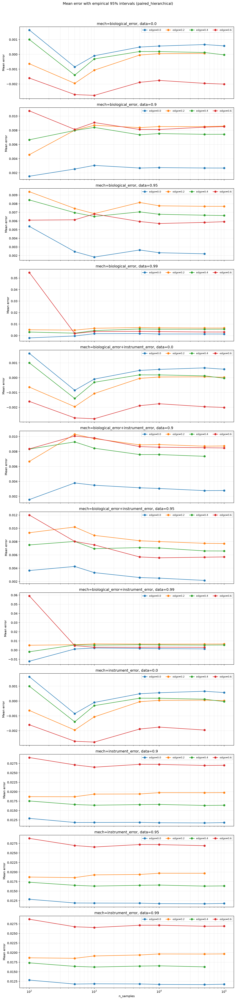

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_paired_hierarchical_mean_error_ci_vs_n_samples.png


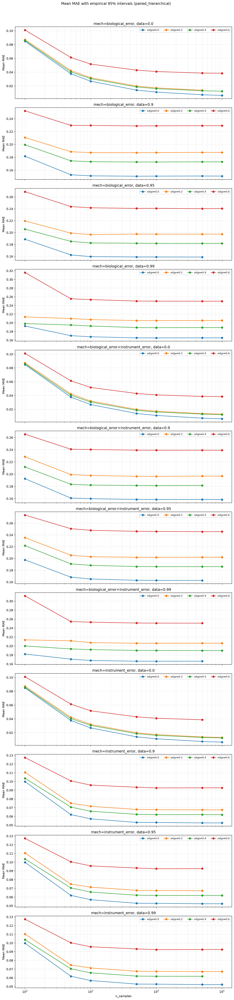

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_paired_hierarchical_mae_ci_vs_n_samples.png


In [7]:

plot_summary = ci_summary.copy()

def plot_seed_bands(metric, lower, upper, ylabel, title, filename):
    panel_cols = ['missing_data_mechanism', 'missing_data_rate']
    panels = list(plot_summary.groupby(panel_cols, dropna=False))
    fig, axes = plt.subplots(
        len(panels), 1, figsize=(11, max(4, 3.8 * len(panels))),
        sharex=True, squeeze=False,
    )
    for ax, (panel_key, panel) in zip(axes[:, 0], panels):
        for edge_rate, part in panel.groupby('missing_edge_rate', dropna=False):
            part = part.sort_values('n_samples')
            x_values = part['n_samples'].to_numpy(dtype=float)
            y_values = part[metric].to_numpy(dtype=float)
            ax.plot(x_values, y_values, marker='o', label=f'edge={edge_rate}')
            band = part[
                (part['usable_replicates'] >= 2)
                & np.isfinite(part[lower])
                & np.isfinite(part[upper])
            ]
            if not band.empty:
                ax.fill_between(
                    band['n_samples'].to_numpy(dtype=float),
                    band[lower].to_numpy(dtype=float),
                    band[upper].to_numpy(dtype=float),
                    alpha=0.15,
                )
        ax.set_xscale('log')
        ax.set_ylabel(ylabel)
        ax.set_title(f'mech={panel_key[0]}, data={panel_key[1]}')
        ax.grid(True, which='both', alpha=0.25)
        ax.legend(fontsize=8, ncol=min(4, max(1, panel['missing_edge_rate'].nunique())))
    axes[-1, 0].set_xlabel('n_samples')
    fig.suptitle(title, y=1.01)
    plt.tight_layout()
    out = VIZ_DIR / filename
    plt.savefig(out, dpi=150, bbox_inches='tight')
    plt.close()
    display(Image(str(out)))
    print(f'Saved: {out}')

plot_seed_bands('mean_error', 'error_lower', 'error_upper', 'Mean error',
                f'Mean error with empirical 95% intervals ({design})',
                f'csd_estimation_{design}_mean_error_ci_vs_n_samples.png')
plot_seed_bands('mean_MAE', 'MAE_lower', 'MAE_upper', 'Mean MAE',
                f'Mean MAE with empirical 95% intervals ({design})',
                f'csd_estimation_{design}_mae_ci_vs_n_samples.png')


## 1) Estimated signed beta vs ground-truth signed beta

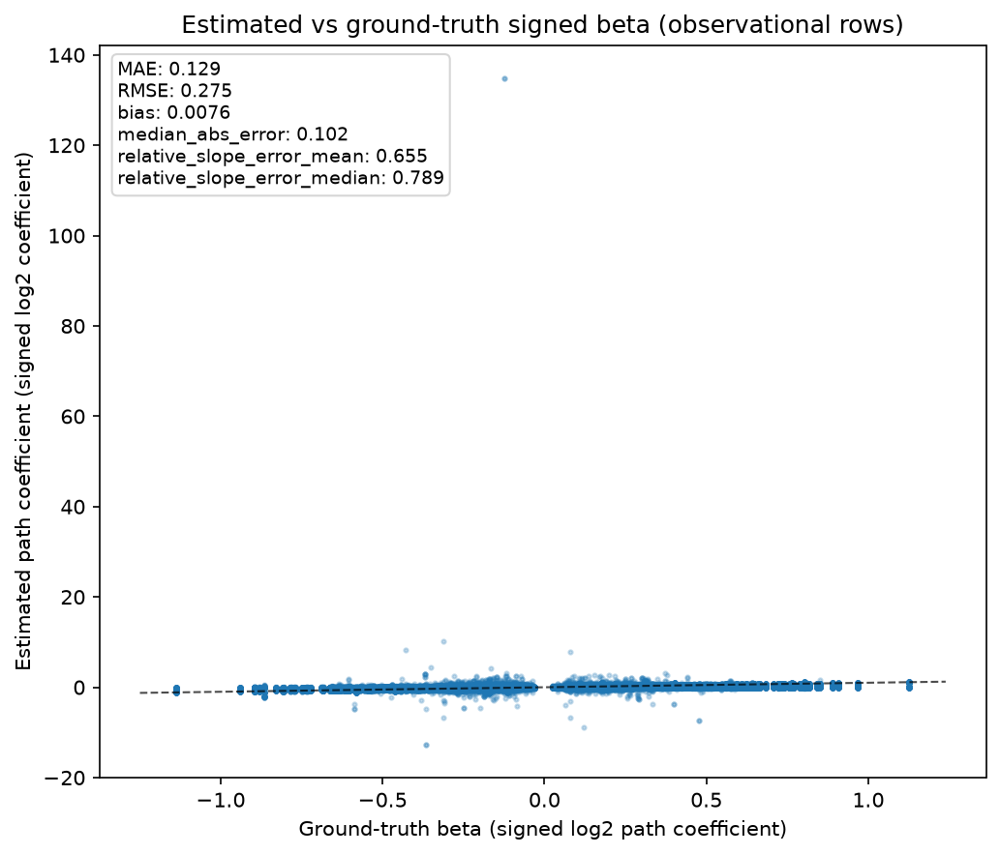

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_beta_scatter.png


In [8]:
# Scatter plot + y=x reference line
plot_df = eval_df.dropna(subset=['ground_truth_beta', 'estimated_path_coefficient']).copy()

fig, ax = plt.subplots(figsize=(7, 6))
ax.scatter(
    plot_df['ground_truth_beta'],
    plot_df['estimated_path_coefficient'],
    s=4,
    alpha=0.25,
    rasterized=True,
)

lims = [
    float(plot_df['ground_truth_beta'].min()),
    float(plot_df['ground_truth_beta'].max()),
]
pad = 0.05 * (lims[1] - lims[0] + 1e-12)
lo, hi = lims[0] - pad, lims[1] + pad
ax.plot([lo, hi], [lo, hi], color='black', linewidth=1, linestyle='--', alpha=0.7)

ax.set_xlabel('Ground-truth beta (signed log2 path coefficient)')
ax.set_ylabel('Estimated path coefficient (signed log2 coefficient)')
ax.set_title('Estimated vs ground-truth signed beta (observational rows)')

note = '\n'.join([f"{k}: {v:.3g}" for k, v in overall.items()])
ax.text(
    0.02,
    0.98,
    note,
    transform=ax.transAxes,
    va='top',
    ha='left',
    fontsize=9,
    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8, edgecolor='0.8'),
)

plt.tight_layout()
out = VIZ_DIR / 'csd_estimation_beta_scatter.png'
plt.savefig(out, dpi=150, bbox_inches='tight')
plt.close()

display(Image(str(out)))
print(f'Saved: {out}')


## 1b) Relative slope error (|estimated-true| / |true|) vs ground-truth beta

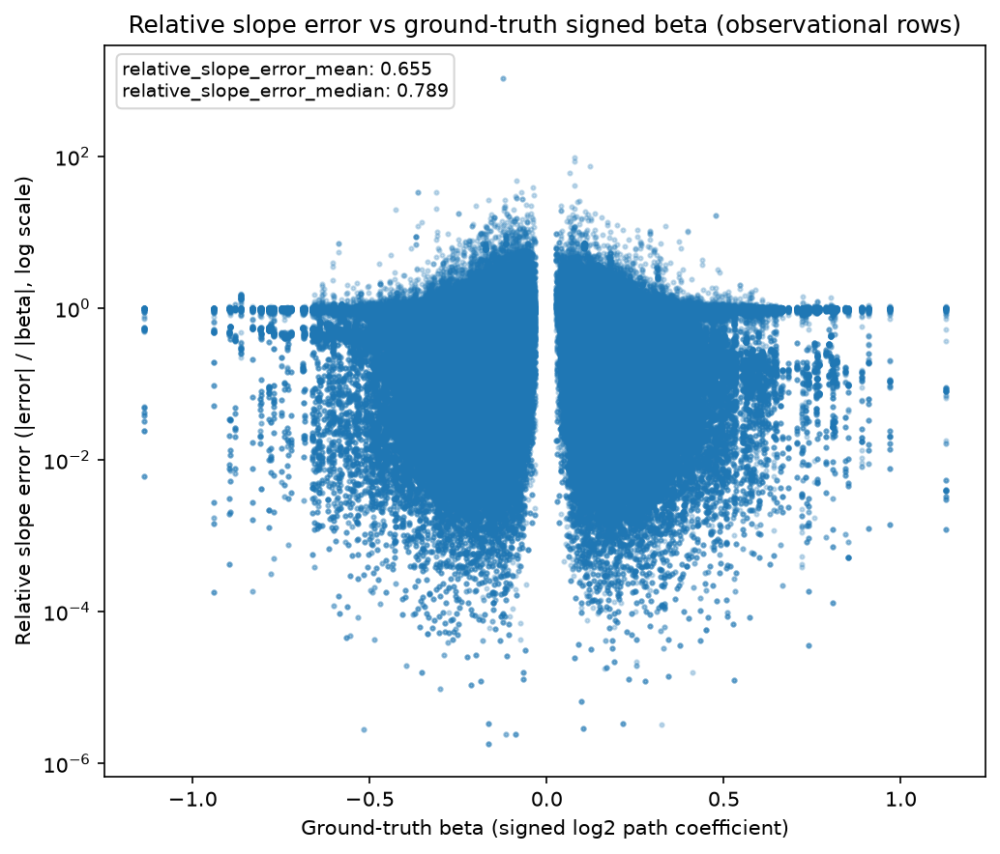

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_relative_slope_error_scatter.png


In [9]:
# Scatter plot: relative_slope_error vs ground-truth beta
plot_df = eval_df.dropna(subset=['ground_truth_beta', 'relative_slope_error']).copy()
plot_df = plot_df[
    np.isfinite(plot_df['relative_slope_error'])
    & (plot_df['relative_slope_error'] > 0)
]

fig, ax = plt.subplots(figsize=(7, 6))
ax.set_yscale('log')
ax.scatter(
    plot_df['ground_truth_beta'],
    plot_df['relative_slope_error'],
    s=4,
    alpha=0.25,
    rasterized=True,
)

ax.set_xlabel('Ground-truth beta (signed log2 path coefficient)')
ax.set_ylabel('Relative slope error (|error| / |beta|, log scale)')
ax.set_title('Relative slope error vs ground-truth signed beta (observational rows)')

note = '\n'.join([f"{k}: {v:.3g}" for k, v in overall.items() if k.startswith('relative_slope_error')])
ax.text(
    0.02,
    0.98,
    note,
    transform=ax.transAxes,
    va='top',
    ha='left',
    fontsize=9,
    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8, edgecolor='0.8'),
)

plt.tight_layout()
out = VIZ_DIR / 'csd_estimation_relative_slope_error_scatter.png'
plt.savefig(out, dpi=150, bbox_inches='tight')
plt.close()

display(Image(str(out)))
print(f'Saved: {out}')


## 2) Error-metric breakdown across simulation parameters

Wrote error summary: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/csd_estimation_error_summary.csv


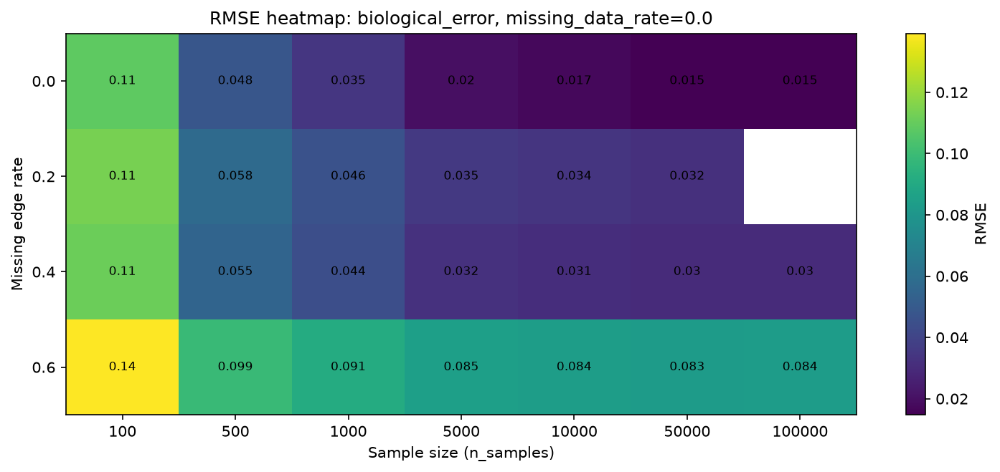

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RMSE_heatmap_biological_error_data_rate0.0.png


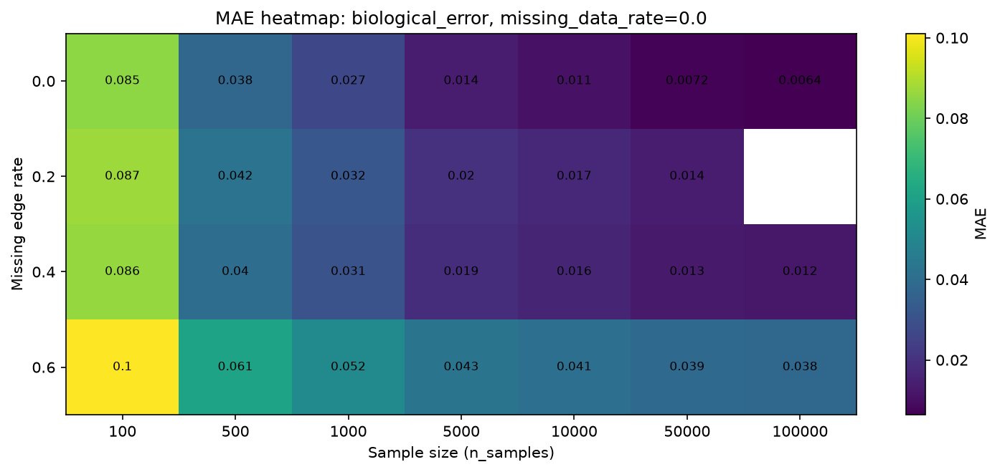

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_heatmap_biological_error_data_rate0.0.png


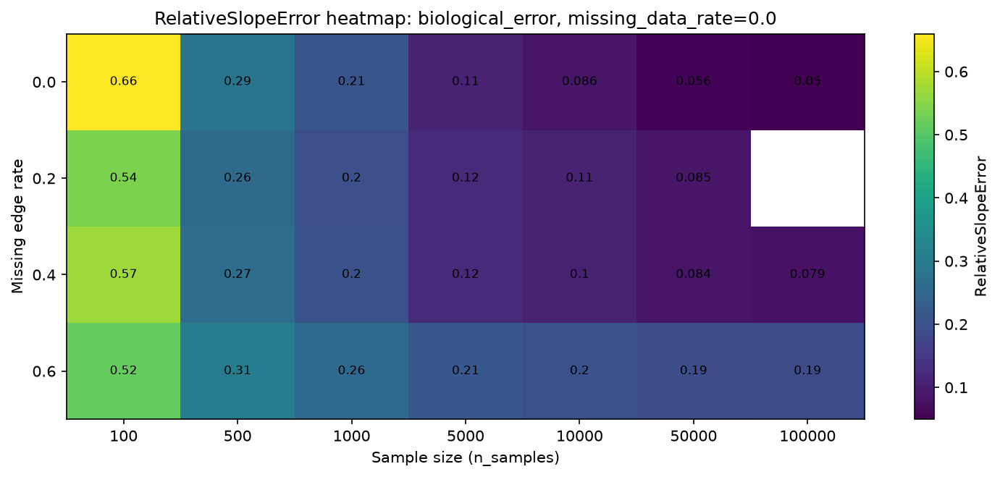

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_heatmap_biological_error_data_rate0.0.png


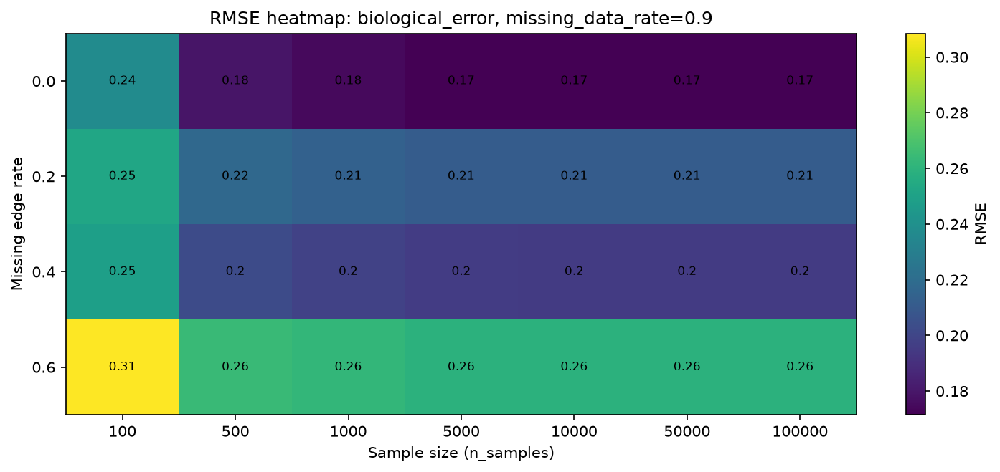

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RMSE_heatmap_biological_error_data_rate0.9.png


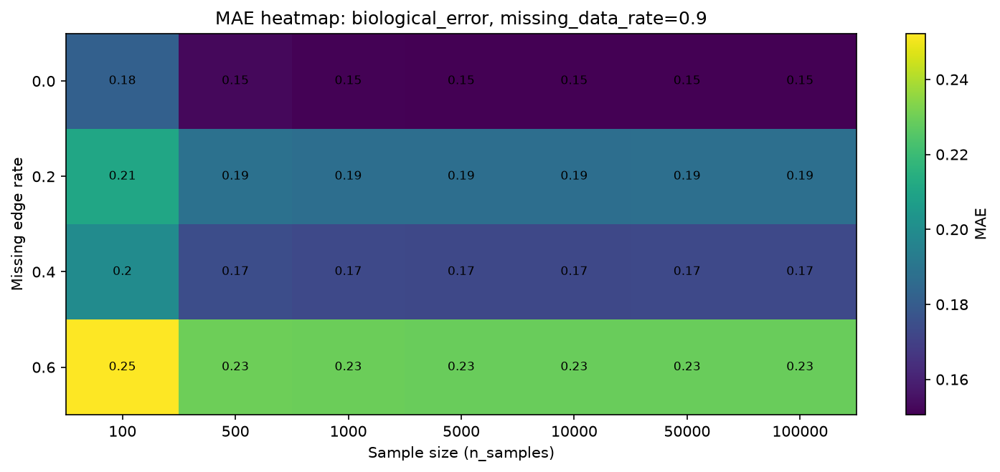

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_heatmap_biological_error_data_rate0.9.png


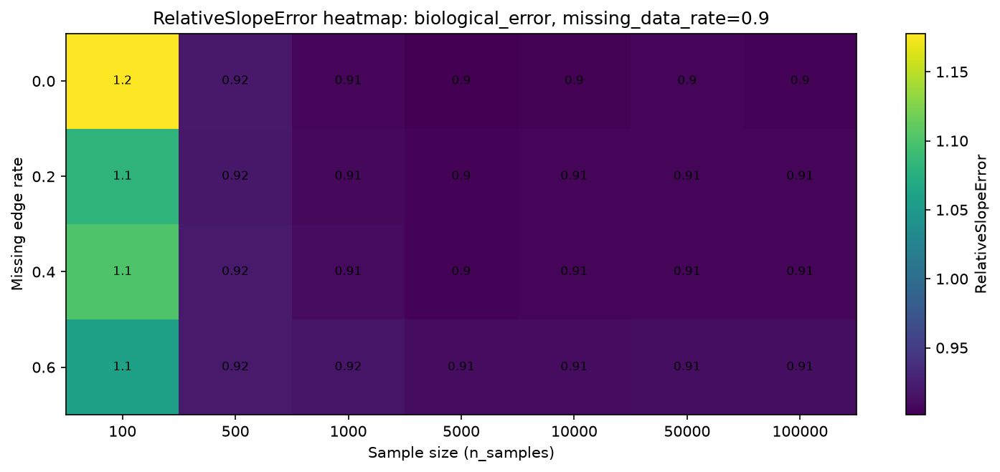

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_heatmap_biological_error_data_rate0.9.png


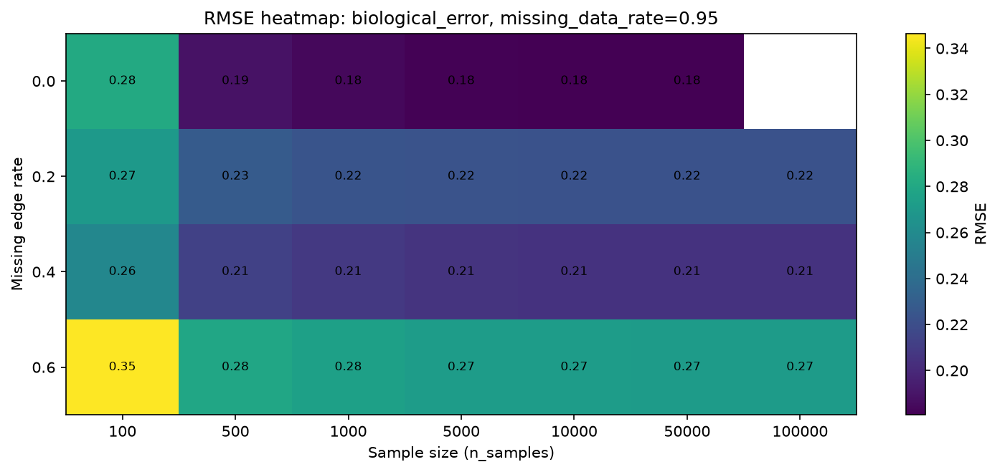

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RMSE_heatmap_biological_error_data_rate0.95.png


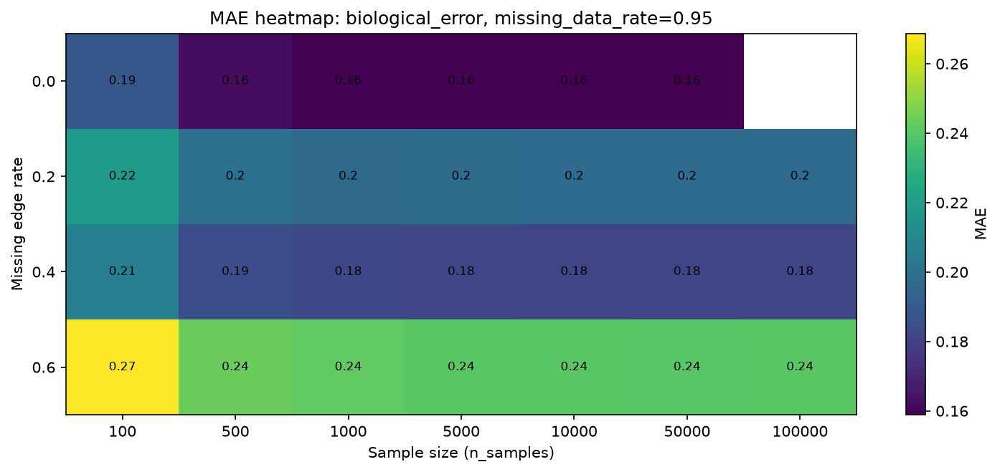

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_heatmap_biological_error_data_rate0.95.png


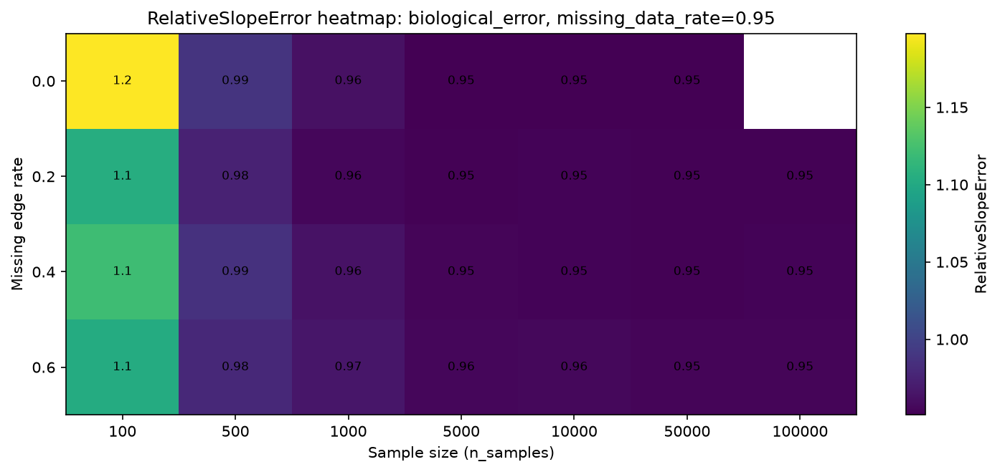

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_heatmap_biological_error_data_rate0.95.png


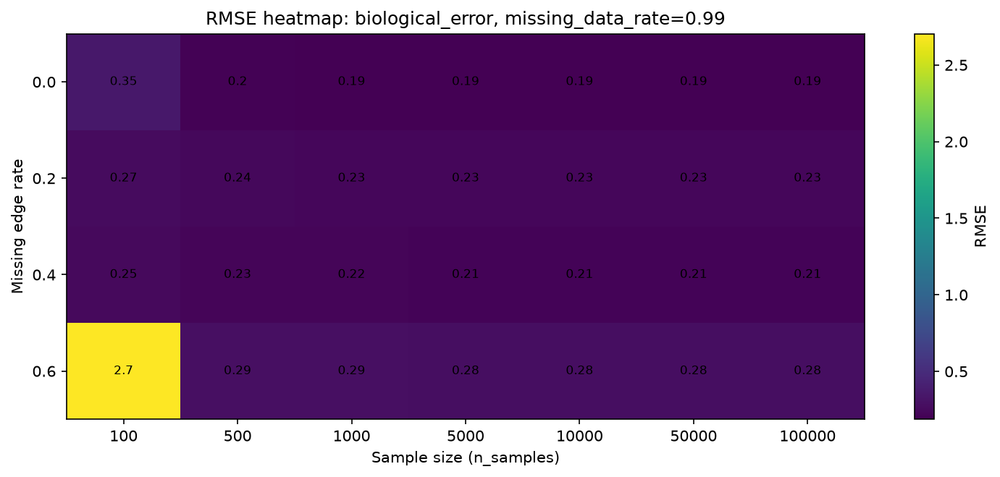

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RMSE_heatmap_biological_error_data_rate0.99.png


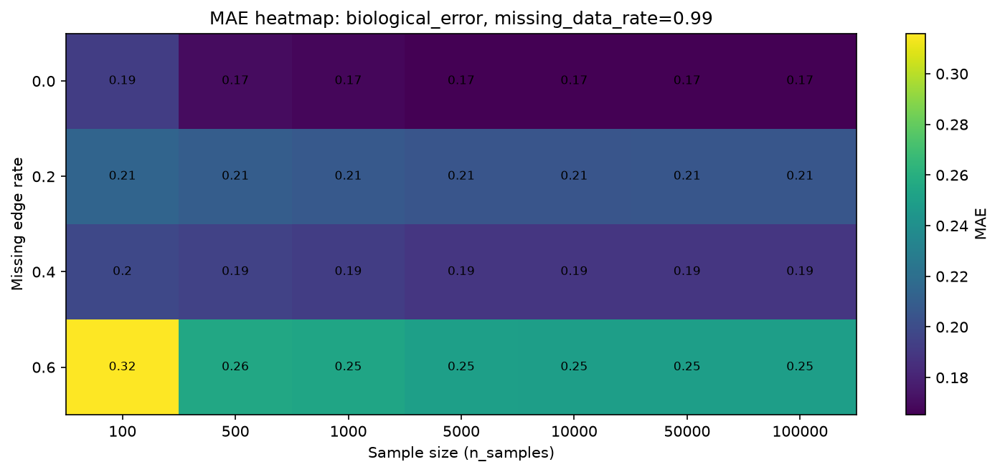

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_heatmap_biological_error_data_rate0.99.png


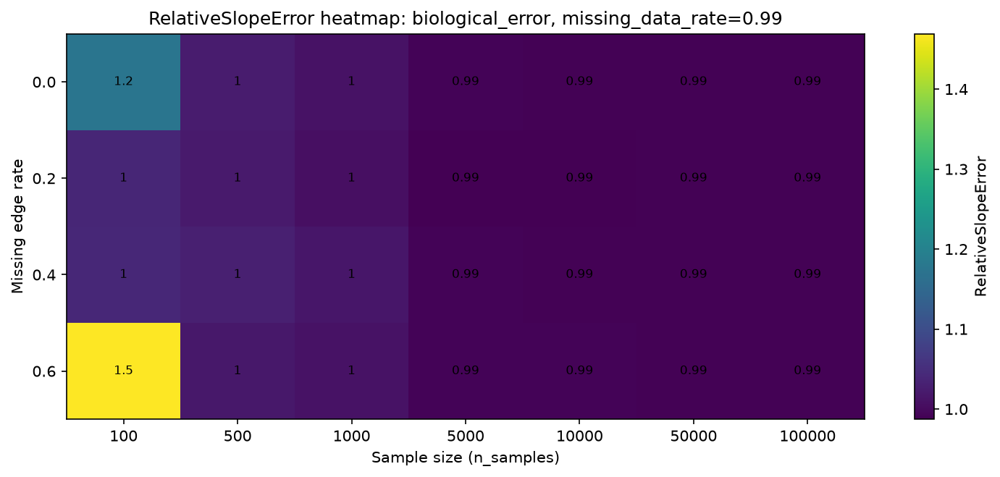

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_heatmap_biological_error_data_rate0.99.png


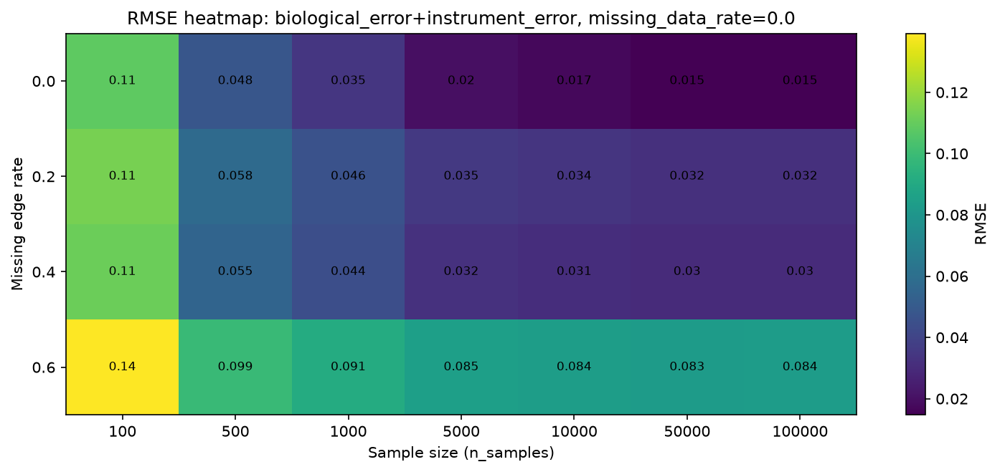

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RMSE_heatmap_biological_error+instrument_error_data_rate0.0.png


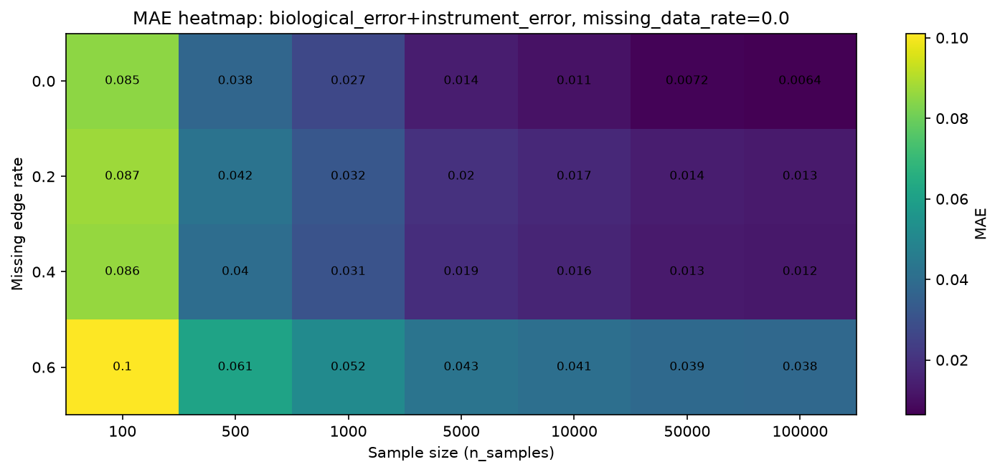

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_heatmap_biological_error+instrument_error_data_rate0.0.png


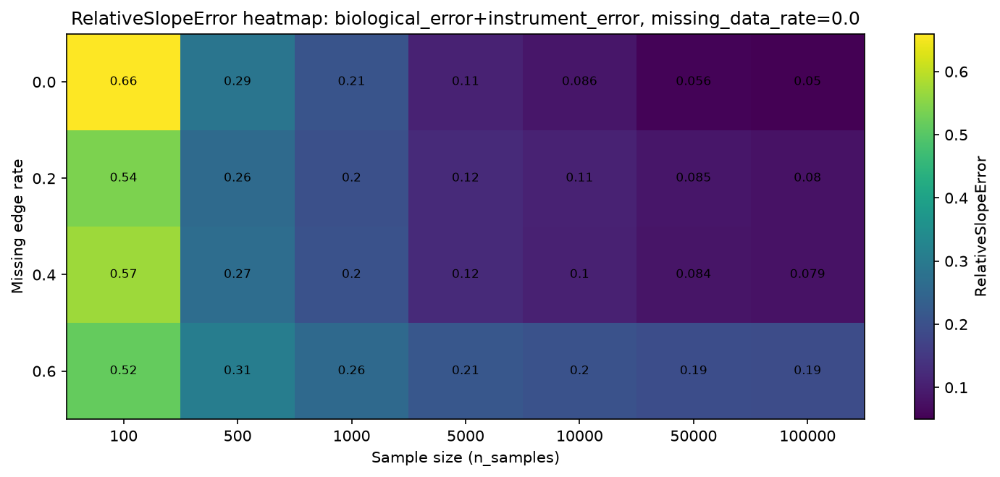

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_heatmap_biological_error+instrument_error_data_rate0.0.png


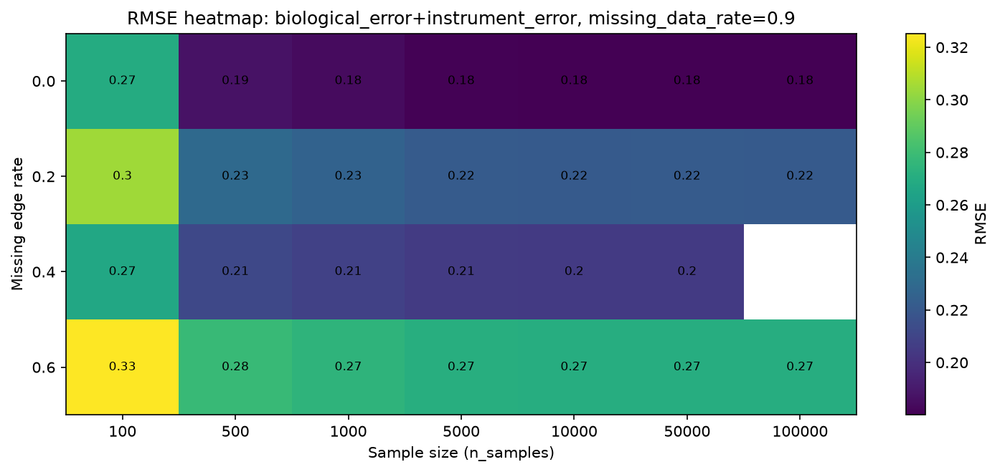

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RMSE_heatmap_biological_error+instrument_error_data_rate0.9.png


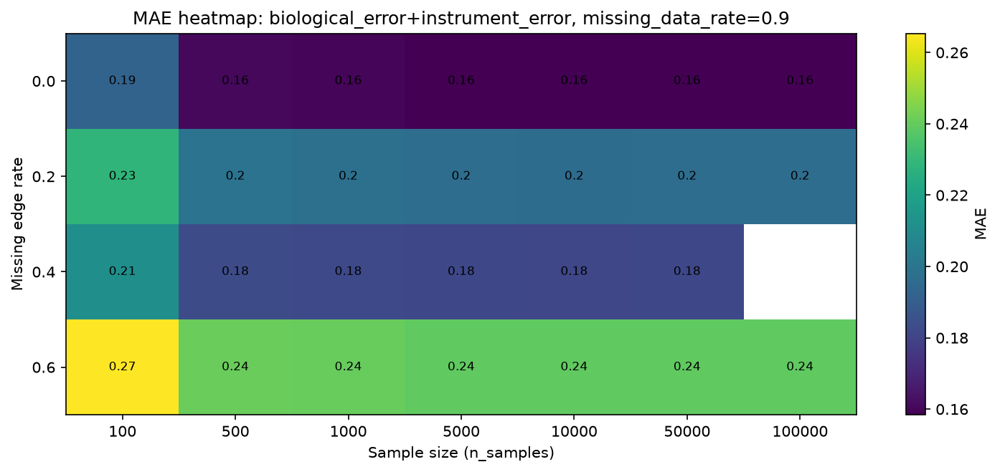

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_heatmap_biological_error+instrument_error_data_rate0.9.png


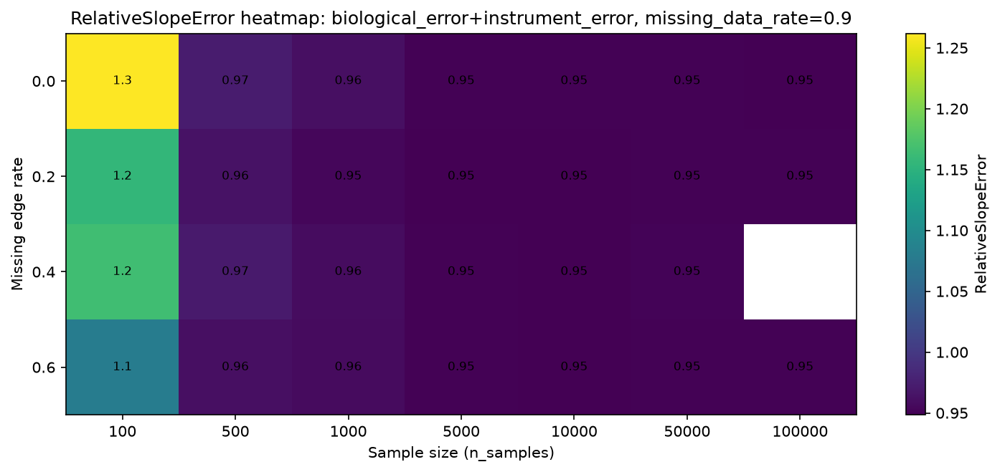

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_heatmap_biological_error+instrument_error_data_rate0.9.png


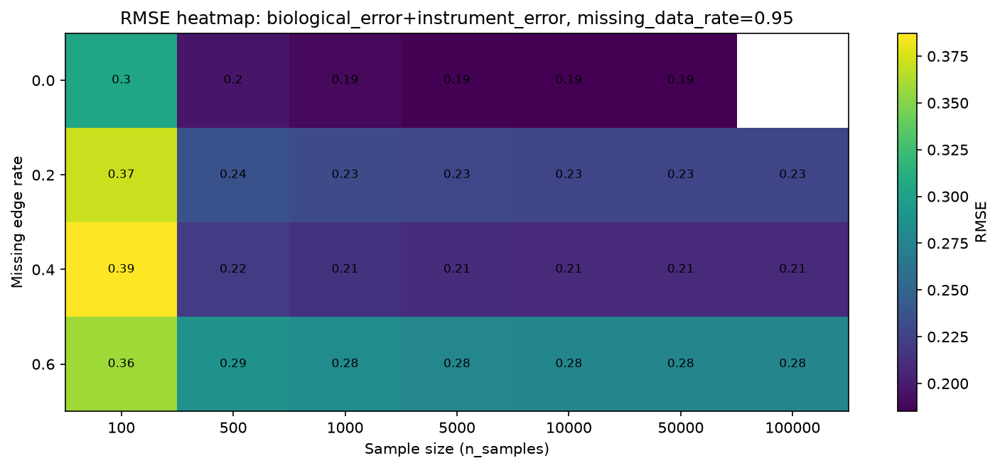

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RMSE_heatmap_biological_error+instrument_error_data_rate0.95.png


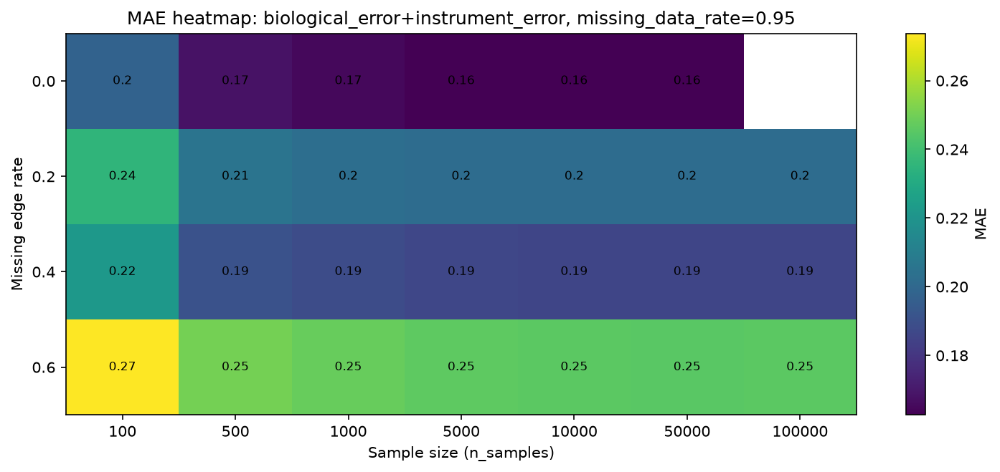

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_heatmap_biological_error+instrument_error_data_rate0.95.png


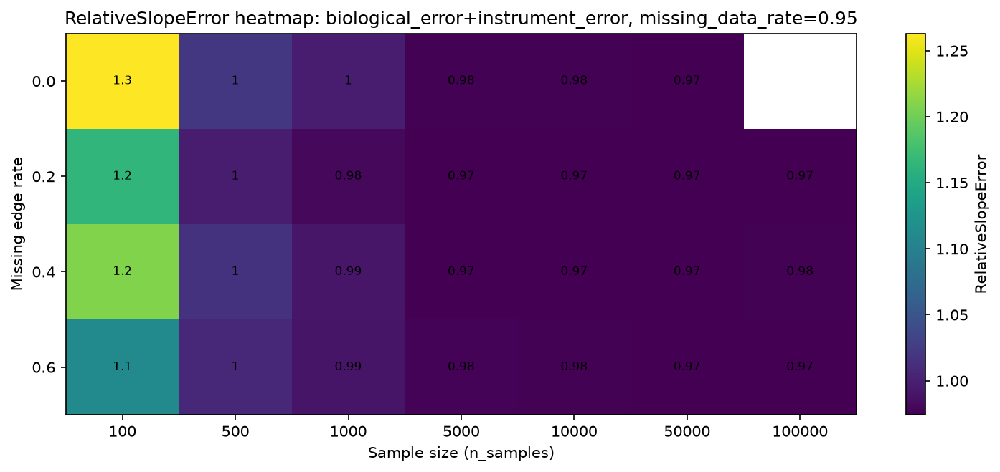

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_heatmap_biological_error+instrument_error_data_rate0.95.png


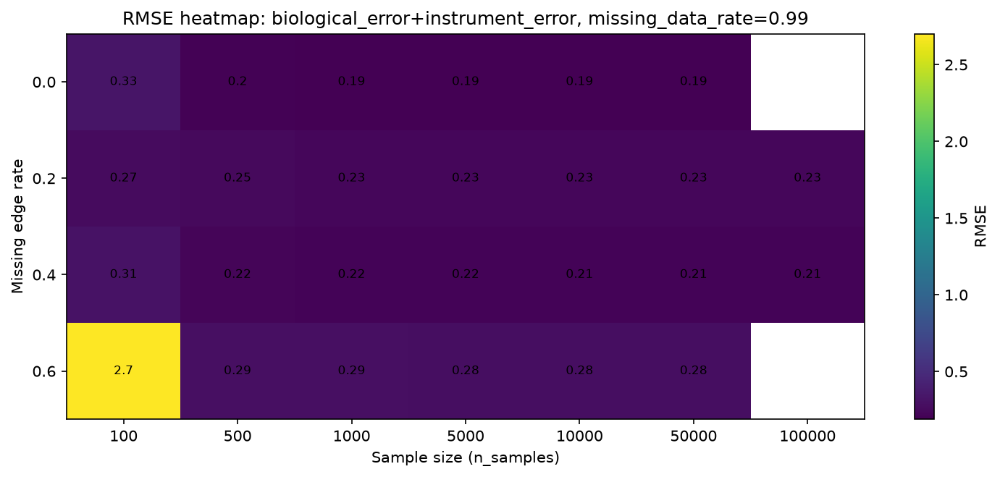

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RMSE_heatmap_biological_error+instrument_error_data_rate0.99.png


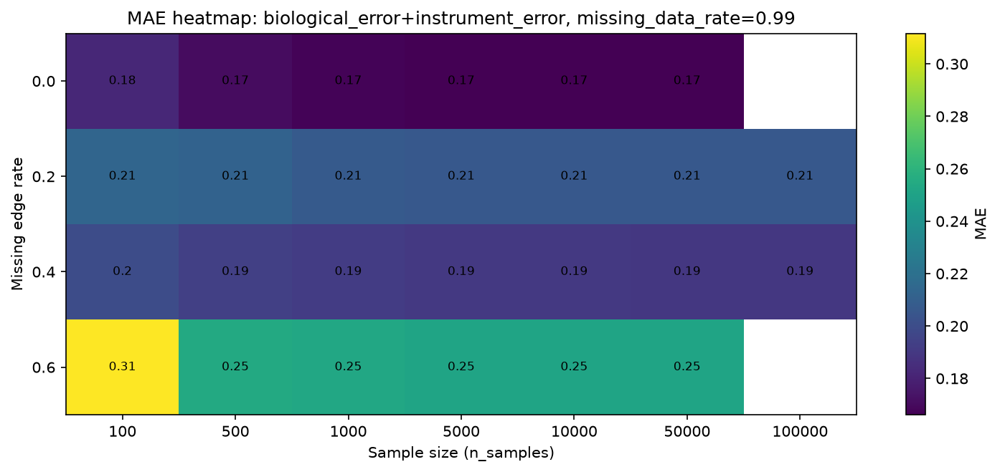

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_heatmap_biological_error+instrument_error_data_rate0.99.png


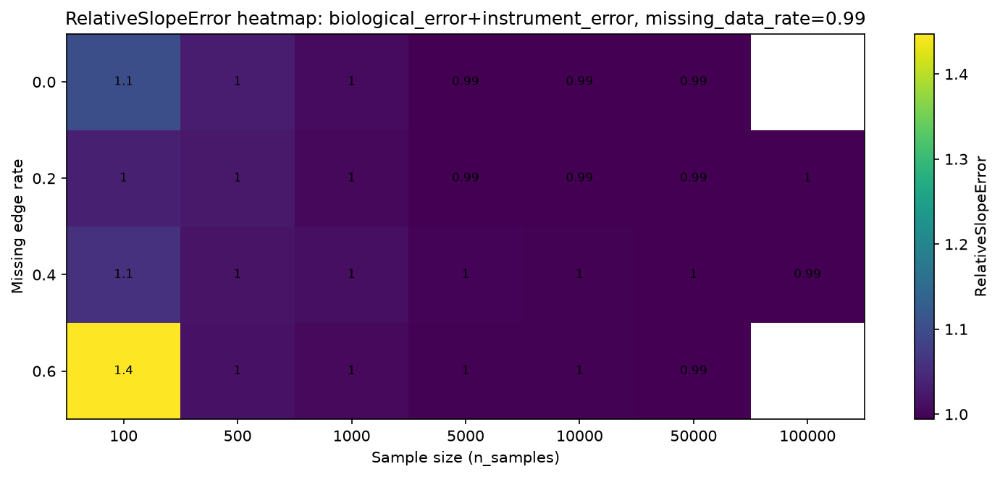

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_heatmap_biological_error+instrument_error_data_rate0.99.png


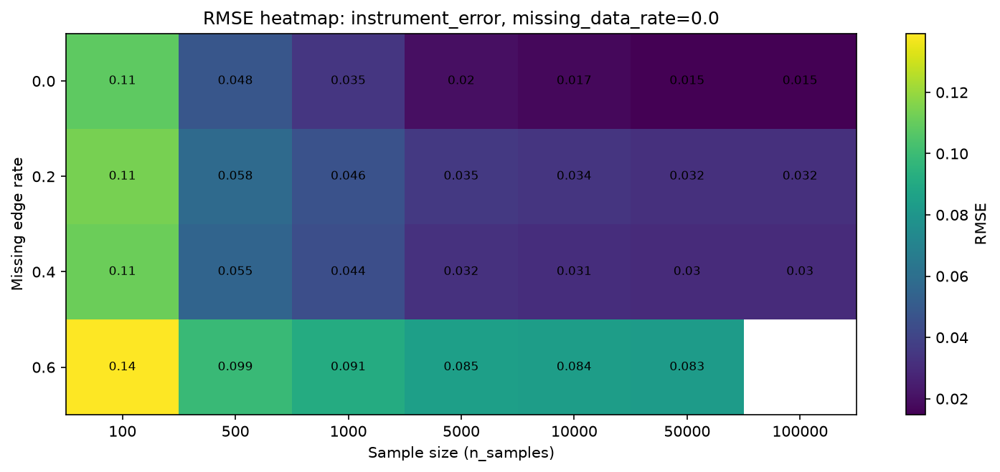

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RMSE_heatmap_instrument_error_data_rate0.0.png


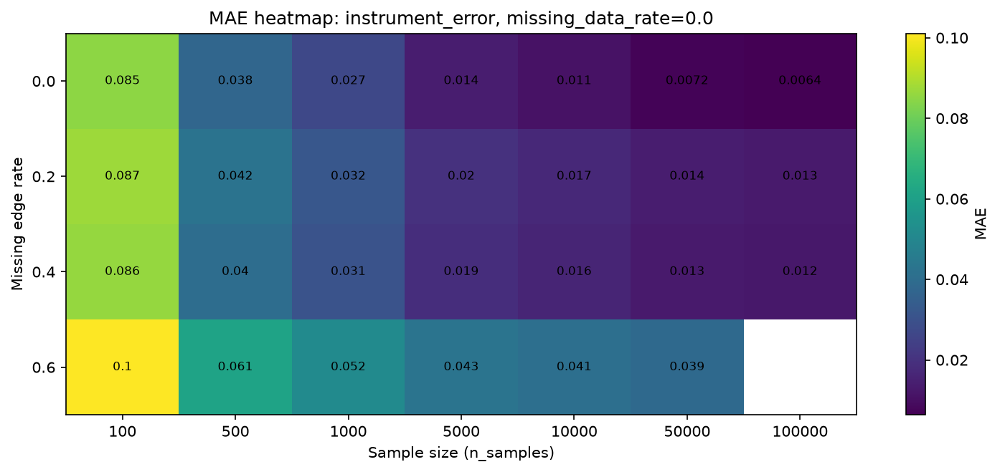

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_heatmap_instrument_error_data_rate0.0.png


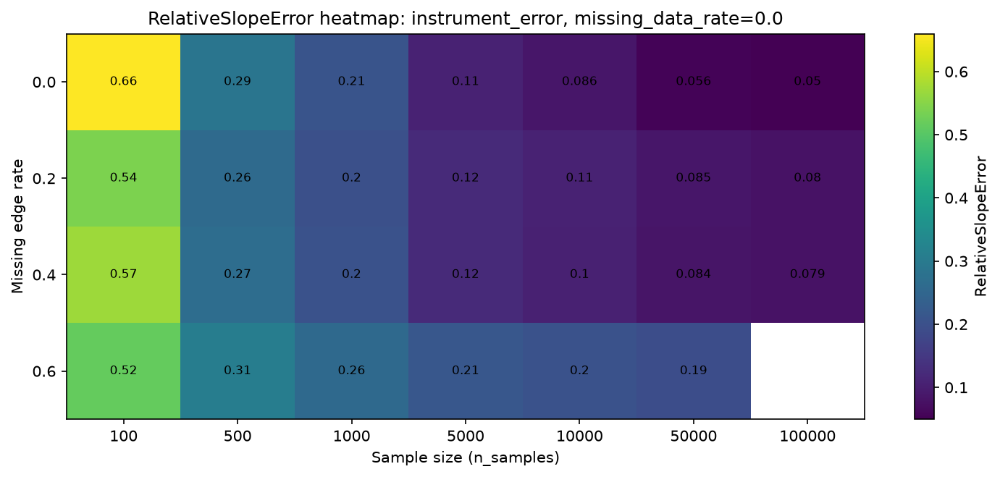

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_heatmap_instrument_error_data_rate0.0.png


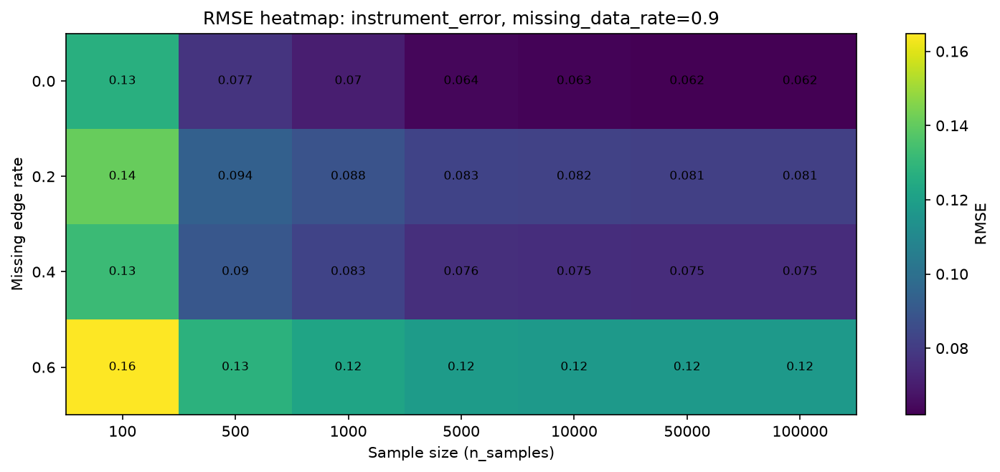

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RMSE_heatmap_instrument_error_data_rate0.9.png


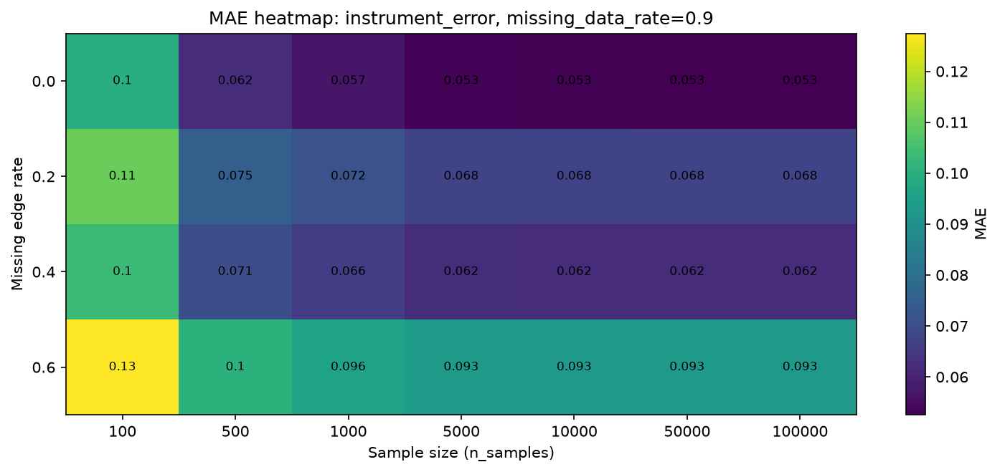

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_heatmap_instrument_error_data_rate0.9.png


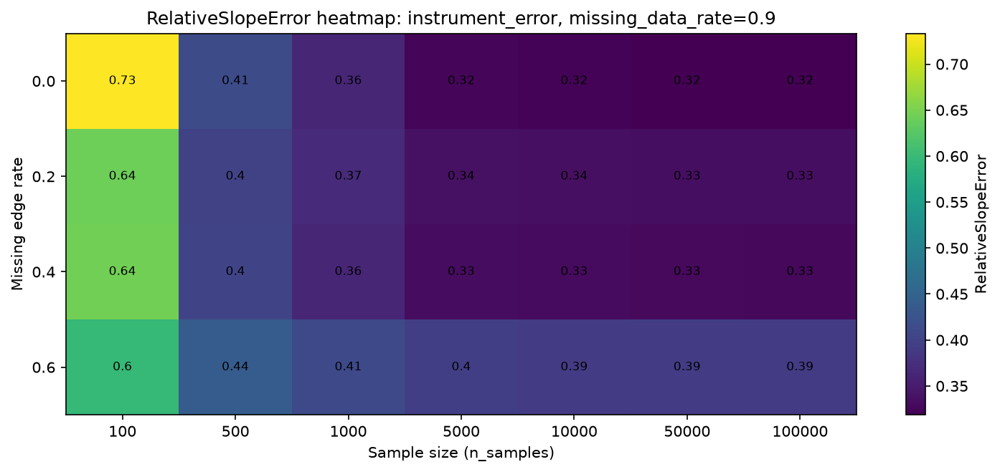

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_heatmap_instrument_error_data_rate0.9.png


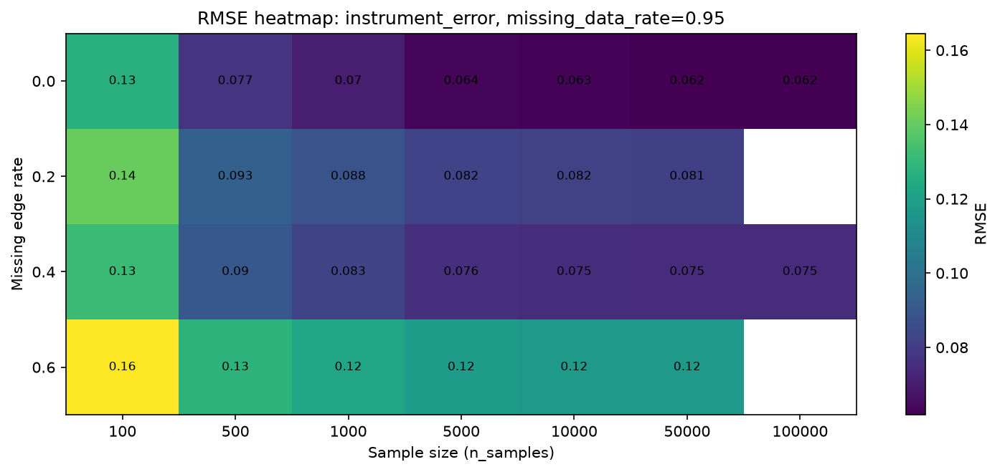

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RMSE_heatmap_instrument_error_data_rate0.95.png


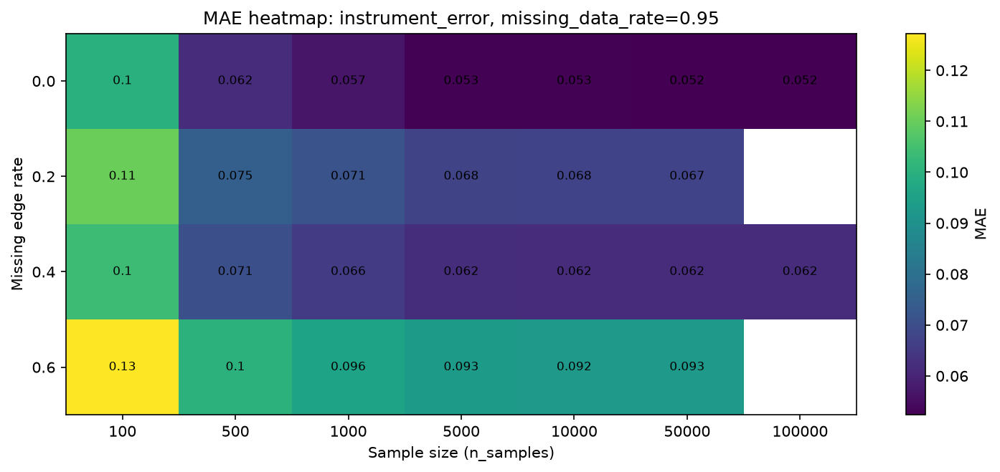

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_heatmap_instrument_error_data_rate0.95.png


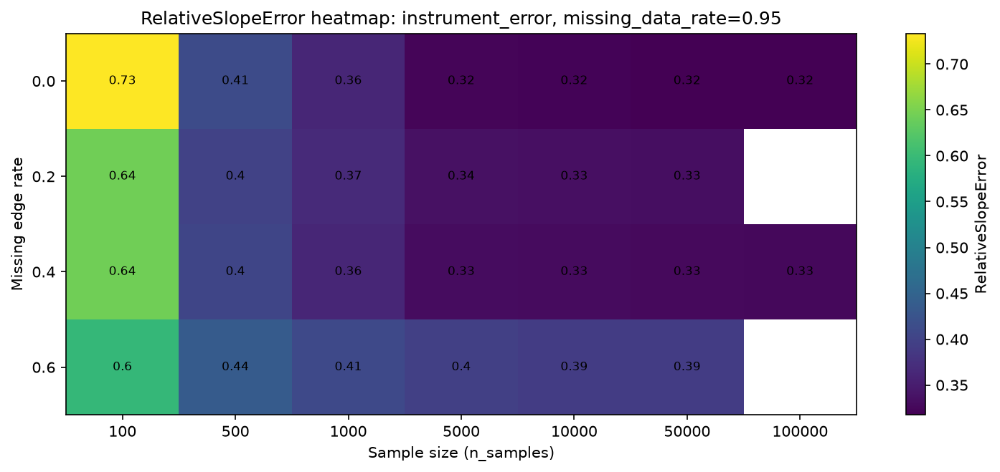

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_heatmap_instrument_error_data_rate0.95.png


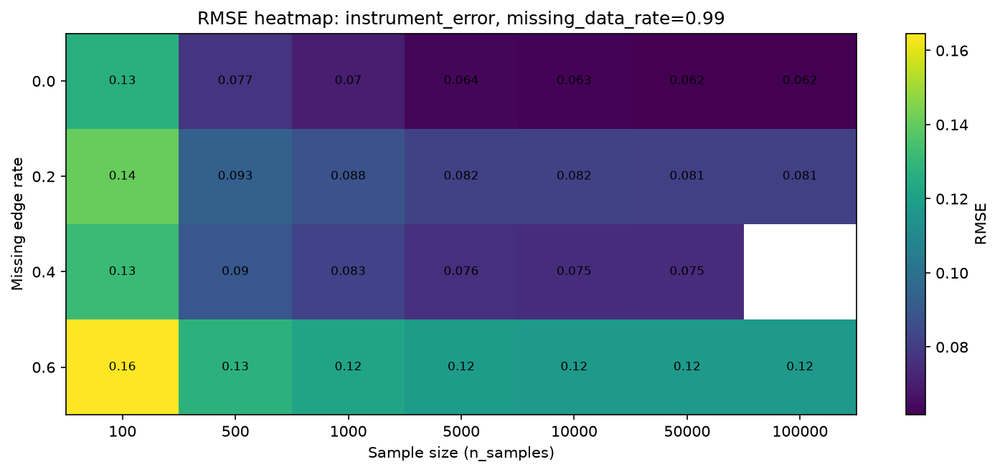

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RMSE_heatmap_instrument_error_data_rate0.99.png


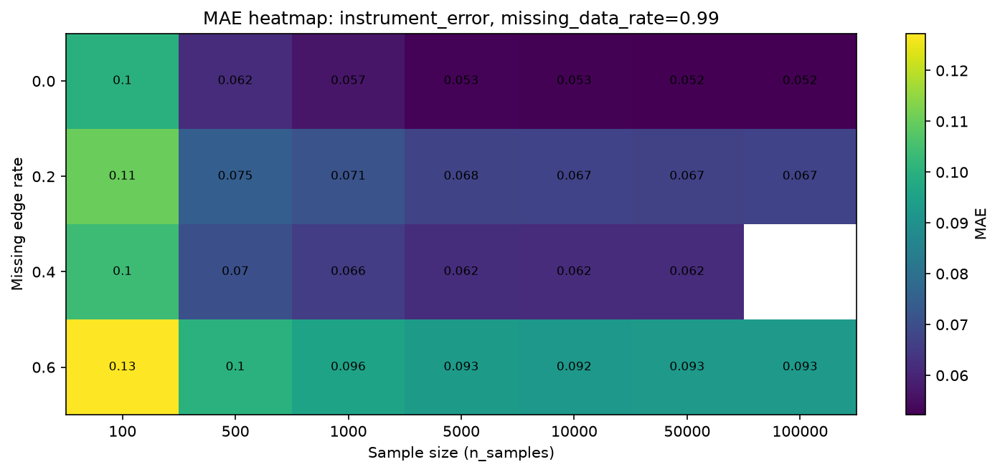

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_heatmap_instrument_error_data_rate0.99.png


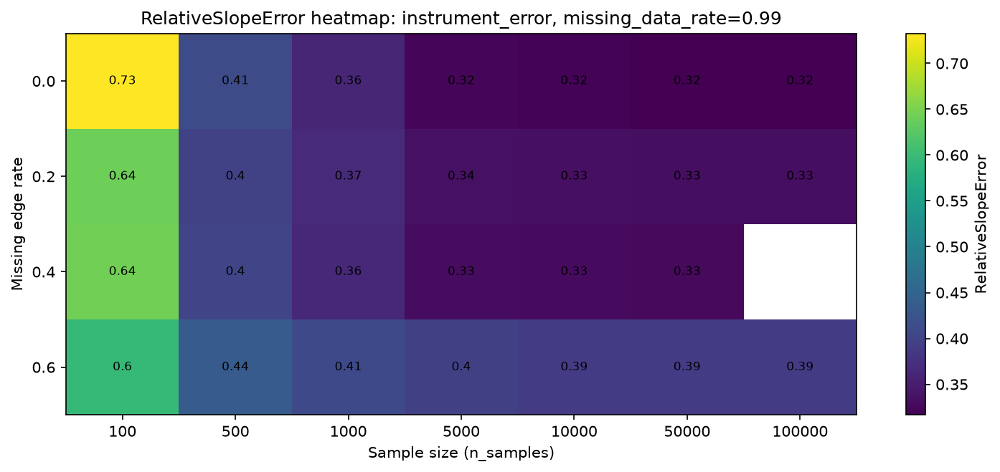

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_heatmap_instrument_error_data_rate0.99.png


In [10]:
# Grouped metrics
group_cols = [
    'missing_data_mechanism',
    'missing_data_rate',
    'missing_edge_rate',
    'n_samples',
]

g = (
    eval_df.groupby(group_cols, dropna=False)
    .agg(
        n=('error', 'size'),
        MAE=('abs_error', 'mean'),
        RMSE=('sq_error', lambda x: float(np.sqrt(np.mean(x)))),
        bias=('error', 'mean'),
        median_abs_error=('abs_error', 'median'),
        RelativeSlopeError=('relative_slope_error', 'mean'),
    )
    .reset_index()
)

err_summary_csv = NB_DIR / 'csd_estimation_error_summary.csv'
g.to_csv(err_summary_csv, index=False)
print(f'Wrote error summary: {err_summary_csv}')


def plot_metric_heatmap(mechanism: str, data_rate: float, metric: str = 'RMSE'):
    sub = g[(g['missing_data_mechanism'] == mechanism) & (g['missing_data_rate'] == data_rate)]
    if len(sub) == 0:
        print('No data for:', mechanism, data_rate)
        return

    pivot = (
        sub.pivot_table(
            index='missing_edge_rate',
            columns='n_samples',
            values=f'{metric}',
            aggfunc='mean',
        )
        .sort_index(axis=0)
        .sort_index(axis=1)
    )

    fig, ax = plt.subplots(figsize=(10, 4.5))
    im = ax.imshow(pivot.values, aspect='auto', interpolation='nearest')

    ax.set_yticks(range(len(pivot.index)))
    ax.set_yticklabels([str(v) for v in pivot.index])
    ax.set_xticks(range(len(pivot.columns)))
    ax.set_xticklabels([str(v) for v in pivot.columns])

    ax.set_xlabel('Sample size (n_samples)')
    ax.set_ylabel('Missing edge rate')
    ax.set_title(f'{metric} heatmap: {mechanism}, missing_data_rate={data_rate}')

    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label(f'{metric}')

    for i in range(pivot.shape[0]):
        for j in range(pivot.shape[1]):
            val = pivot.values[i, j]
            if np.isfinite(val):
                ax.text(j, i, f'{val:.2g}', ha='center', va='center', fontsize=8, color='black')

    plt.tight_layout()
    out = VIZ_DIR / f'csd_estimation_{metric}_heatmap_{mechanism}_data_rate{data_rate}.png'
    plt.savefig(out, dpi=150, bbox_inches='tight')
    plt.close()
    display(Image(str(out)))
    print(f'Saved: {out}')


mechs = sorted(eval_df['missing_data_mechanism'].unique())
data_rates = sorted(eval_df['missing_data_rate'].unique())

for mech in mechs:
    for dr in data_rates:
        plot_metric_heatmap(mech, float(dr), 'RMSE')
        plot_metric_heatmap(mech, float(dr), 'MAE')
        plot_metric_heatmap(mech, float(dr), 'RelativeSlopeError')


## 2b) Adjustment set size affects error metrics (pipeline sparsity)

The `adjustment_set` column contains a pipe-separated list of adjustment nodes.
We compute its size and show how MAE/RMSE/bias (and residual variance) change as
the adjustment set gets larger.


Wrote adjustment-set-size summary: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/csd_estimation_adjustment_set_size_summary.csv


,adjustment_set_size,n,MAE,RMSE,bias,residual_mean,residual_median
0,1,34944,0.131187,0.182051,0.057990,0.416949,0.306817
1,2,56112,0.126912,0.171740,0.063999,0.419444,0.327678
2,3,68544,0.127237,0.182933,0.024223,0.422143,0.326989
3,4,63840,0.128576,0.180071,0.033648,0.437267,0.343172
4,5,55776,0.128084,0.176933,0.014658,0.453110,0.356646
5,6,46032,0.128689,0.182162,-0.023064,0.438781,0.369110
6,7,95760,0.130302,0.178769,0.034105,0.589139,0.362932
7,8,302064,0.131042,0.392300,-0.022071,0.417855,0.288235
8,9,47376,0.123068,0.178465,-0.007280,0.438640,0.365385
9,10,16128,0.121013,0.188893,-0.040627,0.439254,0.394546


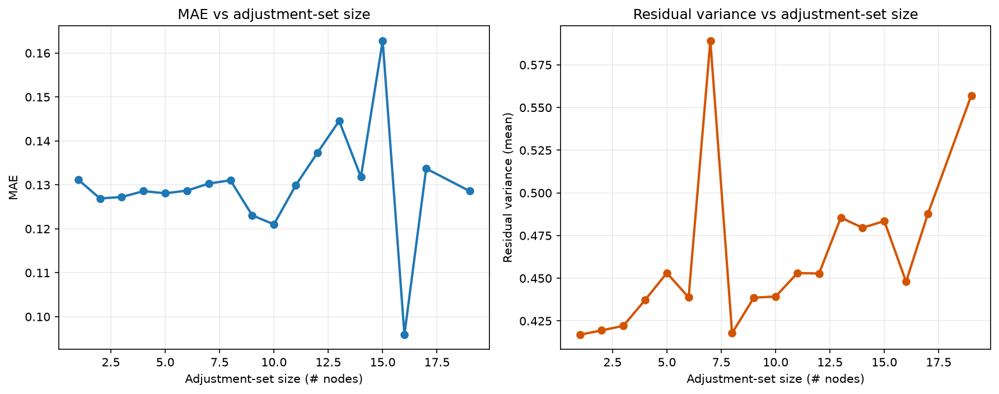

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_mae_resid_vs_adjustment_set_size.png


In [11]:
# Compute adjustment-set size from the pipe-separated adjustment_set string
def adj_set_size(s) -> float:
    if pd.isna(s) or str(s).strip().lower() in {'', 'null', 'none', 'nan'}:
        return float('nan')
    parts = str(s).split('|')
    parts = [p for p in parts if p]
    return float(len(parts))

eval_tmp = eval_df.copy()
eval_tmp['adjustment_set_size'] = eval_tmp['adjustment_set'].apply(adj_set_size)

eval_tmp = eval_tmp.dropna(subset=['adjustment_set_size'])
eval_tmp['adjustment_set_size'] = eval_tmp['adjustment_set_size'].astype(int)

adj_summary = (
    eval_tmp.groupby('adjustment_set_size', dropna=False)
    .agg(
        n=('error', 'size'),
        MAE=('abs_error', 'mean'),
        RMSE=('sq_error', lambda x: float(np.sqrt(np.mean(x)))),
        bias=('error', 'mean'),
        residual_mean=('residual_variance', 'mean'),
        residual_median=('residual_variance', 'median'),
    )
    .reset_index()
    .sort_values('adjustment_set_size')
)

adj_csv = NB_DIR / 'csd_estimation_adjustment_set_size_summary.csv'
adj_summary.to_csv(adj_csv, index=False)
print(f'Wrote adjustment-set-size summary: {adj_csv}')

display(adj_summary.head(20))

# Plot MAE and residual variance vs adjustment set size
fig, axes = plt.subplots(1, 2, figsize=(12, 4.8), sharex=True)

axes[0].plot(adj_summary['adjustment_set_size'], adj_summary['MAE'], marker='o', linewidth=2)
axes[0].set_xlabel('Adjustment-set size (# nodes)')
axes[0].set_ylabel('MAE')
axes[0].set_title('MAE vs adjustment-set size')
axes[0].grid(True, alpha=0.25)

axes[1].plot(adj_summary['adjustment_set_size'], adj_summary['residual_mean'], marker='o', linewidth=2, color='#d35400')
axes[1].set_xlabel('Adjustment-set size (# nodes)')
axes[1].set_ylabel('Residual variance (mean)')
axes[1].set_title('Residual variance vs adjustment-set size')
axes[1].grid(True, alpha=0.25)

plt.tight_layout()
out = VIZ_DIR / 'csd_estimation_mae_resid_vs_adjustment_set_size.png'
plt.savefig(out, dpi=150, bbox_inches='tight')
plt.close()

display(Image(str(out)))
print(f'Saved: {out}')


Filtered rows: 15,198
Wrote adjustment-set-size summary: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/csd_estimation_adjustment_set_size_summary_no_missing_n_gt10000.csv


,adjustment_set_size,n,MAE,RMSE,bias,residual_mean,residual_median
0,1,624,0.004050,0.006415,0.000336,1.001676,1.000515
1,2,1002,0.004884,0.009607,0.000281,1.004247,1.000743
2,3,1224,0.005575,0.011188,-0.000649,0.995760,1.000154
3,4,1140,0.006356,0.014511,0.002962,0.997046,1.000317
4,5,996,0.014141,0.030061,0.000478,1.016242,1.001599
5,6,822,0.008035,0.015024,0.000788,1.005495,1.000877
6,7,1710,0.010704,0.019475,0.002149,1.184153,1.032663
7,8,5394,0.005742,0.012210,-0.000797,1.004204,1.000418
8,9,846,0.005508,0.011204,0.003434,1.015520,1.000782
9,10,288,0.003286,0.004207,0.001134,1.000686,1.000523


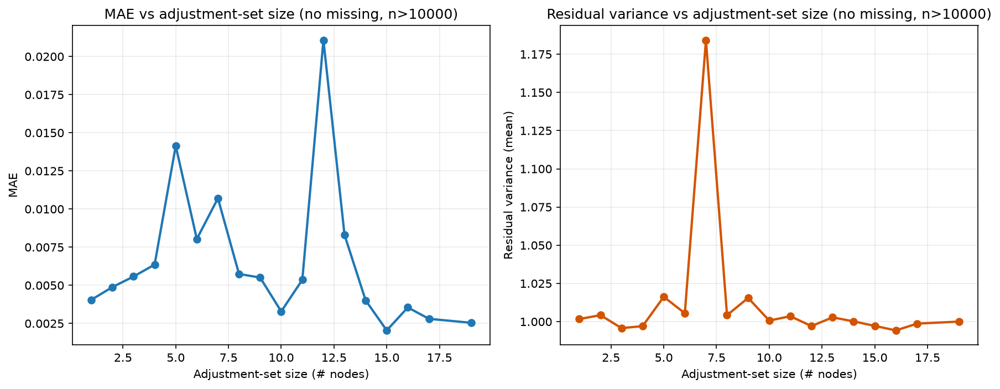

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_mae_resid_vs_adjustment_set_size_no_missing_n_gt10000.png


In [12]:
# Filter to rows with no missing edges, no missing data, and sample size > 10000
eval_filtered = eval_df[
    (eval_df["missing_edge_rate"] == 0)
    & (eval_df["missing_data_rate"] == 0)
    & (eval_df["n_samples"] > 10000)
].copy()

print(f"Filtered rows: {len(eval_filtered):,}")

# Compute adjustment-set size (uses adj_set_size defined earlier)
eval_filtered["adjustment_set_size"] = eval_filtered["adjustment_set"].apply(adj_set_size)
eval_filtered = eval_filtered.dropna(subset=["adjustment_set_size"])
eval_filtered["adjustment_set_size"] = eval_filtered["adjustment_set_size"].astype(int)

# Aggregate metrics by adjustment_set_size
adj_summary = (
    eval_filtered.groupby("adjustment_set_size", dropna=False)
    .agg(
        n=("error", "size"),
        MAE=("abs_error", "mean"),
        RMSE=("sq_error", lambda x: float(np.sqrt(np.mean(x)))),
        bias=("error", "mean"),
        residual_mean=("residual_variance", "mean"),
        residual_median=("residual_variance", "median"),
    )
    .reset_index()
    .sort_values("adjustment_set_size")
)

adj_csv = NB_DIR / "csd_estimation_adjustment_set_size_summary_no_missing_n_gt10000.csv"
adj_summary.to_csv(adj_csv, index=False)
print(f"Wrote adjustment-set-size summary: {adj_csv}")

display(adj_summary.head(20))

# Plot MAE and residual variance vs adjustment set size
fig, axes = plt.subplots(1, 2, figsize=(12, 4.8), sharex=True)

axes[0].plot(adj_summary["adjustment_set_size"], adj_summary["MAE"], marker="o", linewidth=2)
axes[0].set_xlabel("Adjustment-set size (# nodes)")
axes[0].set_ylabel("MAE")
axes[0].set_title("MAE vs adjustment-set size (no missing, n>10000)")
axes[0].grid(True, alpha=0.25)

axes[1].plot(
    adj_summary["adjustment_set_size"],
    adj_summary["residual_mean"],
    marker="o",
    linewidth=2,
    color="#d35400",
)
axes[1].set_xlabel("Adjustment-set size (# nodes)")
axes[1].set_ylabel("Residual variance (mean)")
axes[1].set_title("Residual variance vs adjustment-set size (no missing, n>10000)")
axes[1].grid(True, alpha=0.25)

plt.tight_layout()
out = VIZ_DIR / "csd_estimation_mae_resid_vs_adjustment_set_size_no_missing_n_gt10000.png"
plt.savefig(out, dpi=150, bbox_inches="tight")
plt.close()

display(Image(str(out)))
print(f"Saved: {out}")


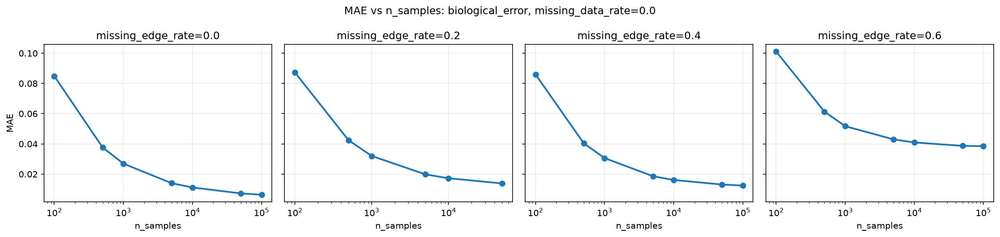

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_lines_biological_error_data_rate0.0.png


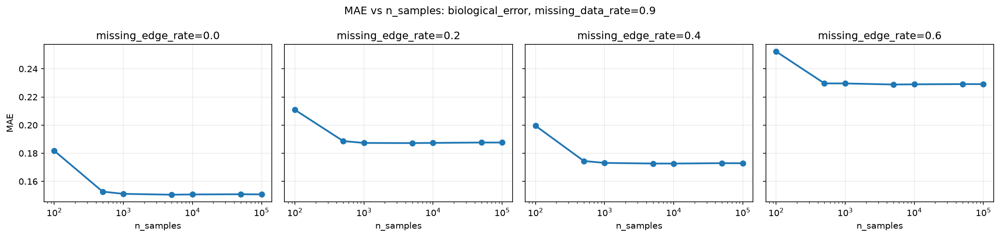

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_lines_biological_error_data_rate0.9.png


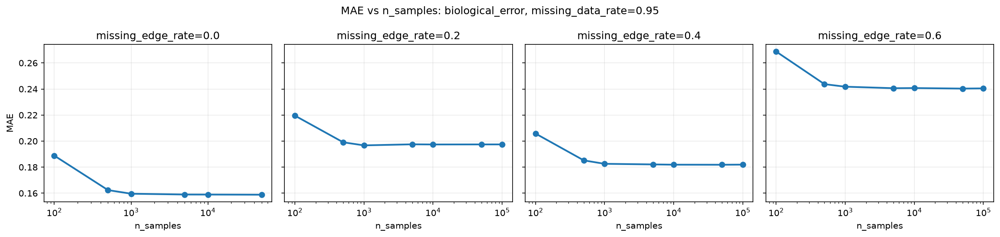

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_lines_biological_error_data_rate0.95.png


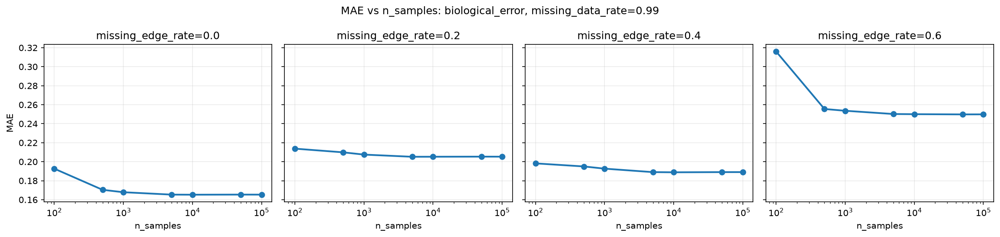

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_lines_biological_error_data_rate0.99.png


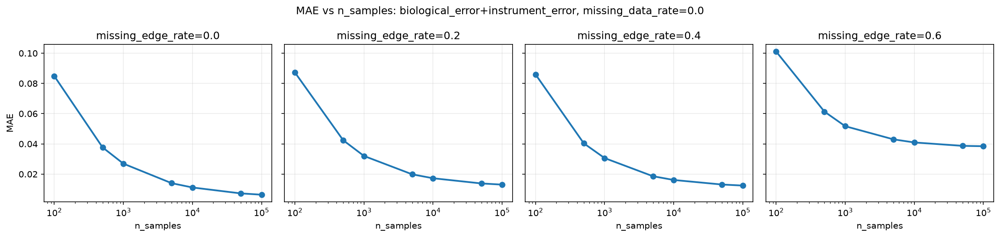

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_lines_biological_error+instrument_error_data_rate0.0.png


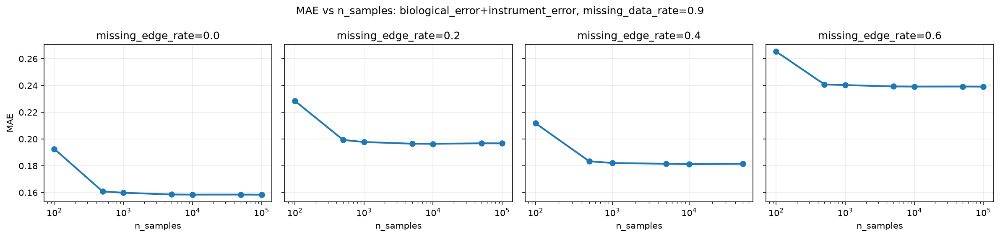

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_lines_biological_error+instrument_error_data_rate0.9.png


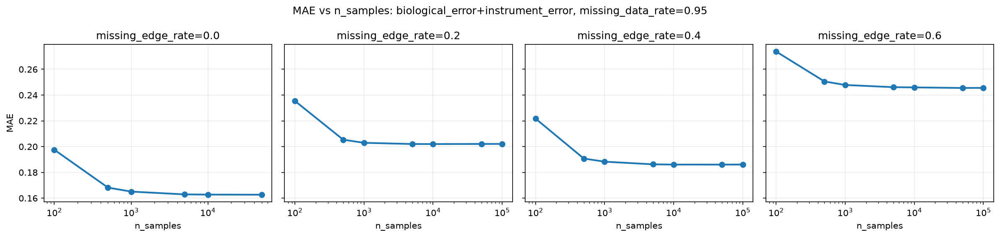

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_lines_biological_error+instrument_error_data_rate0.95.png


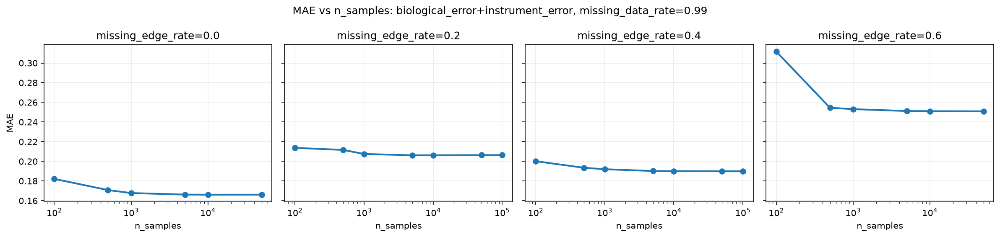

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_lines_biological_error+instrument_error_data_rate0.99.png


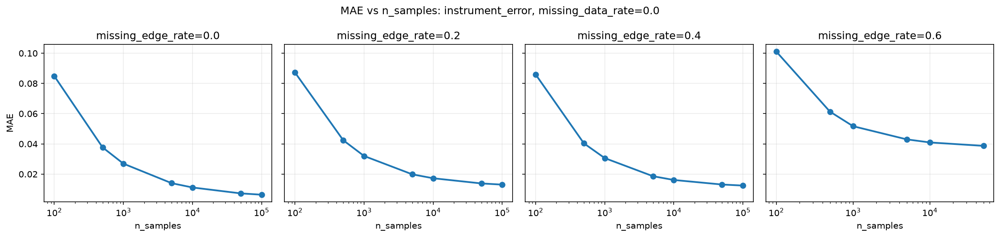

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_lines_instrument_error_data_rate0.0.png


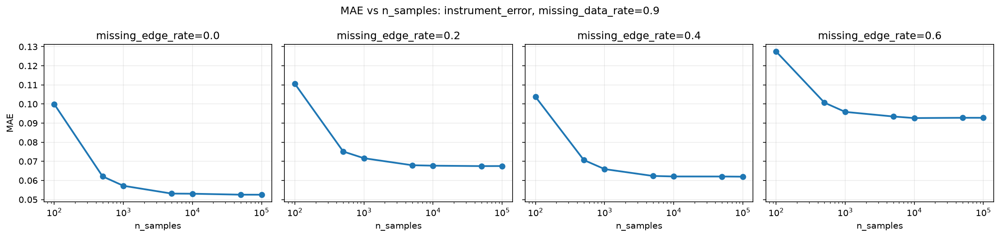

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_lines_instrument_error_data_rate0.9.png


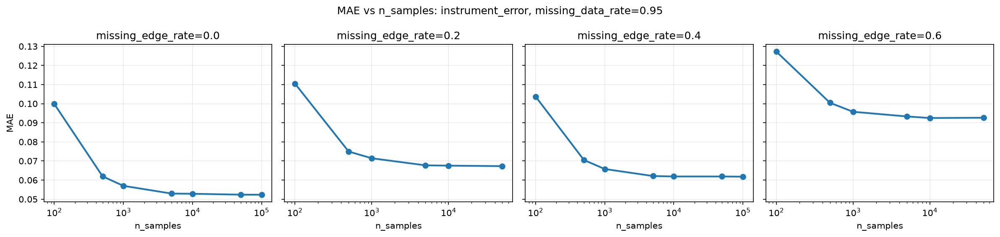

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_lines_instrument_error_data_rate0.95.png


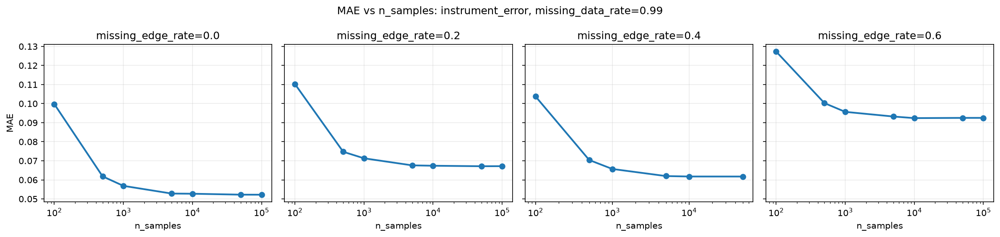

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_MAE_lines_instrument_error_data_rate0.99.png


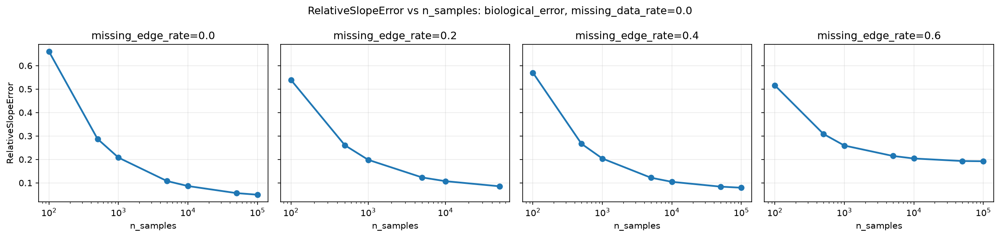

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_lines_biological_error_data_rate0.0.png


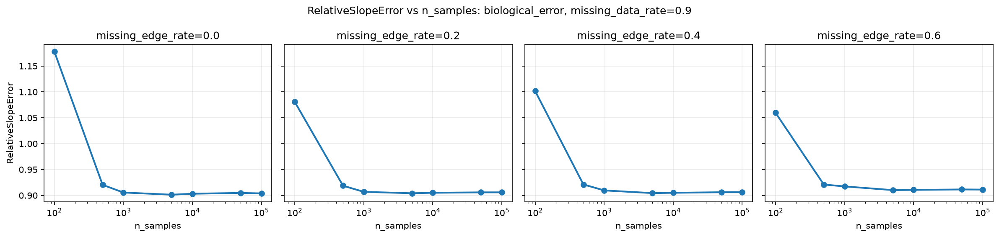

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_lines_biological_error_data_rate0.9.png


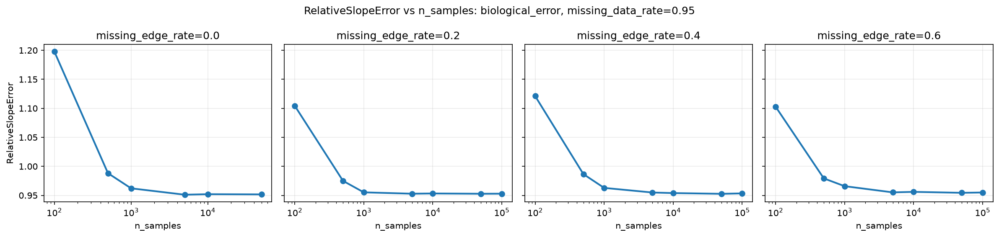

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_lines_biological_error_data_rate0.95.png


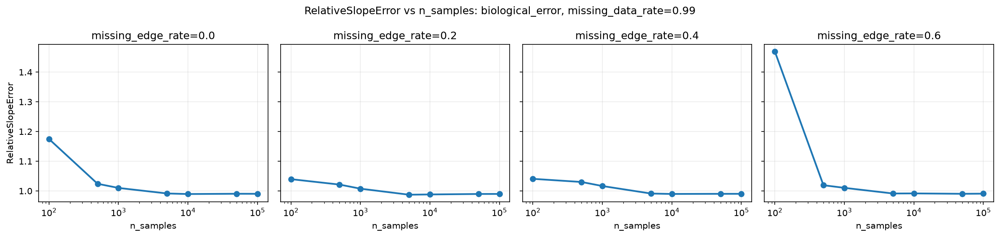

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_lines_biological_error_data_rate0.99.png


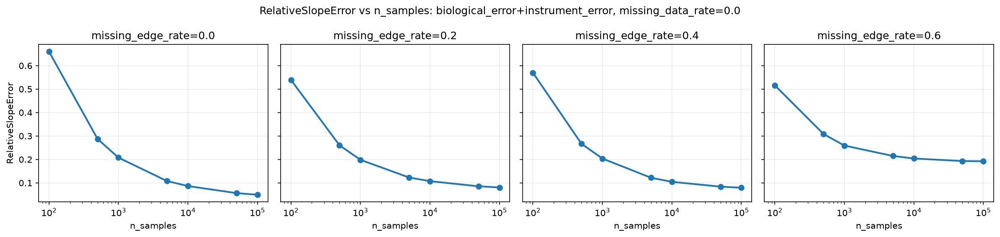

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_lines_biological_error+instrument_error_data_rate0.0.png


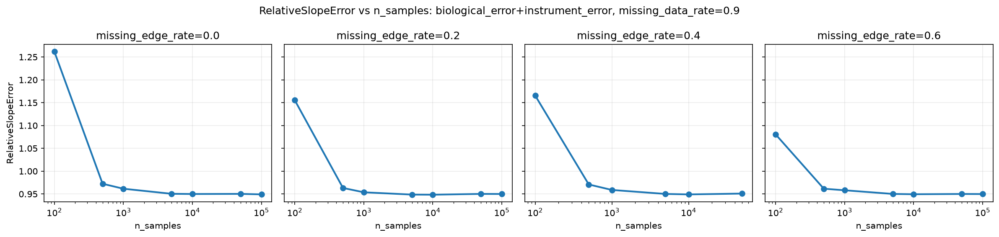

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_lines_biological_error+instrument_error_data_rate0.9.png


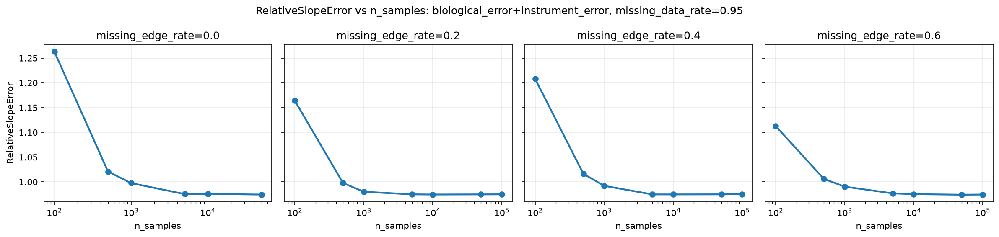

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_lines_biological_error+instrument_error_data_rate0.95.png


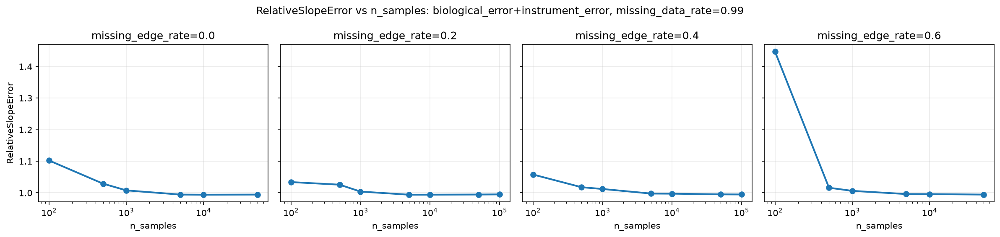

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_lines_biological_error+instrument_error_data_rate0.99.png


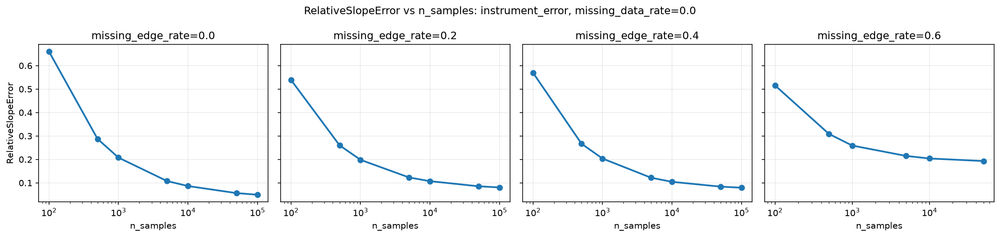

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_lines_instrument_error_data_rate0.0.png


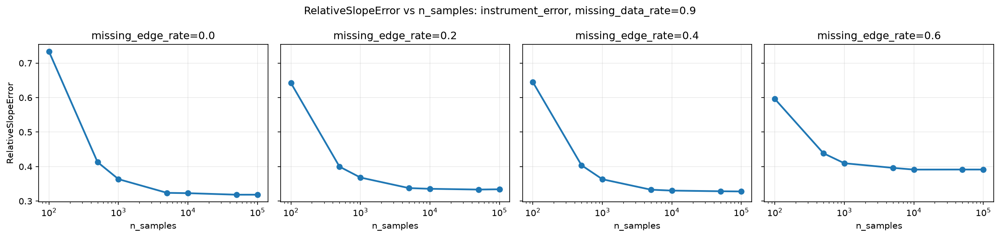

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_lines_instrument_error_data_rate0.9.png


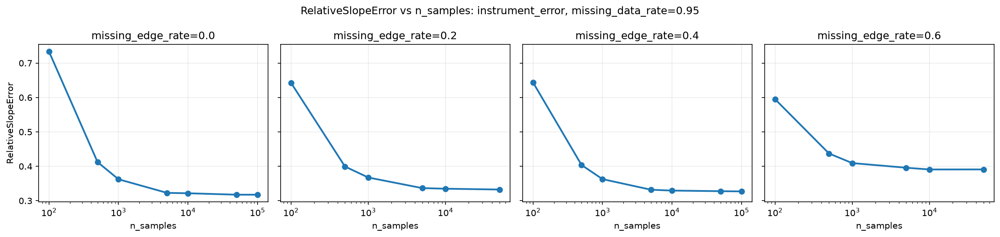

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_lines_instrument_error_data_rate0.95.png


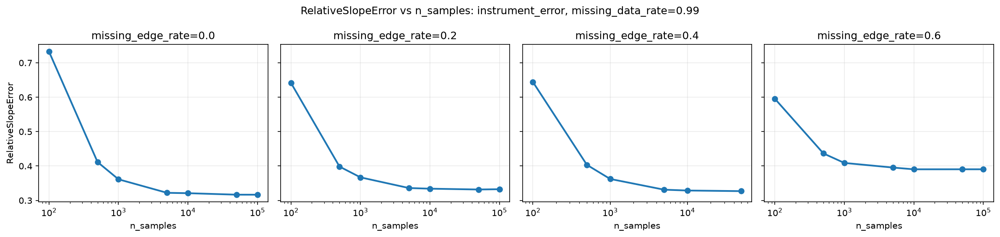

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_RelativeSlopeError_lines_instrument_error_data_rate0.99.png


In [13]:
# Line plot: MAE vs n_samples for each missing_edge_rate (separate panels)
def plot_error_versus_samples_against_me_dr(metric: str):
    edge_rates = sorted(eval_df['missing_edge_rate'].unique())

    mechs = sorted(eval_df['missing_data_mechanism'].unique())
    data_rates = sorted(eval_df['missing_data_rate'].unique())

    for mech in mechs:
        for dr in data_rates:
            sub = g[(g['missing_data_mechanism'] == mech) & (g['missing_data_rate'] == dr)].copy()
            if len(sub) == 0:
                continue

            sub = sub.sort_values(['missing_edge_rate', 'n_samples'])
            fig, axes = plt.subplots(
                1,
                len(edge_rates),
                figsize=(4.0 * len(edge_rates), 3.8),
                sharey=True,
            )
            if len(edge_rates) == 1:
                axes = [axes]

            for ax, er in zip(axes, edge_rates):
                s2 = sub[sub['missing_edge_rate'] == er]
                ax.plot(s2['n_samples'], s2[metric], marker='o', linewidth=2)
                ax.set_title(f'missing_edge_rate={er}')
                ax.set_xlabel('n_samples')
                ax.set_xscale('log')
                ax.grid(True, alpha=0.25)

            axes[0].set_ylabel(metric)
            fig.suptitle(f'{metric} vs n_samples: {mech}, missing_data_rate={dr}')
            plt.tight_layout()

            out = VIZ_DIR / f'csd_estimation_{metric}_lines_{mech}_data_rate{dr}.png'
            plt.savefig(out, dpi=150, bbox_inches='tight')
            plt.close()

            display(Image(str(out)))
            print(f'Saved: {out}')

plot_error_versus_samples_against_me_dr("MAE")
plot_error_versus_samples_against_me_dr("RelativeSlopeError")


## 3) How residual variance changes with parameters

In [14]:
resid_group_cols = [
    'missing_data_mechanism',
    'missing_data_rate',
    'missing_edge_rate',
    'n_samples',
]

res = (
    eval_df.groupby(resid_group_cols, dropna=False)
    .agg(
        n=('residual_variance', 'size'),
        residual_mean=('residual_variance', 'mean'),
        residual_median=('residual_variance', 'median'),
        residual_std=('residual_variance', 'std'),
    )
    .reset_index()
)

res_csv = NB_DIR / 'csd_estimation_residual_variance_summary.csv'
res.to_csv(res_csv, index=False)
print(f'Wrote residual variance summary: {res_csv}')


Wrote residual variance summary: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/csd_estimation_residual_variance_summary.csv


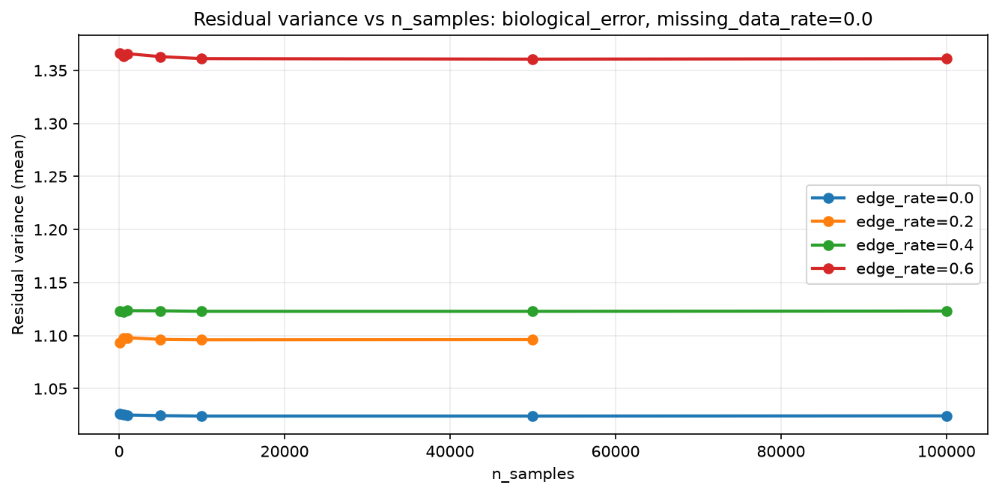

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_vs_n_biological_error_data_rate0.0.png


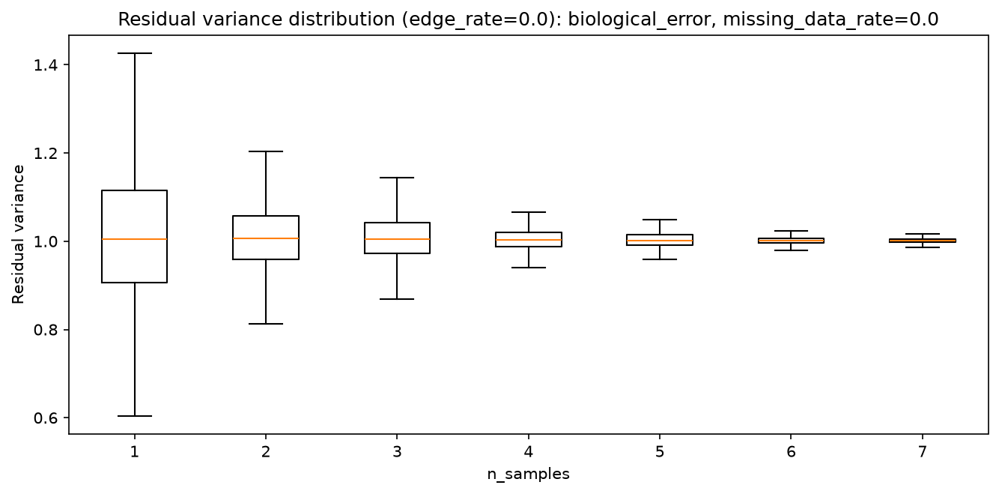

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error_data_rate0.0_edge0.0.png


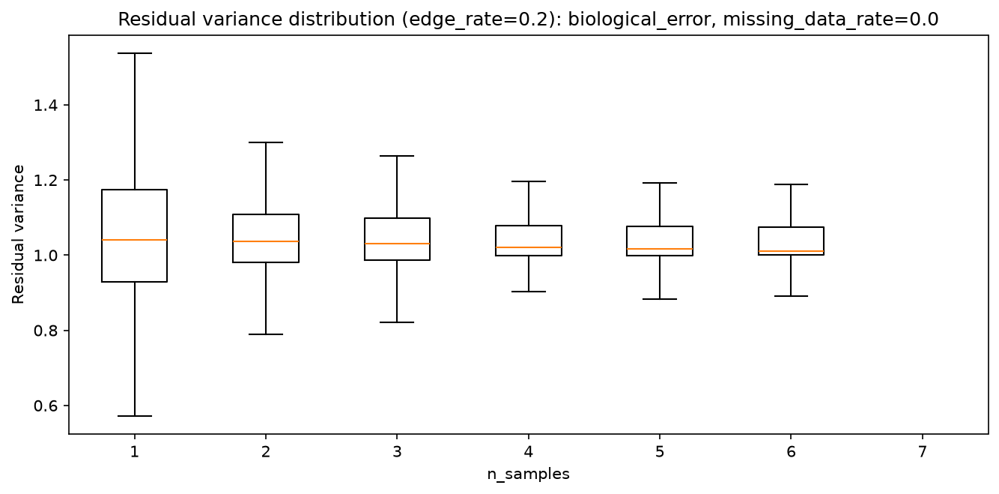

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error_data_rate0.0_edge0.2.png


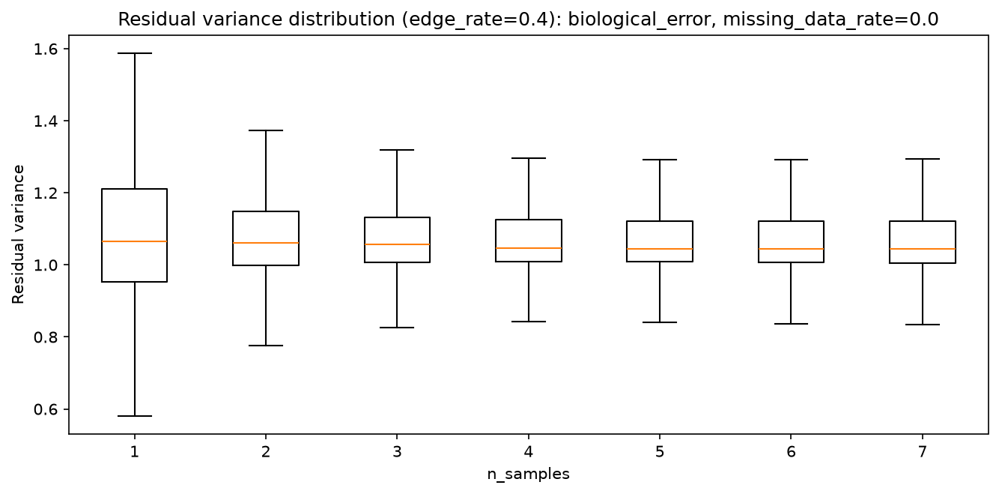

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error_data_rate0.0_edge0.4.png


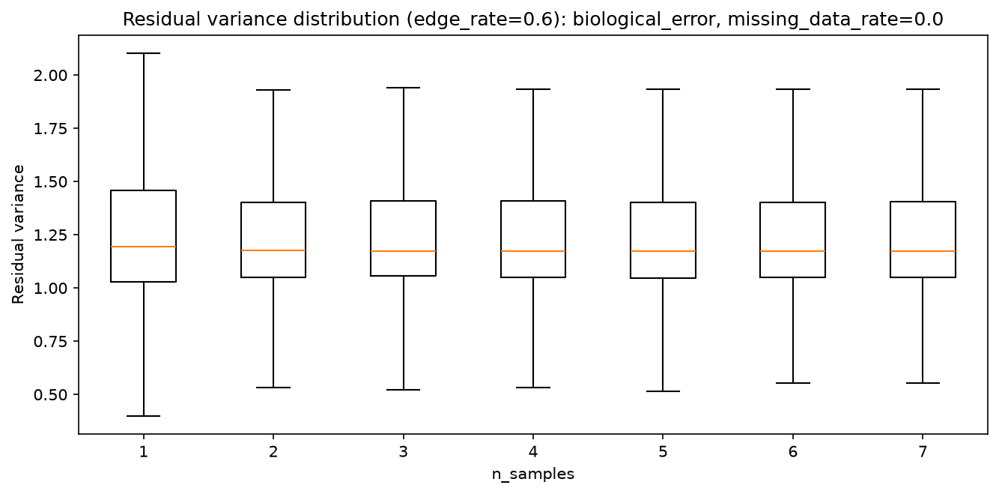

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error_data_rate0.0_edge0.6.png


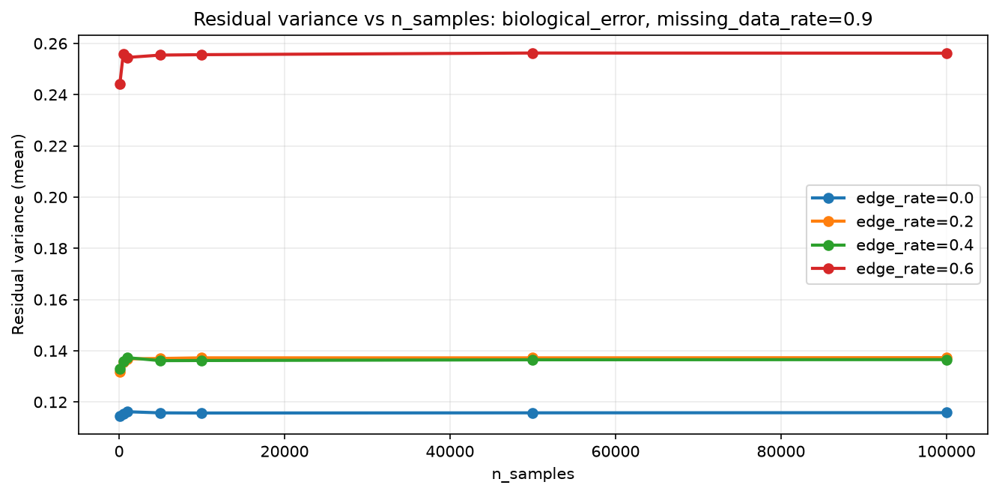

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_vs_n_biological_error_data_rate0.9.png


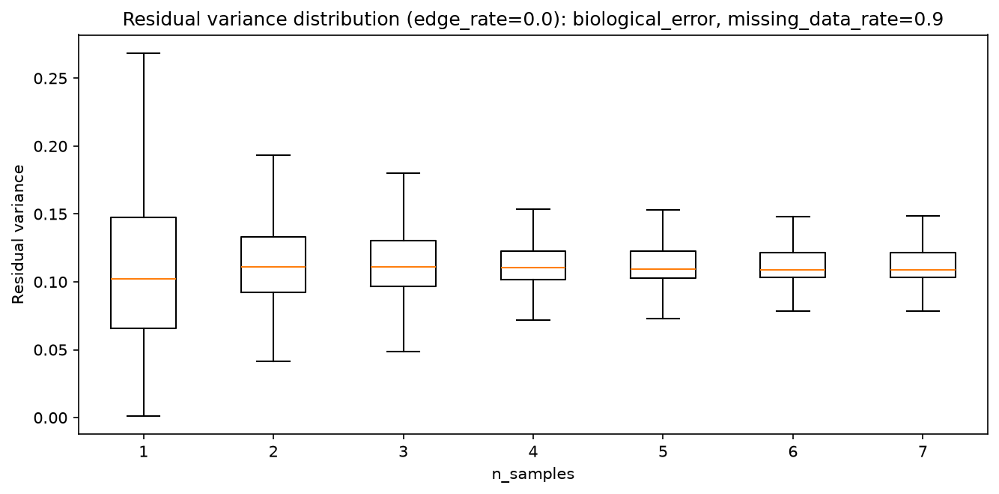

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error_data_rate0.9_edge0.0.png


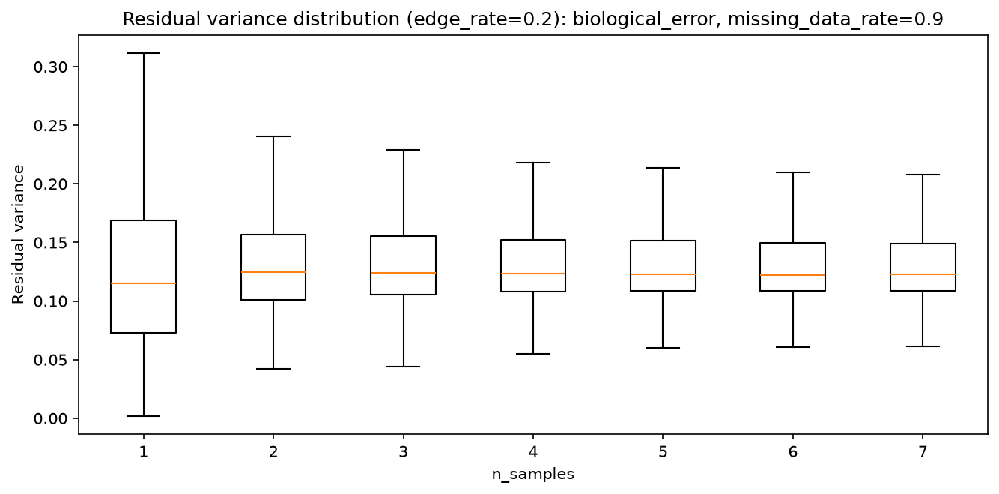

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error_data_rate0.9_edge0.2.png


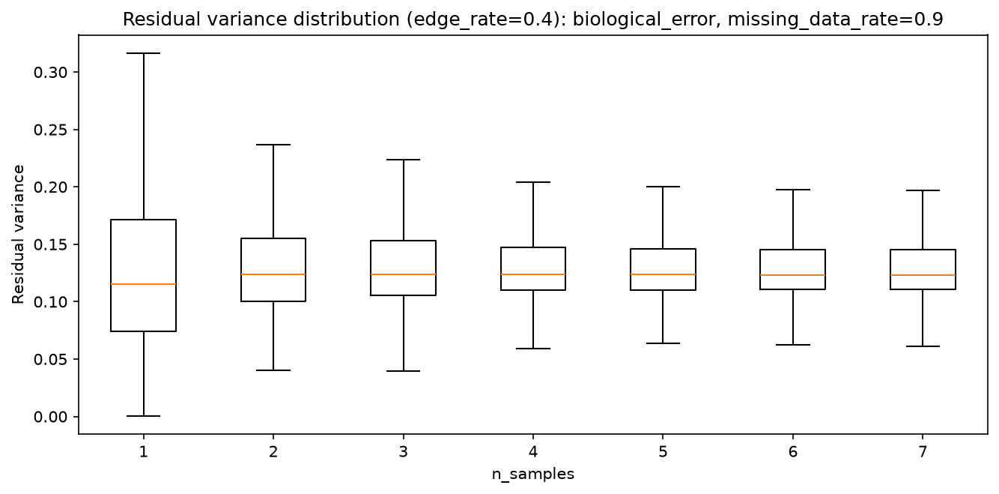

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error_data_rate0.9_edge0.4.png


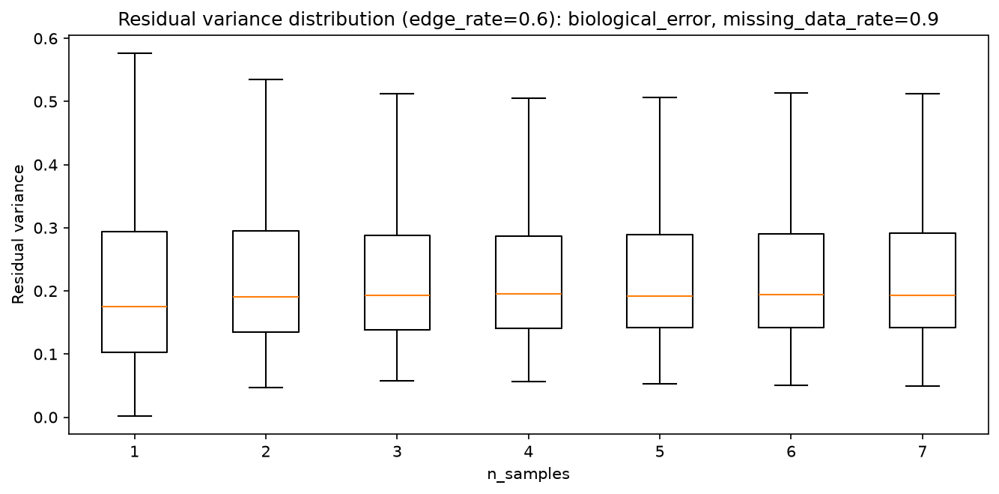

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error_data_rate0.9_edge0.6.png


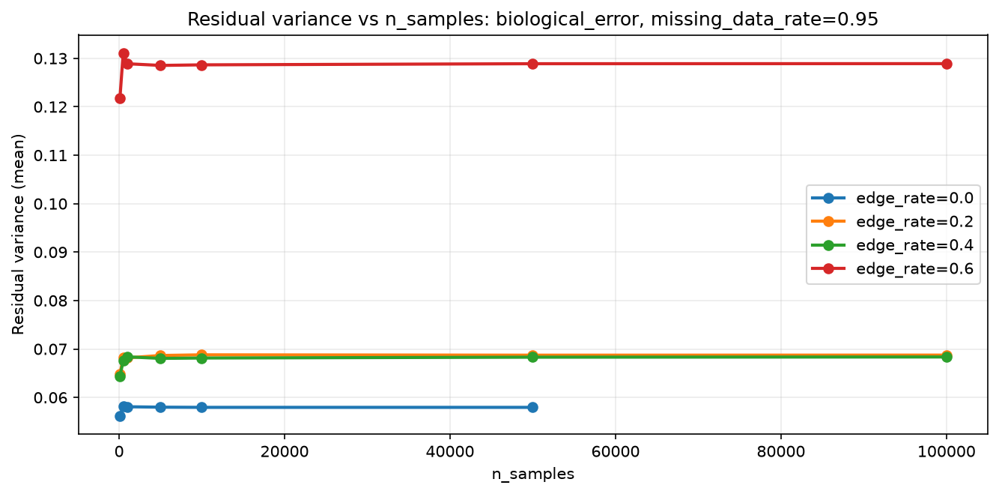

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_vs_n_biological_error_data_rate0.95.png


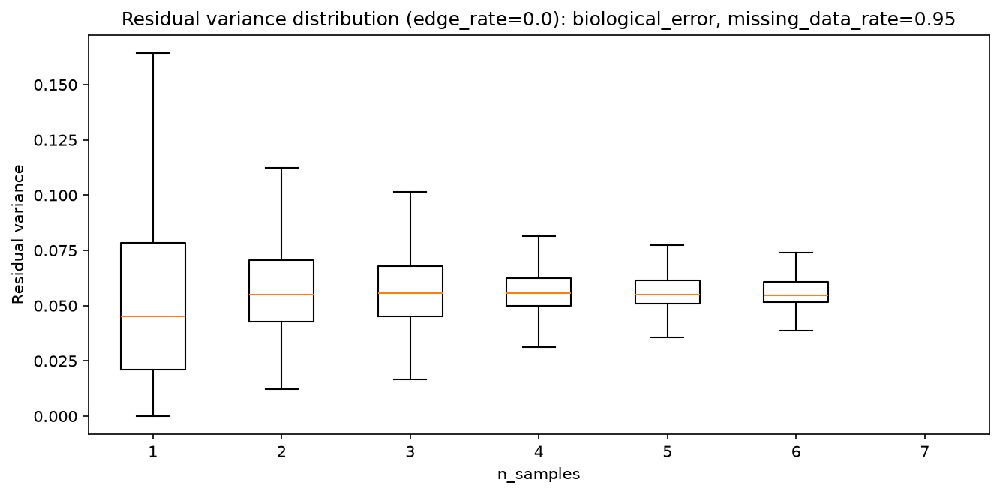

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error_data_rate0.95_edge0.0.png


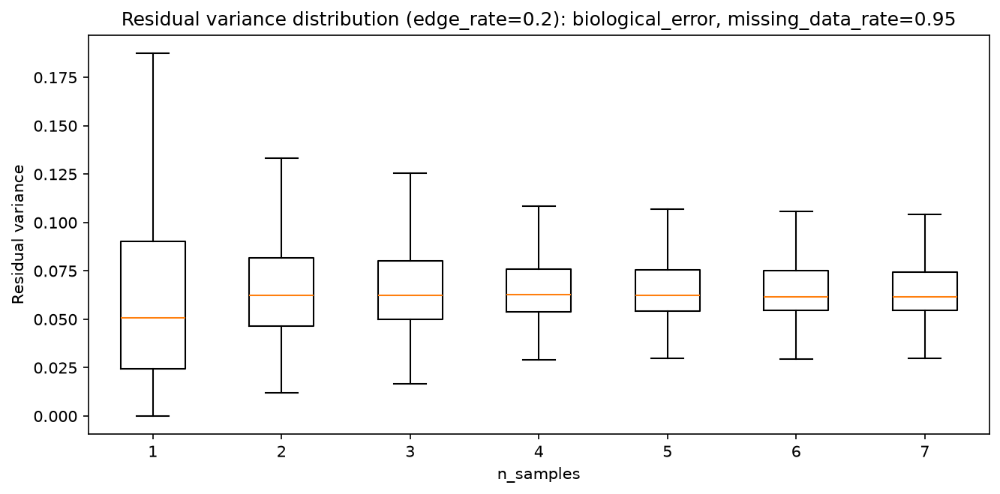

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error_data_rate0.95_edge0.2.png


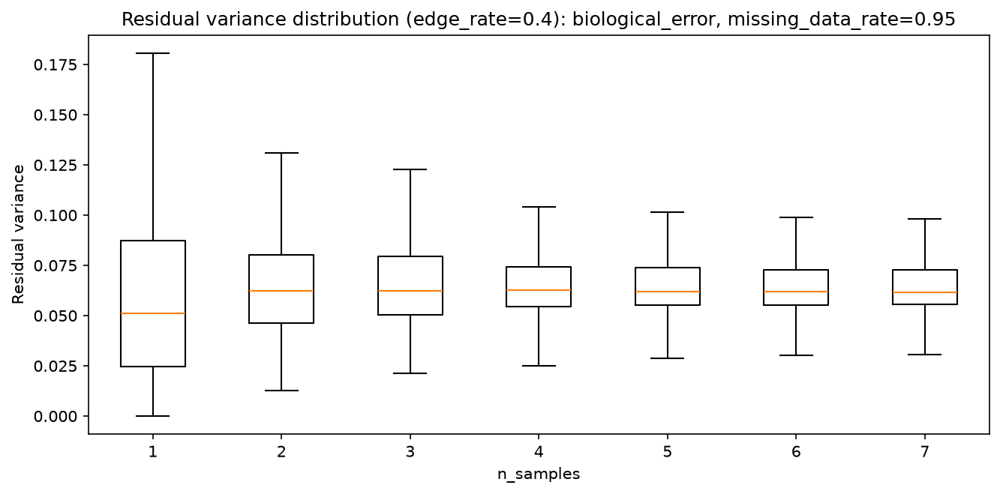

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error_data_rate0.95_edge0.4.png


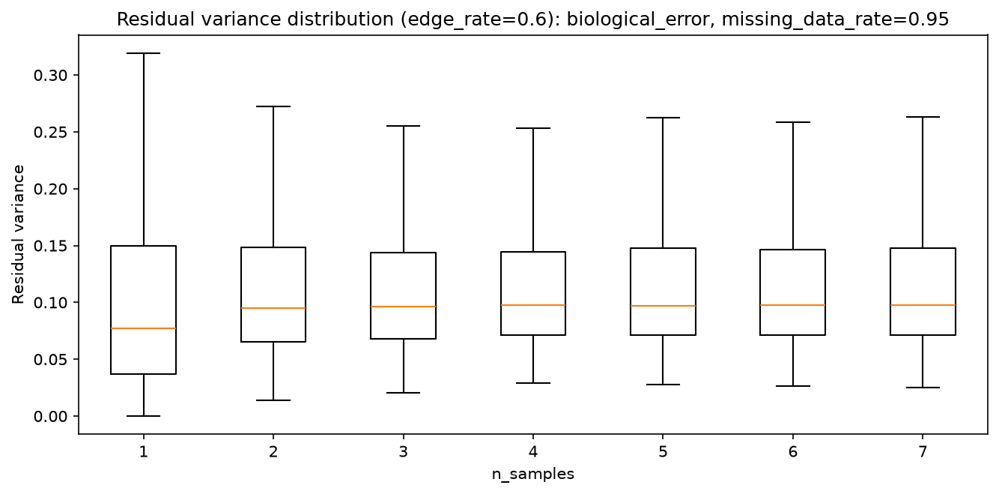

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error_data_rate0.95_edge0.6.png


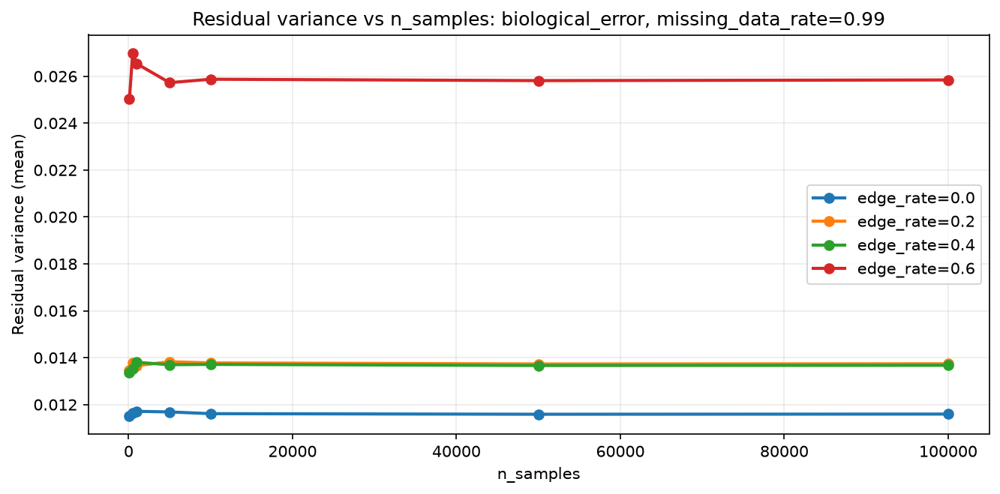

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_vs_n_biological_error_data_rate0.99.png


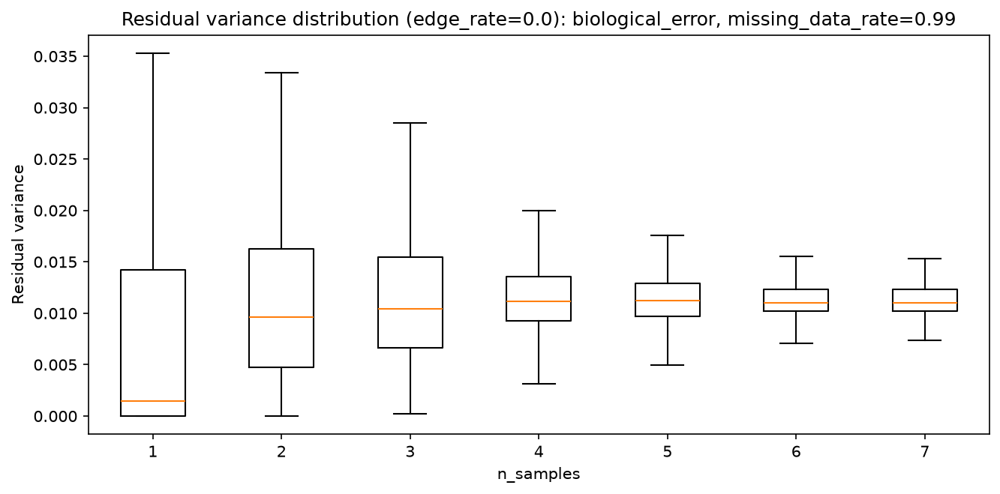

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error_data_rate0.99_edge0.0.png


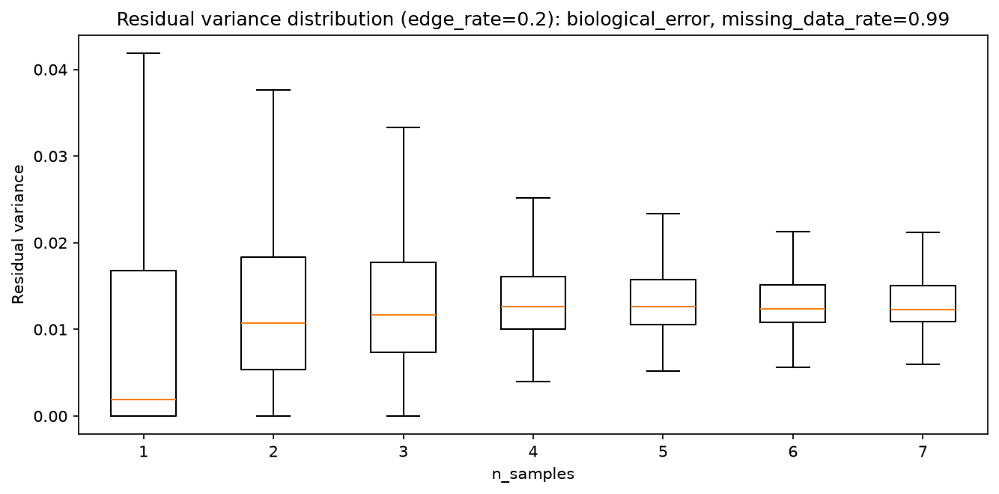

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error_data_rate0.99_edge0.2.png


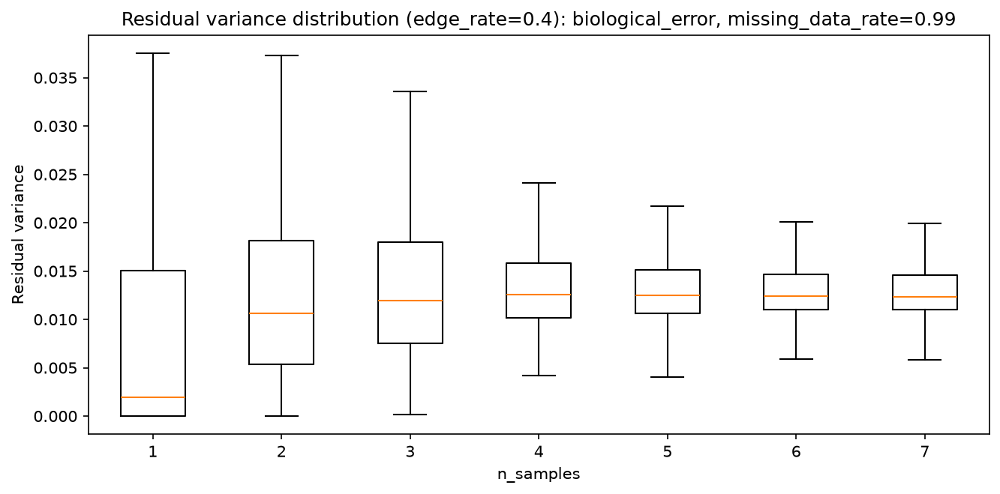

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error_data_rate0.99_edge0.4.png


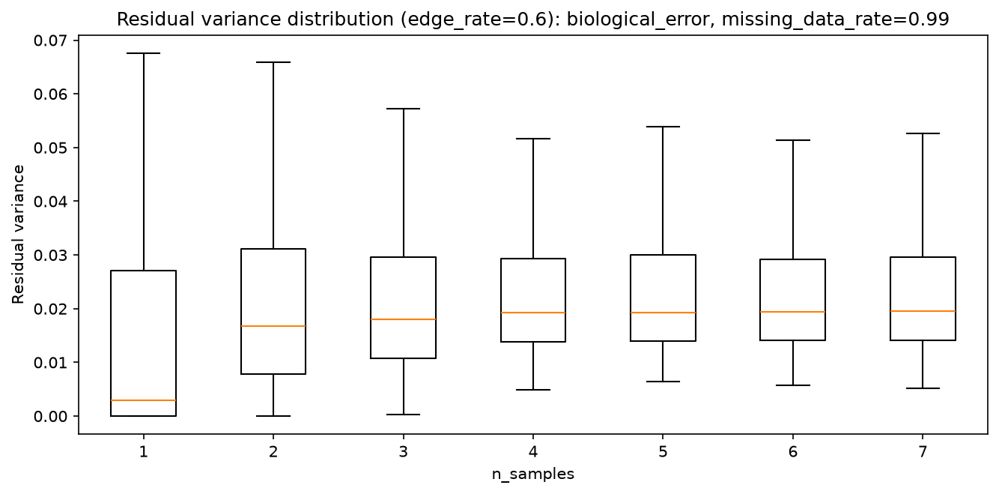

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error_data_rate0.99_edge0.6.png


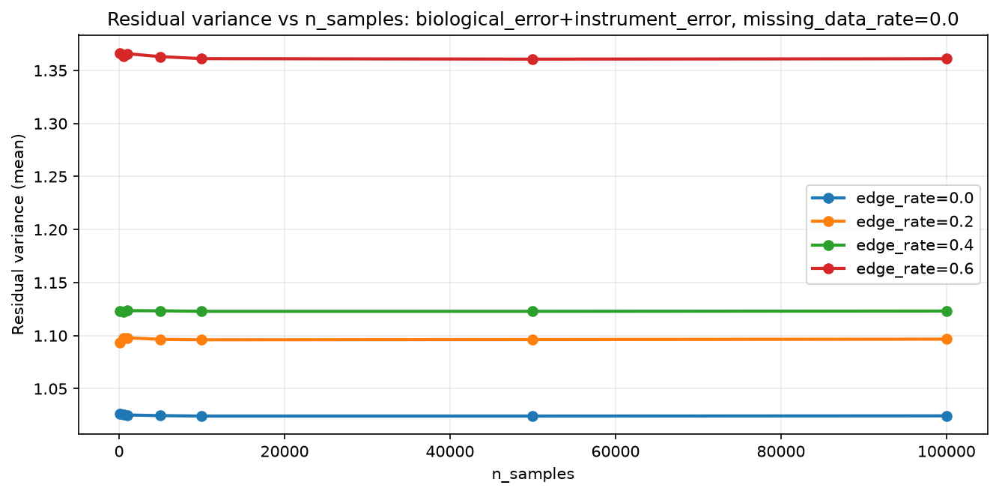

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_vs_n_biological_error+instrument_error_data_rate0.0.png


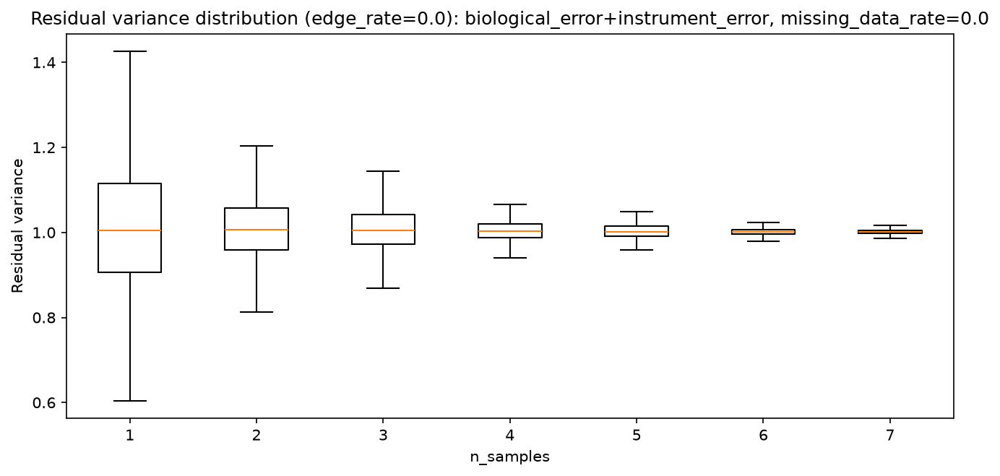

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error+instrument_error_data_rate0.0_edge0.0.png


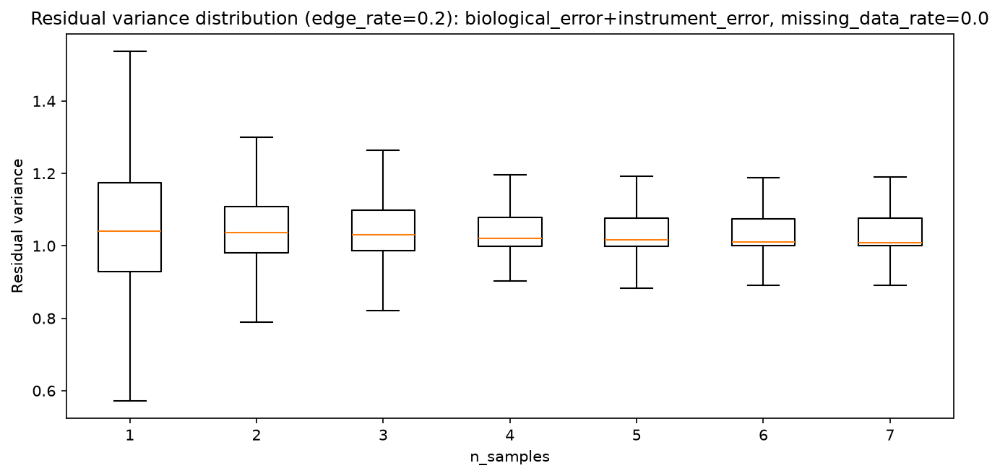

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error+instrument_error_data_rate0.0_edge0.2.png


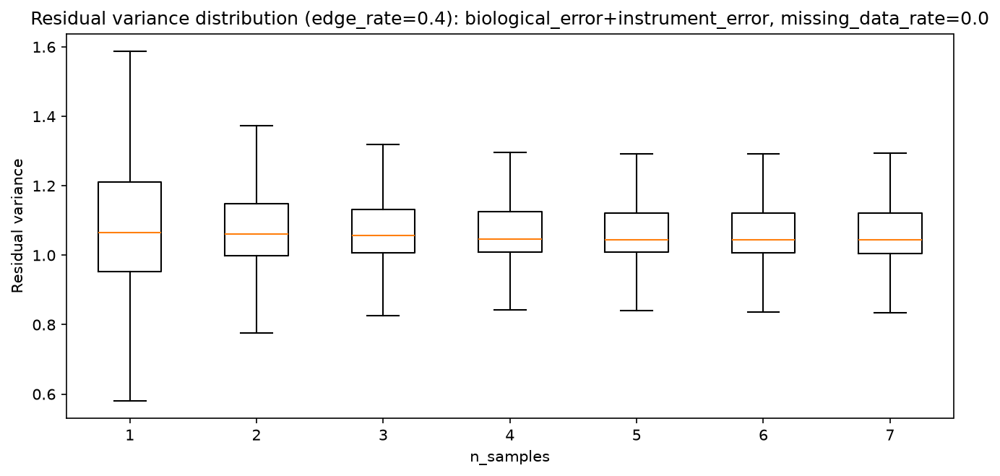

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error+instrument_error_data_rate0.0_edge0.4.png


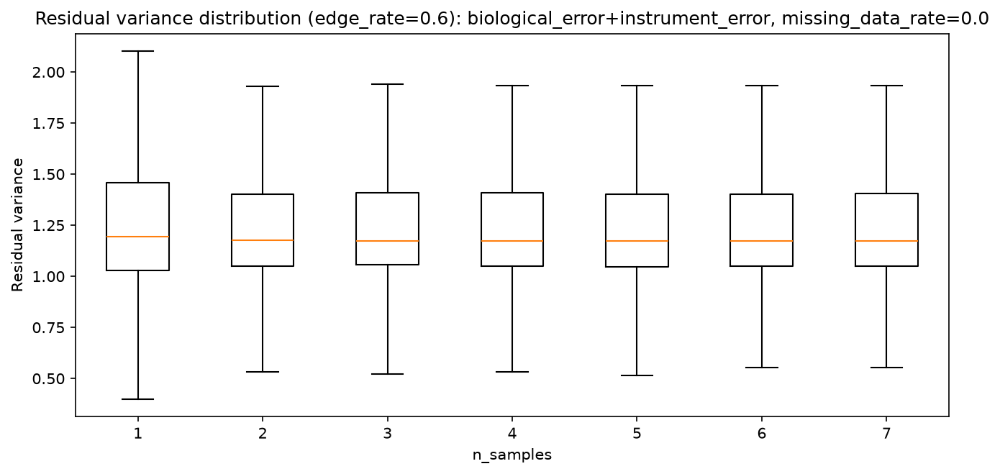

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error+instrument_error_data_rate0.0_edge0.6.png


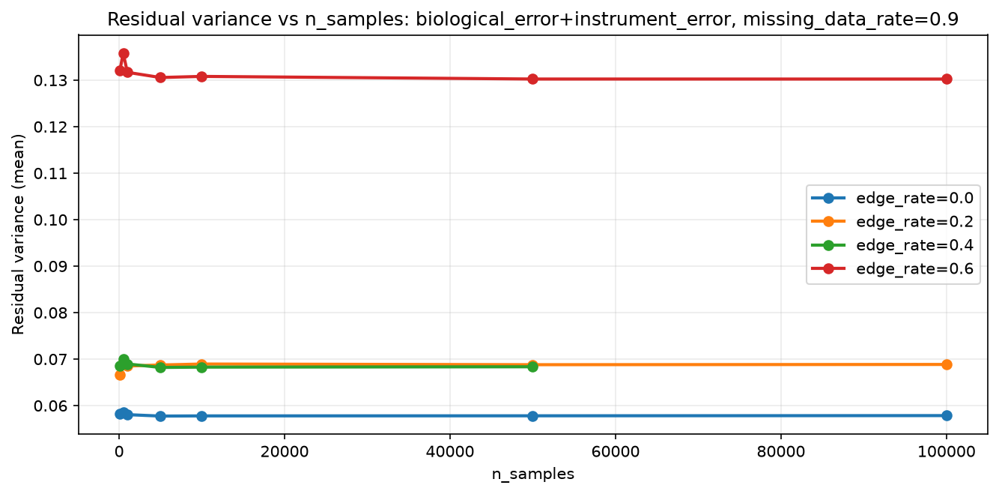

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_vs_n_biological_error+instrument_error_data_rate0.9.png


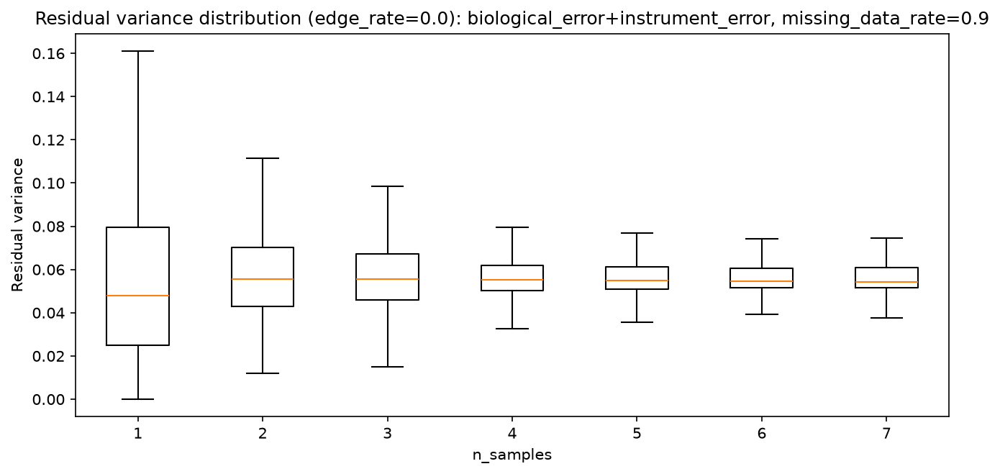

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error+instrument_error_data_rate0.9_edge0.0.png


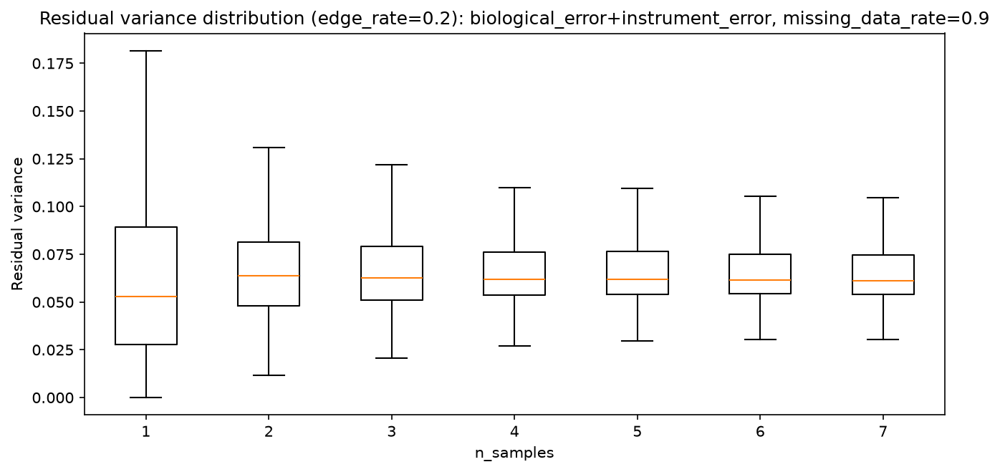

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error+instrument_error_data_rate0.9_edge0.2.png


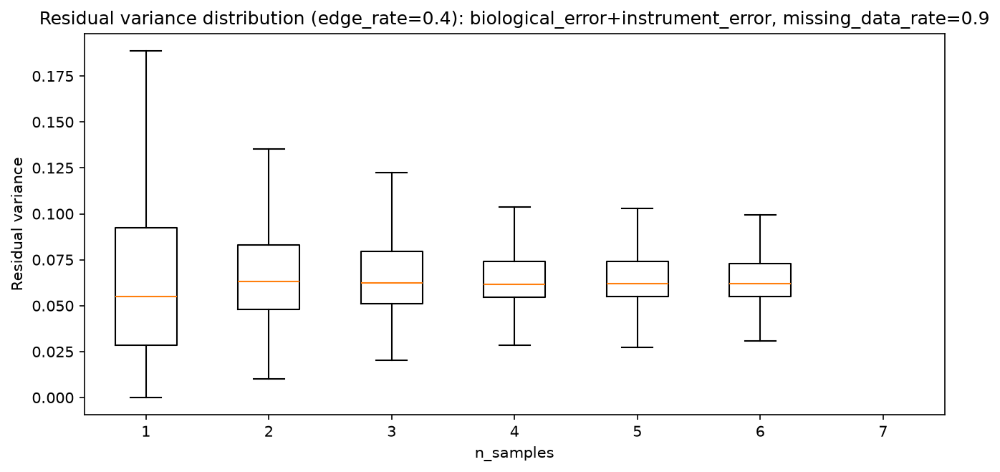

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error+instrument_error_data_rate0.9_edge0.4.png


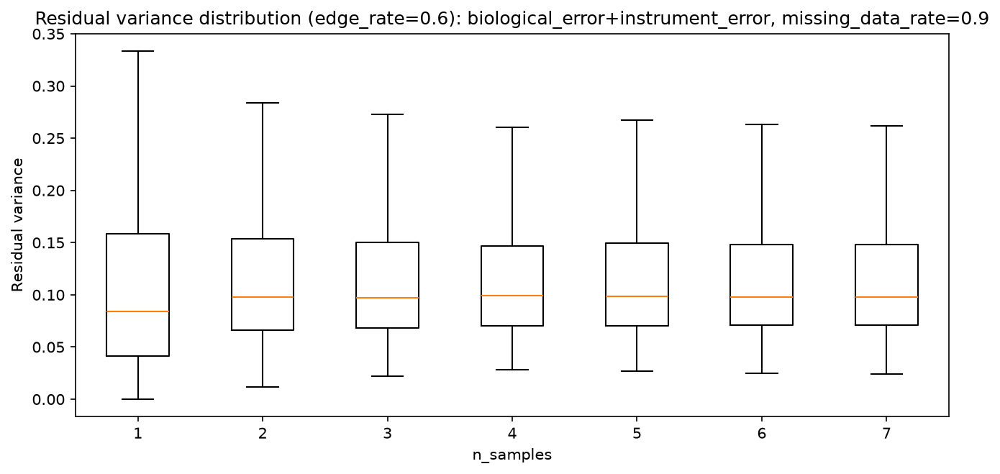

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error+instrument_error_data_rate0.9_edge0.6.png


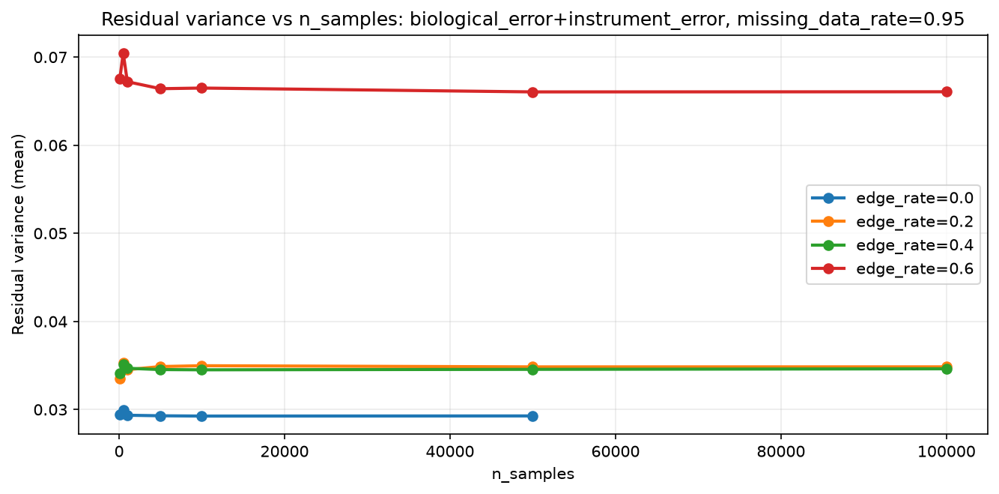

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_vs_n_biological_error+instrument_error_data_rate0.95.png


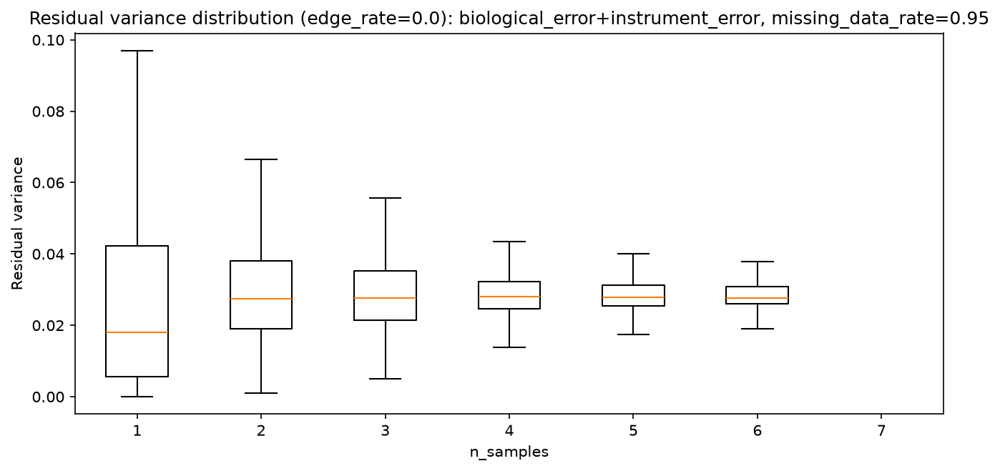

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error+instrument_error_data_rate0.95_edge0.0.png


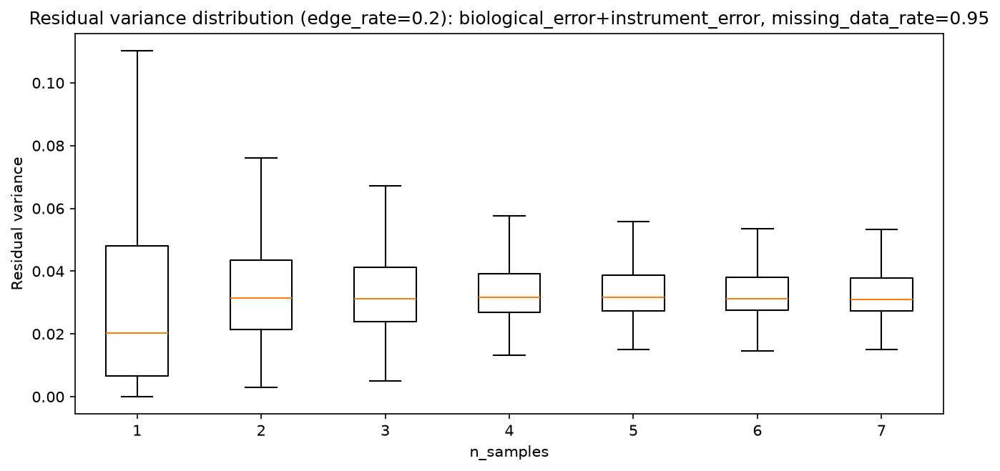

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error+instrument_error_data_rate0.95_edge0.2.png


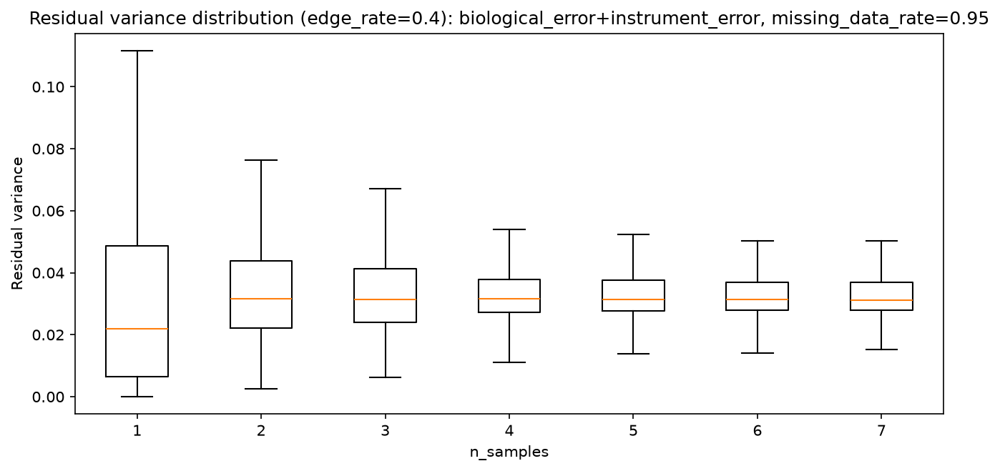

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error+instrument_error_data_rate0.95_edge0.4.png


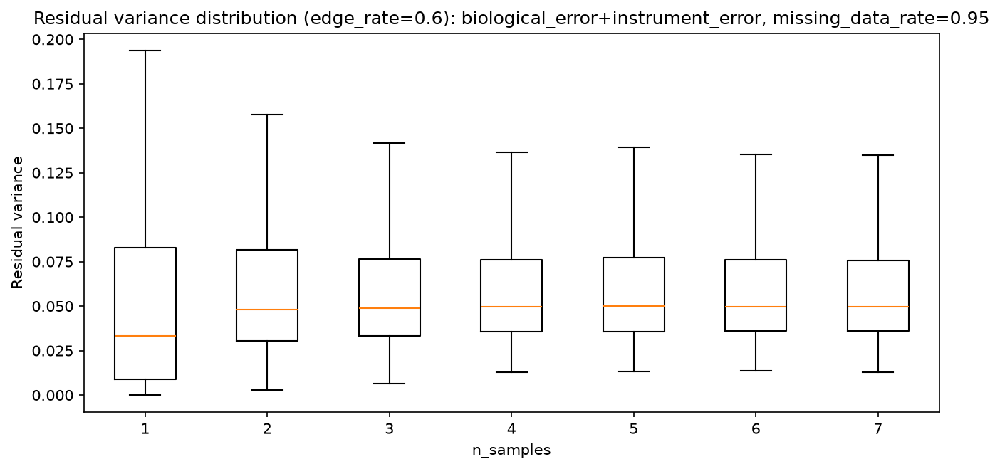

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error+instrument_error_data_rate0.95_edge0.6.png


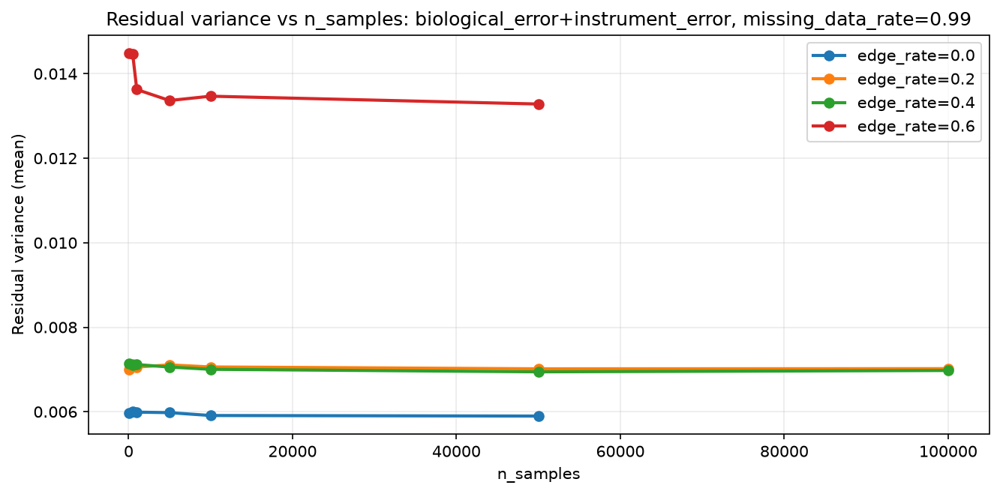

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_vs_n_biological_error+instrument_error_data_rate0.99.png


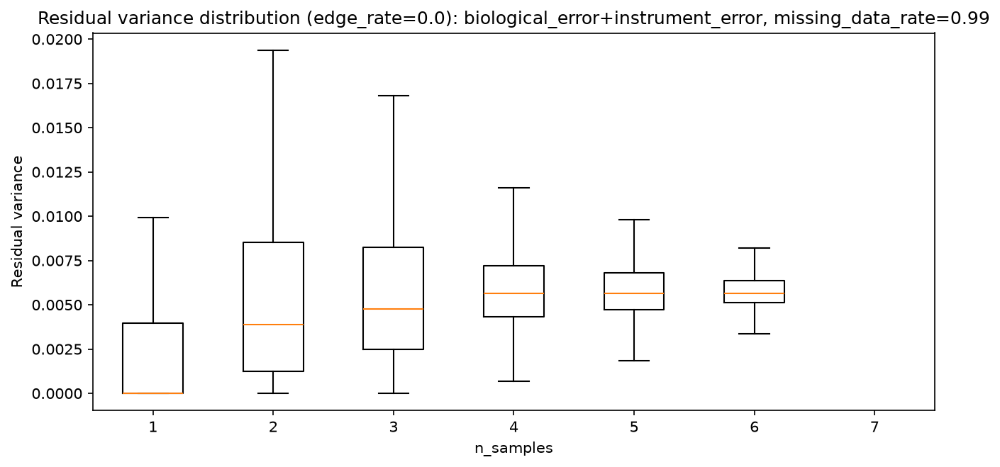

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error+instrument_error_data_rate0.99_edge0.0.png


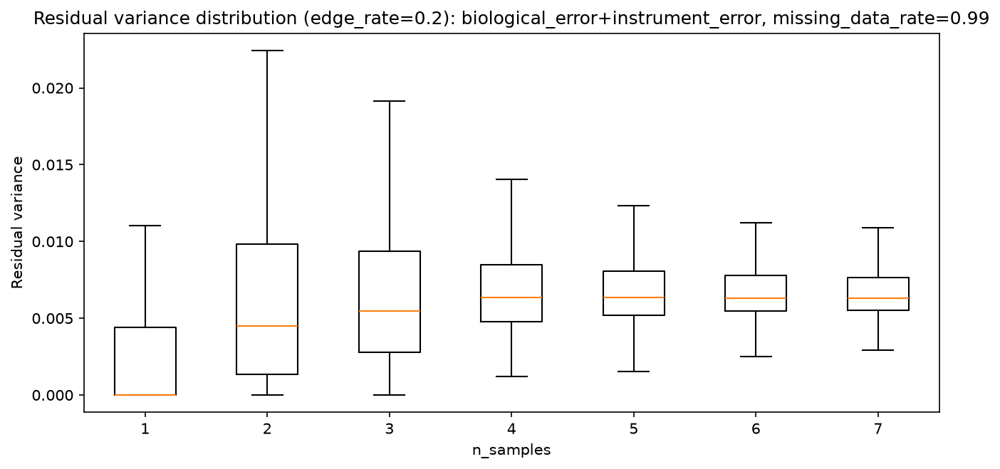

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error+instrument_error_data_rate0.99_edge0.2.png


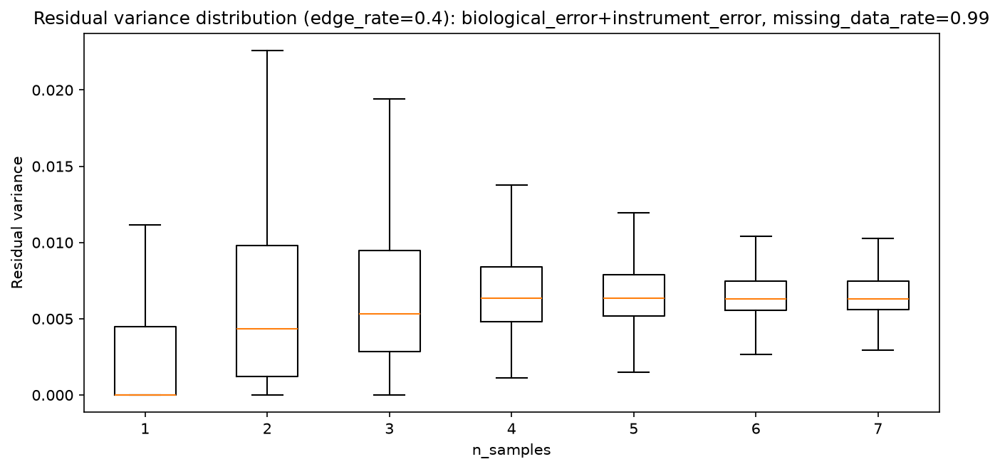

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error+instrument_error_data_rate0.99_edge0.4.png


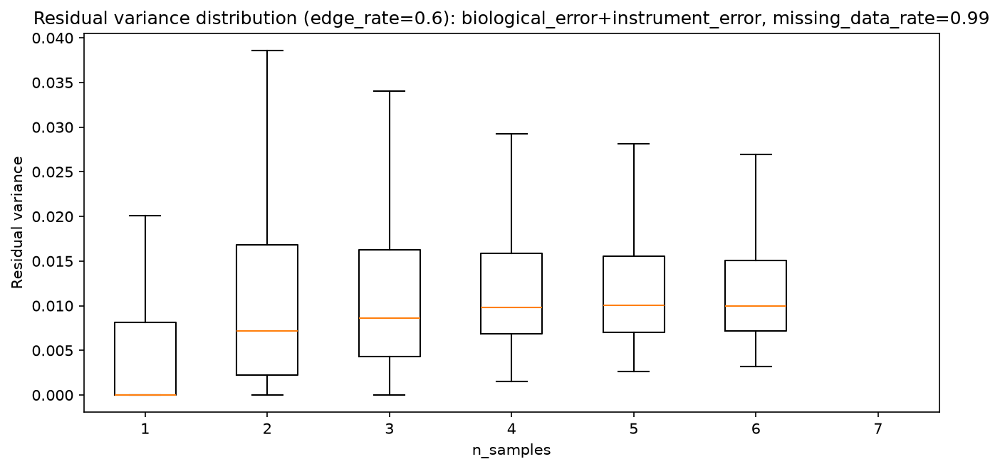

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_biological_error+instrument_error_data_rate0.99_edge0.6.png


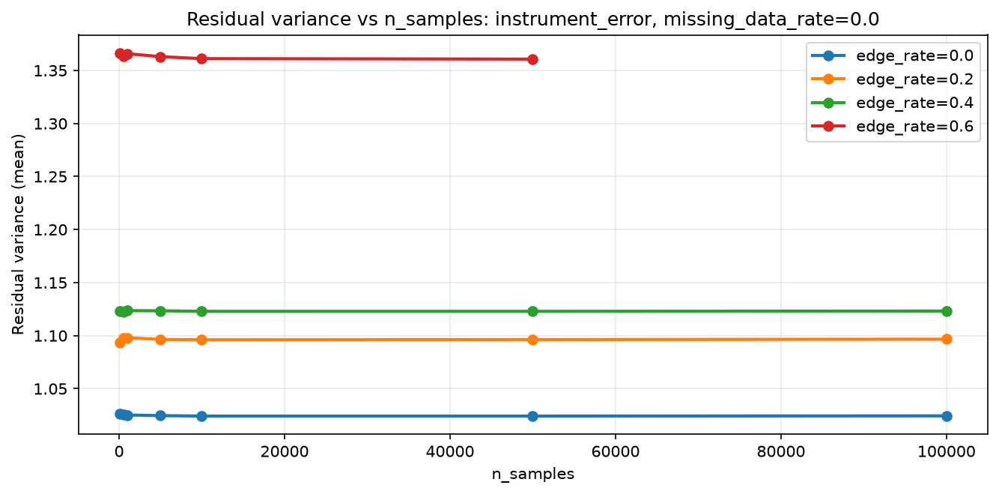

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_vs_n_instrument_error_data_rate0.0.png


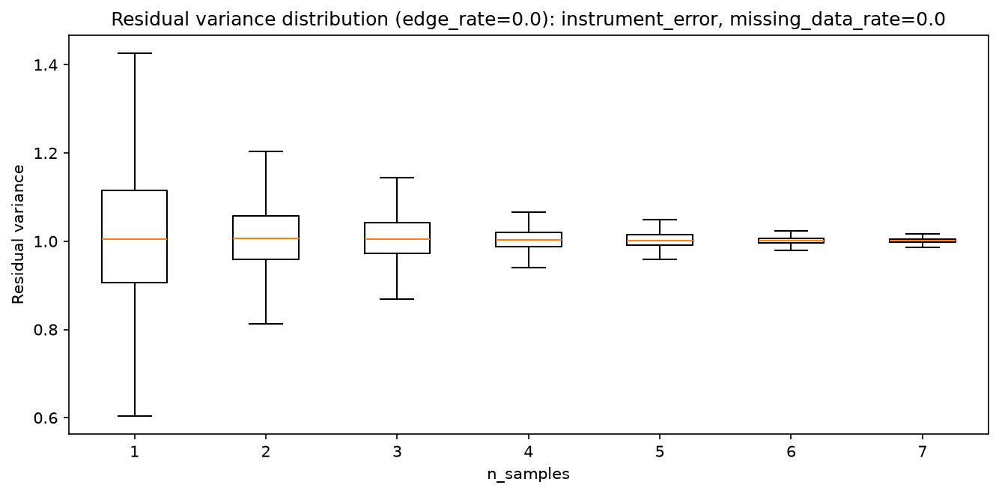

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_instrument_error_data_rate0.0_edge0.0.png


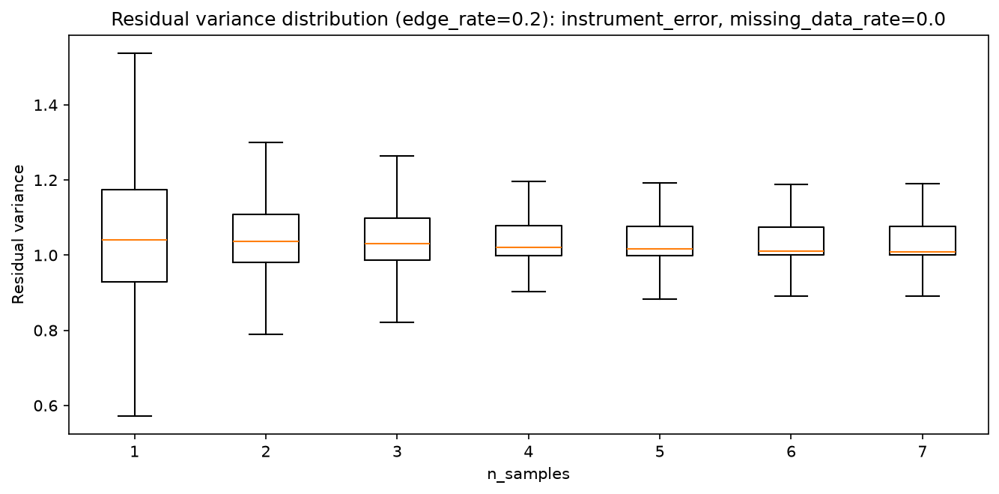

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_instrument_error_data_rate0.0_edge0.2.png


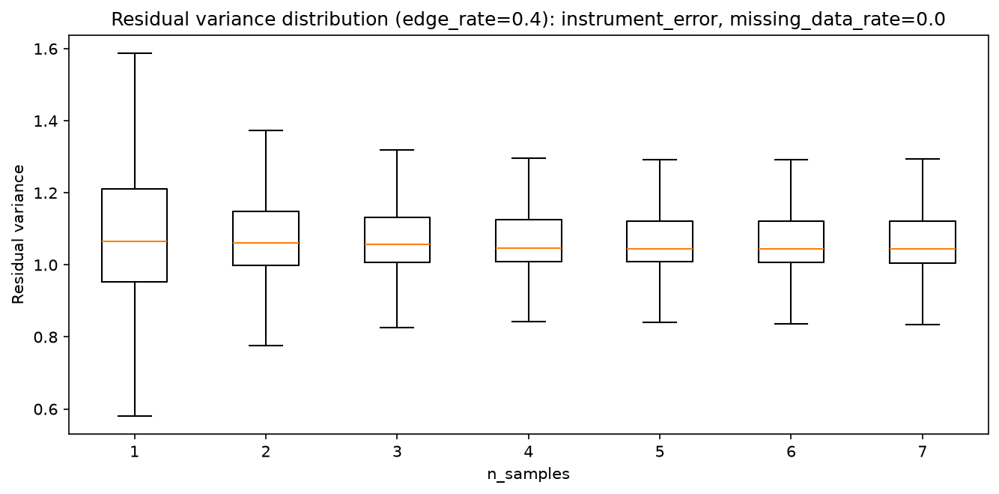

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_instrument_error_data_rate0.0_edge0.4.png


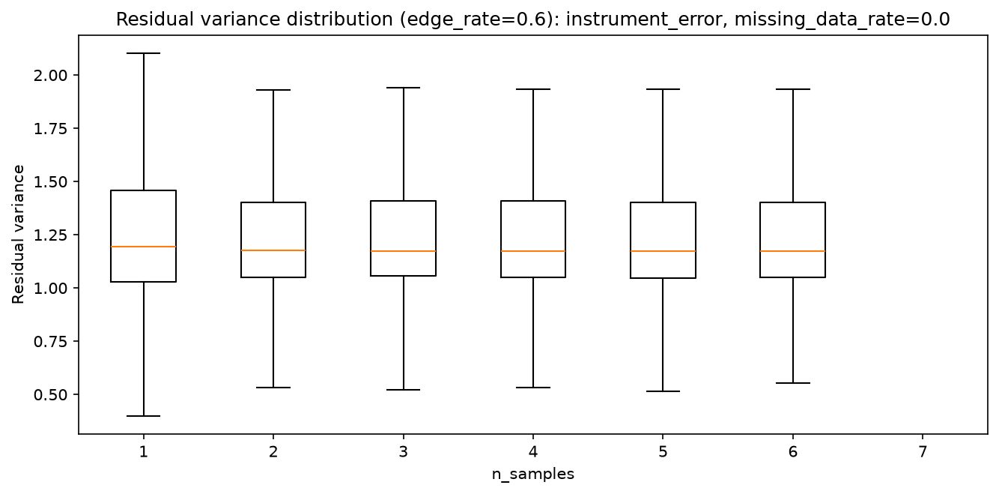

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_instrument_error_data_rate0.0_edge0.6.png


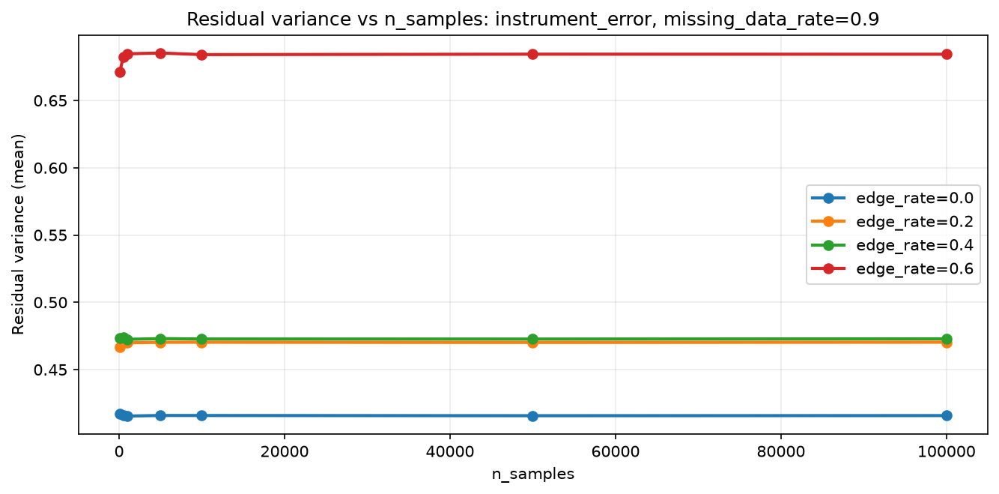

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_vs_n_instrument_error_data_rate0.9.png


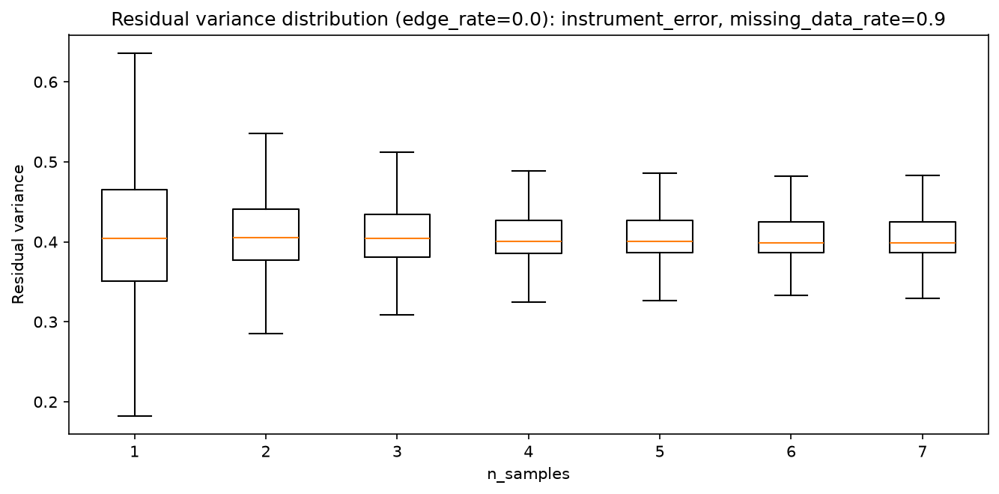

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_instrument_error_data_rate0.9_edge0.0.png


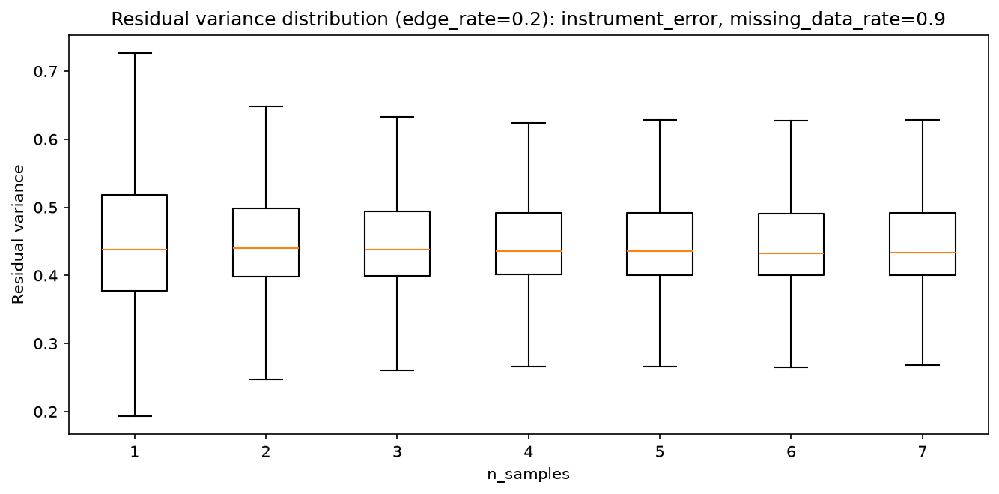

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_instrument_error_data_rate0.9_edge0.2.png


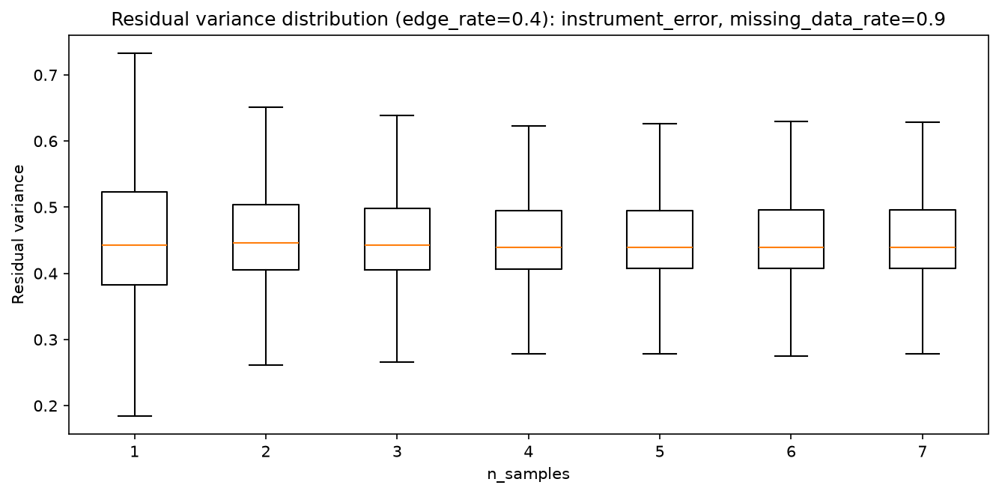

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_instrument_error_data_rate0.9_edge0.4.png


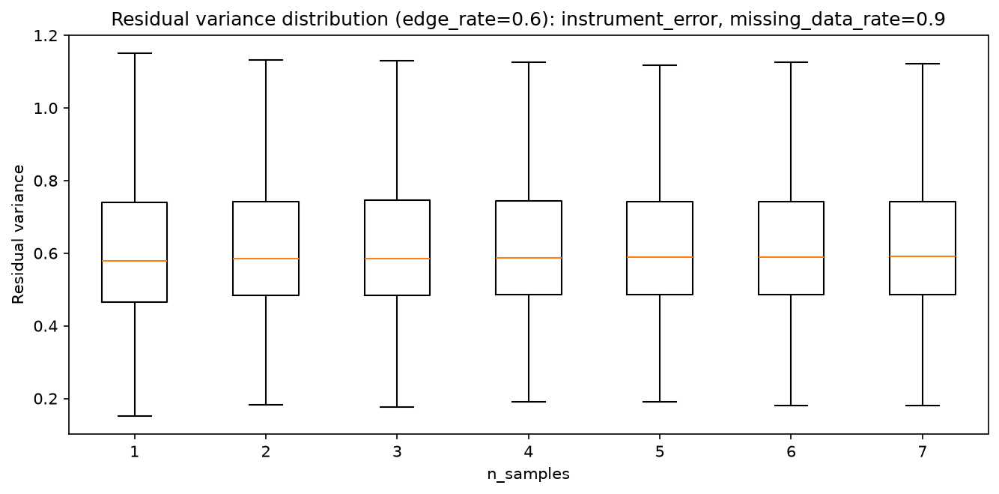

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_instrument_error_data_rate0.9_edge0.6.png


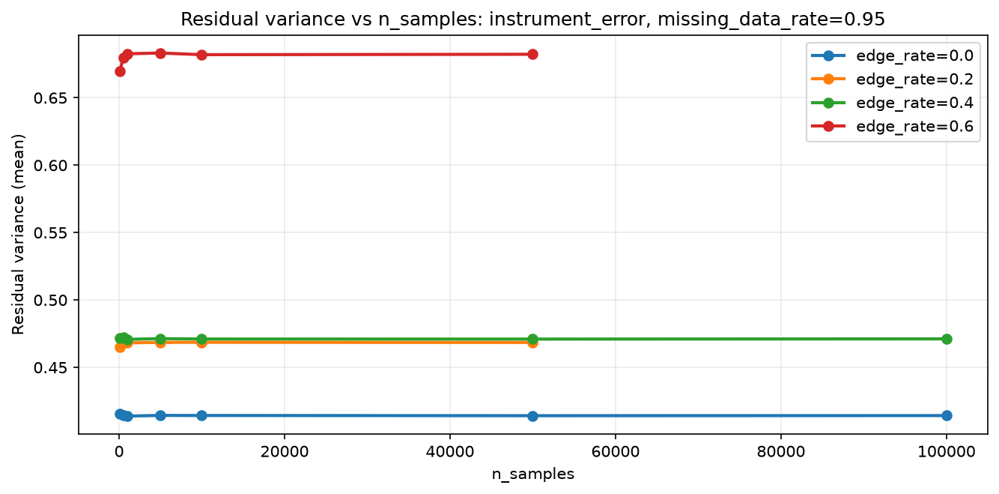

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_vs_n_instrument_error_data_rate0.95.png


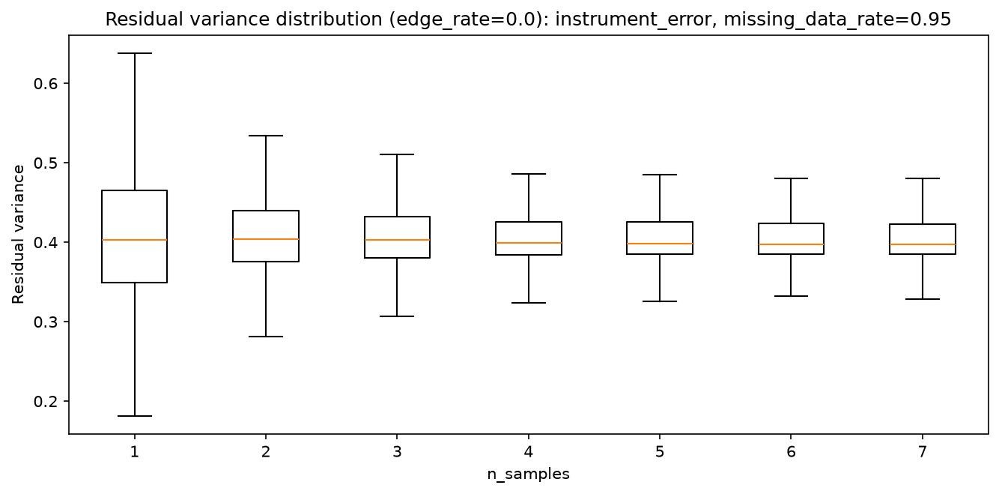

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_instrument_error_data_rate0.95_edge0.0.png


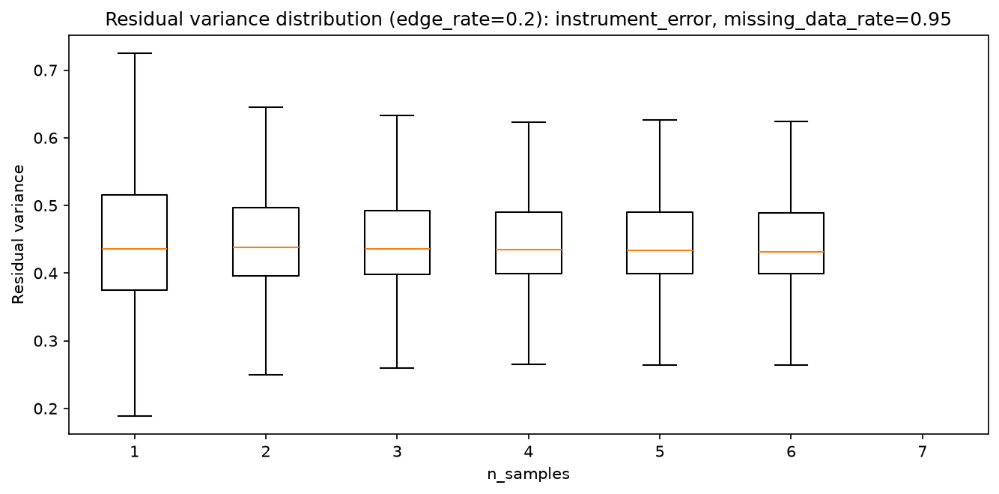

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_instrument_error_data_rate0.95_edge0.2.png


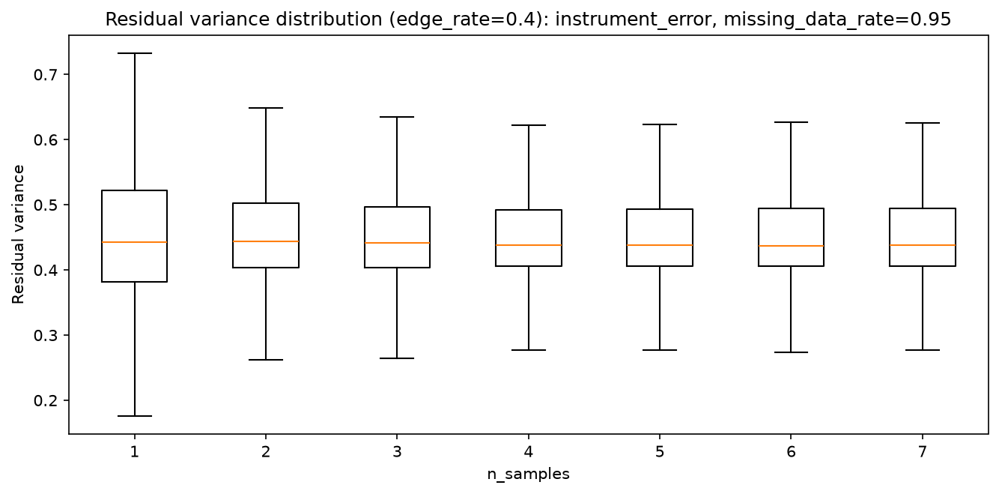

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_instrument_error_data_rate0.95_edge0.4.png


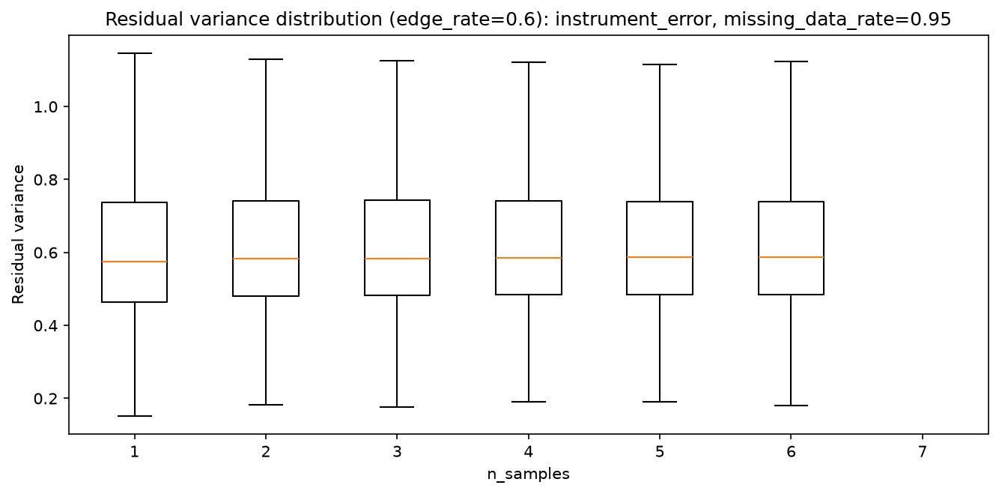

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_instrument_error_data_rate0.95_edge0.6.png


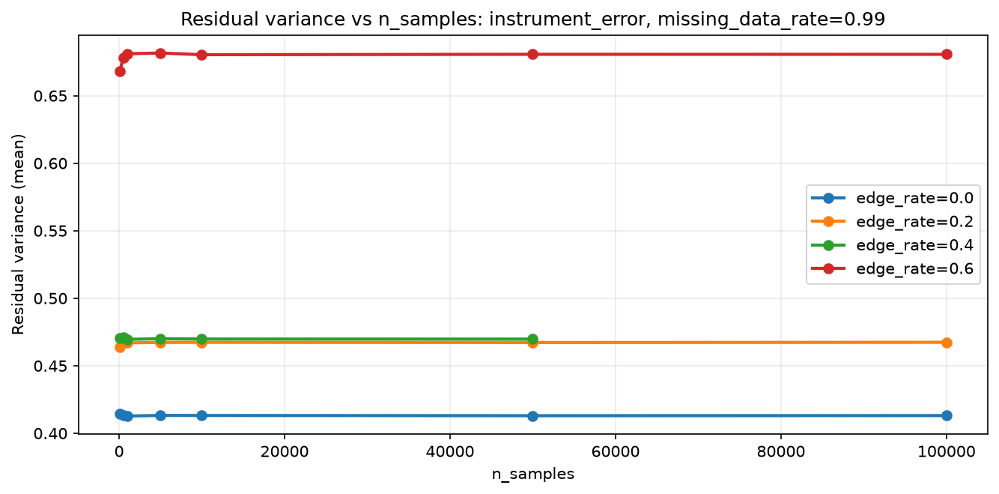

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_vs_n_instrument_error_data_rate0.99.png


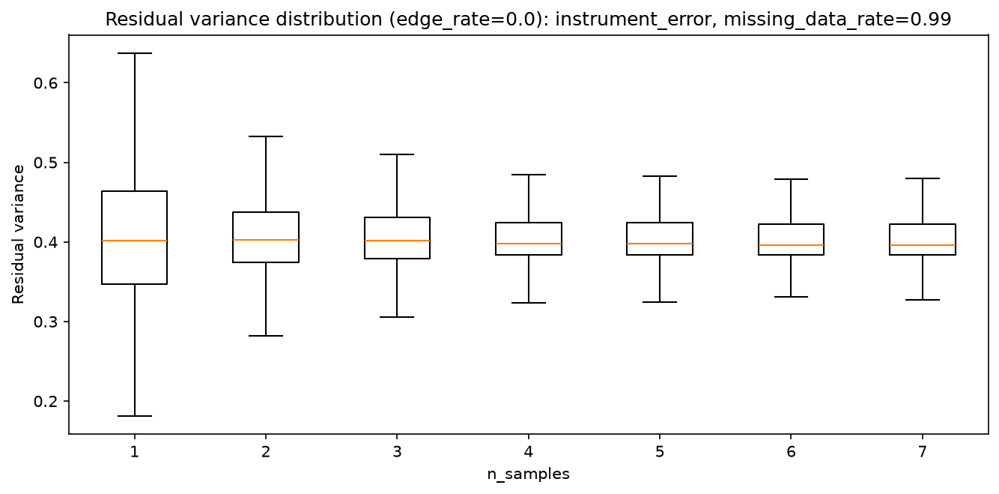

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_instrument_error_data_rate0.99_edge0.0.png


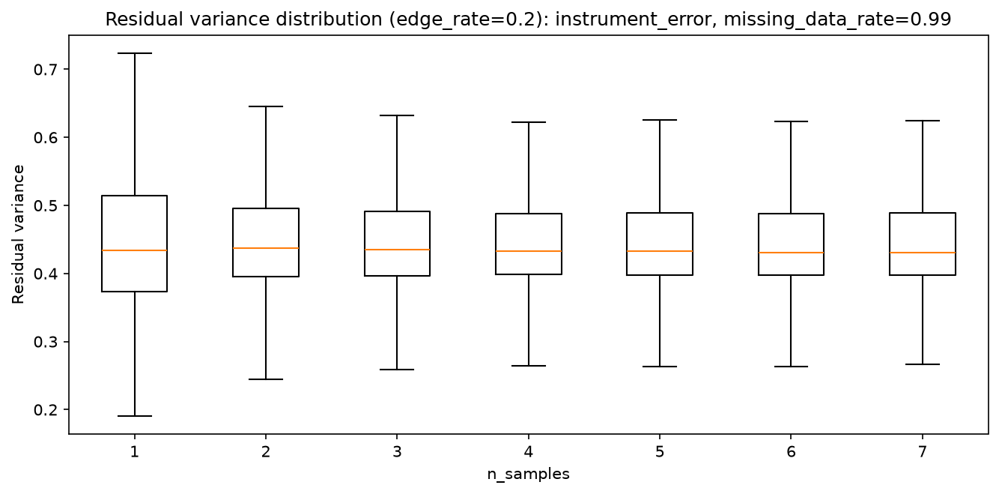

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_instrument_error_data_rate0.99_edge0.2.png


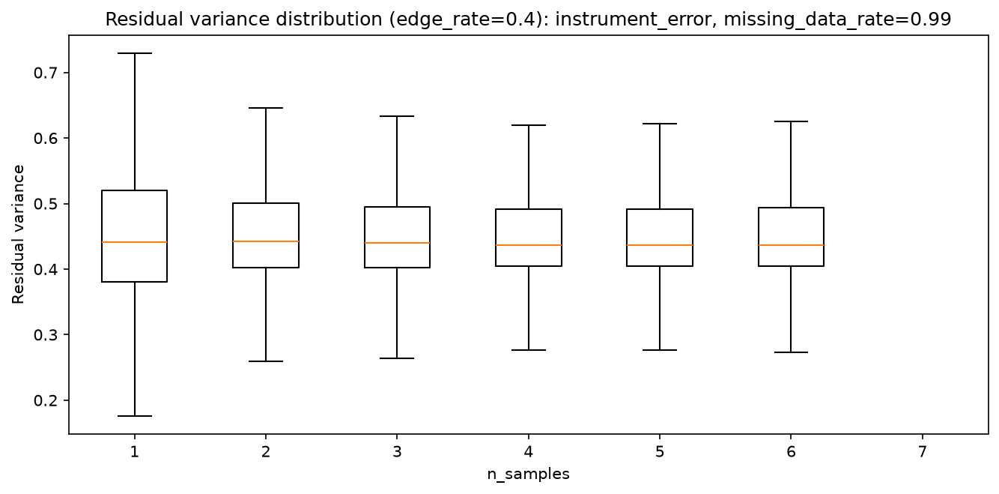

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_instrument_error_data_rate0.99_edge0.4.png


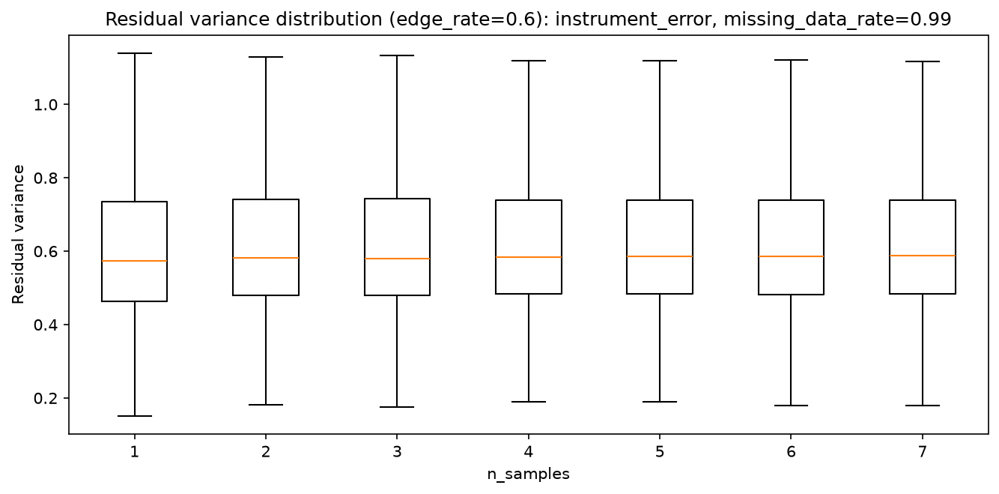

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_box_instrument_error_data_rate0.99_edge0.6.png


In [15]:
# Line plot residual variance vs n_samples (residual mean), plus one boxplot per setting.
plot_df = eval_df.dropna(subset=['residual_variance', 'n_samples']).copy()

for mech in sorted(plot_df['missing_data_mechanism'].unique()):
    for dr in sorted(plot_df['missing_data_rate'].unique()):
        sub = plot_df[
            (plot_df['missing_data_mechanism'] == mech) & (plot_df['missing_data_rate'] == dr)
        ].copy()
        if len(sub) == 0:
            continue

        edge_rates_sorted = sorted(sub['missing_edge_rate'].unique())
        ns_sorted = sorted(sub['n_samples'].unique())

        # Mean residual variance lines
        fig, ax = plt.subplots(figsize=(9, 4.5))
        for er in edge_rates_sorted:
            s2 = res[
                (res['missing_data_mechanism'] == mech)
                & (res['missing_data_rate'] == dr)
                & (res['missing_edge_rate'] == er)
            ].sort_values('n_samples')
            ax.plot(
                s2['n_samples'],
                s2['residual_mean'],
                marker='o',
                linewidth=2,
                label=f'edge_rate={er}',
            )

        ax.set_xlabel('n_samples')
        ax.set_ylabel('Residual variance (mean)')
        ax.set_title(f'Residual variance vs n_samples: {mech}, missing_data_rate={dr}')
        ax.grid(True, alpha=0.25)
        ax.legend()
        plt.tight_layout()

        out = VIZ_DIR / f'csd_estimation_residual_vs_n_{mech}_data_rate{dr}.png'
        plt.savefig(out, dpi=150, bbox_inches='tight')
        plt.close()
        display(Image(str(out)))
        print(f'Saved: {out}')

        # Distribution via boxplot for the edge-rates
        for er in edge_rates_sorted:
            box_sub = sub[sub['missing_edge_rate'] == er]
            if len(box_sub) > 0:
                data_by_n = [
                    box_sub[box_sub['n_samples'] == n]['residual_variance'].dropna().values
                    for n in ns_sorted
                ]
                fig2, ax2 = plt.subplots(figsize=(9, 4.5))
                ax2.boxplot(data_by_n, label=[str(n) for n in ns_sorted], showfliers=False)
                ax2.set_xlabel('n_samples')
                ax2.set_ylabel('Residual variance')
                ax2.set_title(
                    f'Residual variance distribution (edge_rate={er}): {mech}, missing_data_rate={dr}'
                )
                plt.tight_layout()
                out2 = VIZ_DIR / f'csd_estimation_residual_box_{mech}_data_rate{dr}_edge{er}.png'
                plt.savefig(out2, dpi=150, bbox_inches='tight')
                plt.close()
                display(Image(str(out2)))
                print(f'Saved: {out2}')


## 4) Residual variance vs estimation error

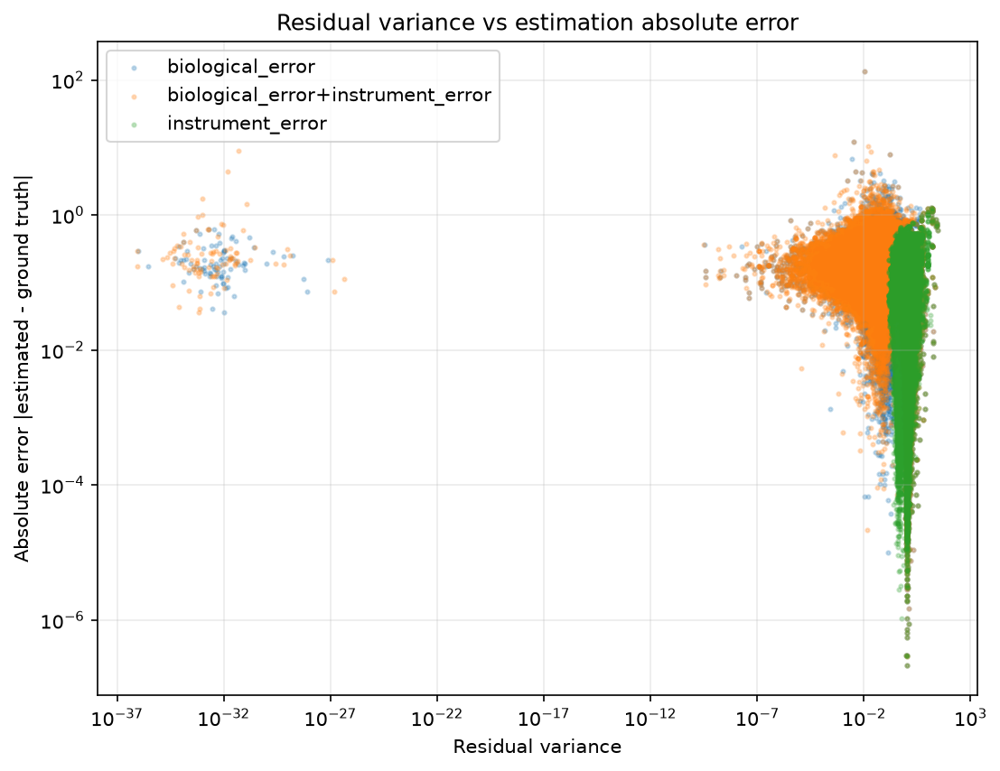

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/visualizations/csd_estimation_residual_vs_abs_error.png


In [16]:
plot_df = eval_df.dropna(subset=['residual_variance', 'abs_error', 'missing_data_mechanism']).copy()

fig, ax = plt.subplots(figsize=(7.5, 5.8))
for mech in sorted(plot_df['missing_data_mechanism'].unique()):
    s2 = plot_df[plot_df['missing_data_mechanism'] == mech]
    ax.scatter(
        s2['residual_variance'],
        s2['abs_error'],
        s=4,
        alpha=0.25,
        label=mech,
        rasterized=True,
    )

ax.set_xlabel('Residual variance')
ax.set_ylabel('Absolute error |estimated - ground truth|')
ax.set_title('Residual variance vs estimation absolute error')
ax.set_xscale('log')
ax.set_yscale('log')
ax.grid(True, which='both', alpha=0.25)
ax.legend()

plt.tight_layout()
out = VIZ_DIR / 'csd_estimation_residual_vs_abs_error.png'
plt.savefig(out, dpi=150, bbox_inches='tight')
plt.close()

display(Image(str(out)))
print(f'Saved: {out}')


In [17]:
# Correlation summary per setting (helps interpret residual changes)
def corr_safe(x: pd.Series, y: pd.Series) -> float:
    if len(x) < 3:
        return float('nan')
    return float(np.corrcoef(x, y)[0, 1])

link = (
    eval_df.groupby(['missing_data_mechanism', 'missing_data_rate', 'missing_edge_rate', 'n_samples'], dropna=False)
    .apply(lambda d: pd.Series({
        'corr_resid_vs_abs_error': corr_safe(d['residual_variance'].fillna(0.0), d['abs_error'].fillna(0.0)),
        'residual_mean': float(d['residual_variance'].mean()),
        'MAE': float(d['abs_error'].mean()),
        'n': len(d),
    }))
    .reset_index()
)

link_csv = NB_DIR / 'csd_estimation_residual_vs_error_link_summary.csv'
link.to_csv(link_csv, index=False)
print(f'Wrote link summary: {link_csv}')

print('Top 10 settings by residual_mean:')
display(link.sort_values('residual_mean', ascending=False).head(10))


Wrote link summary: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260805_174708/csd_estimation_residual_vs_error_link_summary.csv
Top 10 settings by residual_mean:


,missing_data_mechanism,missing_data_rate,missing_edge_rate,n_samples,corr_resid_vs_abs_error,residual_mean,MAE,n
131,biological_error+instrument_error,0.0,0.6,100,0.368281,1.366419,0.101099,5066.0
239,instrument_error,0.0,0.6,100,0.368281,1.366419,0.101099,2533.0
20,biological_error,0.0,0.6,100,0.368281,1.366419,0.101099,2533.0
133,biological_error+instrument_error,0.0,0.6,1000,0.496125,1.365790,0.051692,2533.0
22,biological_error,0.0,0.6,1000,0.496125,1.365790,0.051692,2533.0
241,instrument_error,0.0,0.6,1000,0.496125,1.365790,0.051692,2533.0
21,biological_error,0.0,0.6,500,0.493639,1.363723,0.061338,2533.0
132,biological_error+instrument_error,0.0,0.6,500,0.493639,1.363723,0.061338,2533.0
240,instrument_error,0.0,0.6,500,0.493639,1.363723,0.061338,2533.0
242,instrument_error,0.0,0.6,5000,0.500802,1.363003,0.042984,2533.0
